In [1]:
from __future__ import print_function, division

import numpy as np
#import pandas as pd

import astropy.units as u
import astropy.coordinates as apycoord
from astropy.nddata import block_replicate
from astropy.table import Table, Column, MaskedColumn

#from astropy.stats import sigma_clip
from astropy.modeling import models, fitting
import scipy.stats as stats

#from glowing_waffles.differential_photometry import catalog_search
from glowing_waffles.differential_photometry  import filter_transform
from glowing_waffles.io import parse_aij_table
from notebook_functions import scale_and_downsample, source_ra, source_error, source_column, uniformize_source_names, \
    huber_loss, find_apass_stars, find_known_variables, plot_apass_variables, get_RA_Dec, get_color, plot_magnitudes, \
    color_corrections, mag_error, corrected_curves, plot_magnitudes_viewer
#import notebook_functions
from ccdproc import CCDData

from scipy import optimize

%matplotlib inline
import matplotlib.pyplot as plt


# Read image

In [2]:
ccd = CCDData.read('Tres-3b-001R.fit', unit='adu')   #Read in a single fits image

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [ccdproc.ccddata]


In [3]:
apass, apass_x, apass_y, apass_in_bright, in_apass_x, in_apass_y = find_apass_stars(ccd)
vsx, vsx_x, vsx_y, vsx_names = find_known_variables(ccd)

In [4]:
disp = scale_and_downsample(ccd.data, downsample=1)

        Use `~astropy.visualization.mpl_normalize.simple_norm` instead. [notebook_functions]
        Use `~astropy.visualization.mpl_normalize.simple_norm` instead.


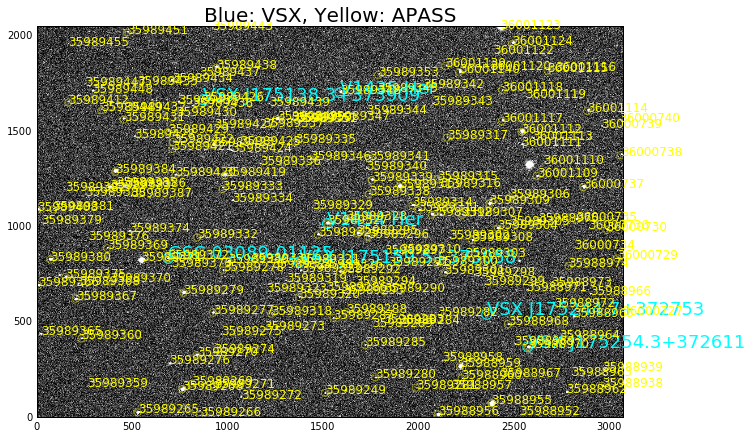

In [5]:
plot_apass_variables(ccd, disp, vsx_x, vsx_y, vsx_names, apass, in_apass_x, in_apass_y, apass_x, apass_y)

In [6]:
#Get the magnitudes of the apass stars
apass_mags = apass_in_bright['r_mag']
apass_ra, apass_dec = get_RA_Dec(apass_in_bright)
apass_color, apass_color_error = get_color(apass_in_bright)


all_apass_ra, all_apass_dec = get_RA_Dec(apass)
all_apass_color, all_apass_color_error = get_color(apass)



#Read in the raw measurements file in case the parse function doesn't work as expected
aij_raw = Table.read('../Measurements/tres_3_measurements_3.csv')
#Get the sources
sources = uniformize_source_names(aij_raw)

#Use glowing waffles to parse the measurements file
aij_stars = parse_aij_table('../Measurements/tres_3_measurements_3.csv')

#get the ra (which aij gives in hour angle) from the raw aij data
aij_ra = [np.mean(aij_raw[source_ra(source)])*u.hourangle for source in sources]
#get the dec from the raw aij data
aij_dec = [star.dec.mean() for star in aij_stars]
#get the julian date from parsed measurements file
aij_jd = aij_stars[0].jd_utc_start

#Calculate the aij instrumental magnitudes fromt he raw measuremnets file to compare to those from glowing waffles
aij_mags = [-2.5*np.log10(aij_raw[source_column(source)])+2.5*np.log10(aij_raw['EXPOSURE']) for source in sources]

#turn that magnitude list into an array
aij_mags = np.array(aij_mags)

#Create a list of aij coordinates using apycoord.SkyCoord function
aij_coordinates = apycoord.SkyCoord(aij_ra, aij_dec, unit=(u.deg, u.deg))
#create a list of well defined apass stars' coordinates using apycoord.SkyCoord function
apass_coordinates = apycoord.SkyCoord(apass_ra, apass_dec, unit='deg')
#create a list of all of the apass stars' coordiantes using apycoord.SkyCoord function
apass_coordinates_for_color = apycoord.SkyCoord(all_apass_ra, all_apass_dec, unit='deg')

-2.59734659646 -8.22313540409
-8.66184964457


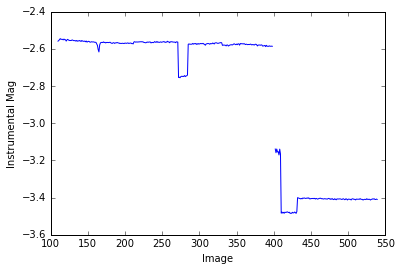

In [7]:
plt.plot(aij_mags[4])     #Plot one of the stars just to see what it looks like
plt.ylabel('Instrumental Mag')
plt.xlabel('Image')

#compare different ways to get magnitudes.
print(aij_mags[0][0], aij_stars[0].magnitude[0])
print(-2.5*np.log10(174940.8)+2.5*np.log10(60))

In [8]:
#find the matches of the apass stars and the aij stars. apass_index is a list where each index cooresponds to the index of
#the aij stars and the value of that index corresponds to the index of the matchin apass star
apass_index, d2d, d3d = apycoord.match_coordinates_sky(aij_coordinates, apass_coordinates)

#create a boolean of all of the matches that have a discrepancy of less then 5 arcseconds
good_match = d2d < 5*u.arcsecond

#same matching thing but for ALL of the apass stars
apass_index_for_color, d2d, d3d = apycoord.match_coordinates_sky(aij_coordinates, apass_coordinates_for_color)
good_match_for_color = d2d < 5*u.arcsecond
#Issue 7/22/2016 the number of matches are very few but the image
#overlay in the cells above shows many pretty good looking matches.
#is there a problem with the coordinate comparisons? - SOLVED

# APASS Filter Corrections
## Transform the APASS r magnitudes into R magnitudes using APASS r and i magnitudes

The equation used is R-feder - r-apass = A*c**3 + B*c**2 + C*c + D

Where...

In [9]:
#Transform the apass magnitudes into the R filter we use
apass_R_mags = filter_transform(apass_in_bright, 'R', r='r_mag', i='i_mag')

## Color Corrections Using astropy fit

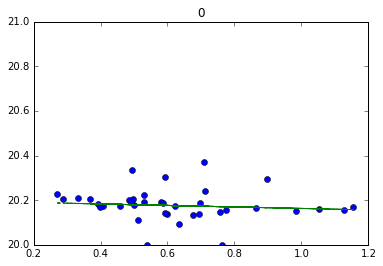

-0.0333760154209


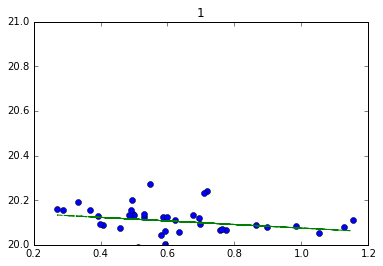

-0.0799397430018


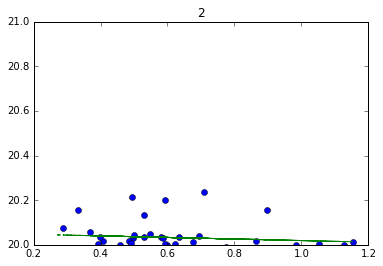

-0.0348617753038


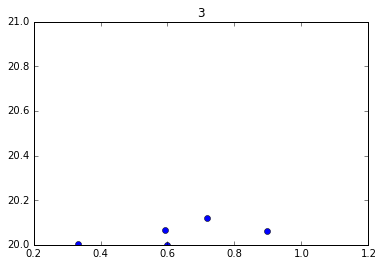

-0.0787735830417


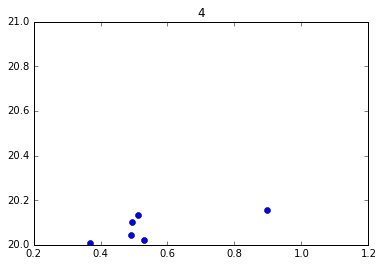

-0.0465877422716


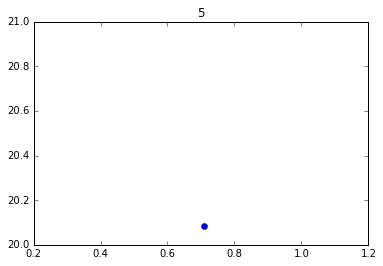

-0.145980992896


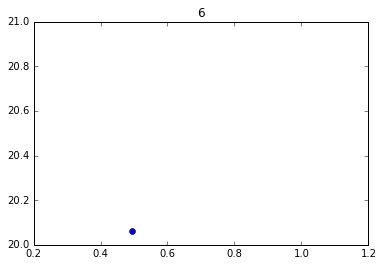

-0.0471211195325


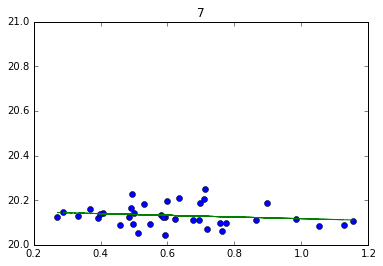

-0.0375483043526


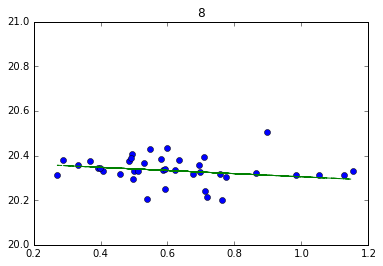

-0.0706820244598


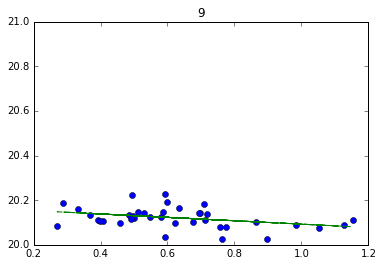

-0.0759340467198


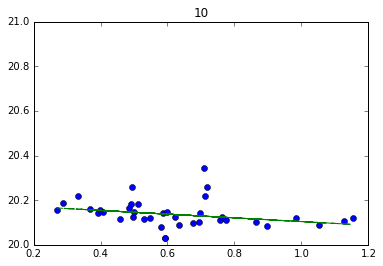

-0.0833044783133


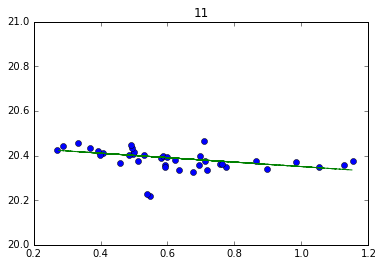

-0.0999756195424


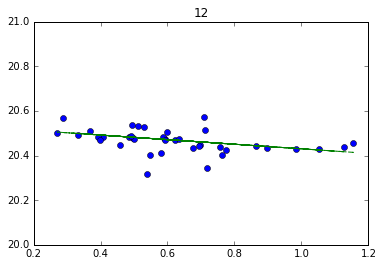

-0.102661242069


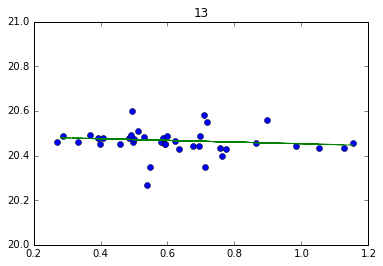

-0.0374549055673


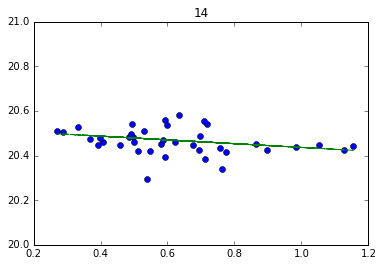

-0.0842519182979


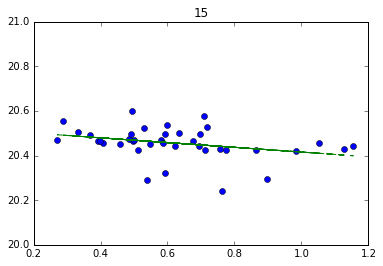

-0.106306443783


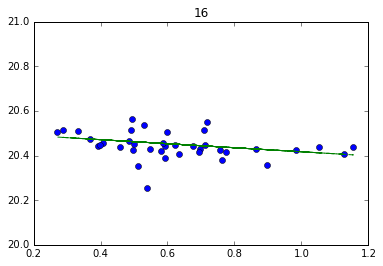

-0.0902609971361


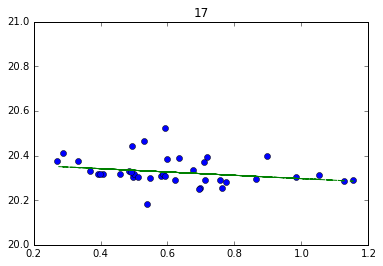

-0.0742042705429


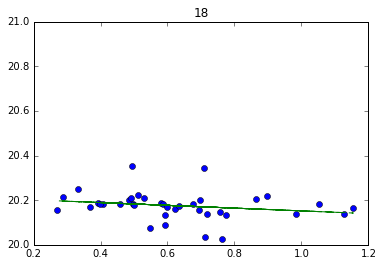

-0.0618818668474


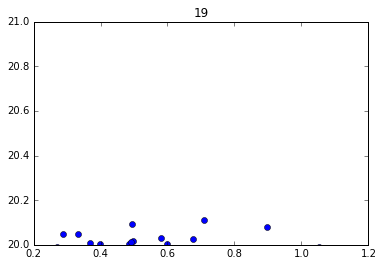

-0.0358842822633


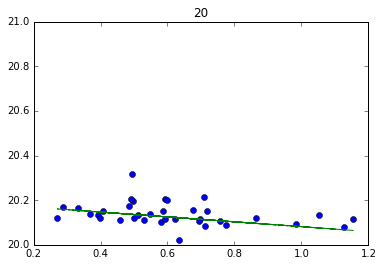

-0.109024037883


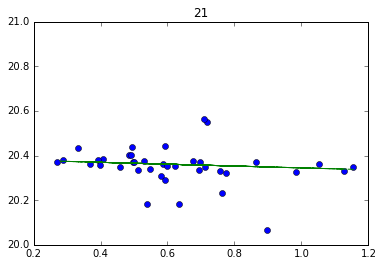

-0.0416155678061


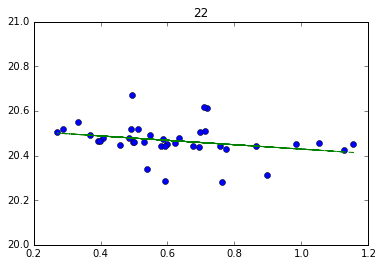

-0.098290981377


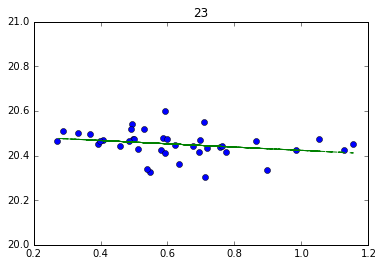

-0.0737748238304


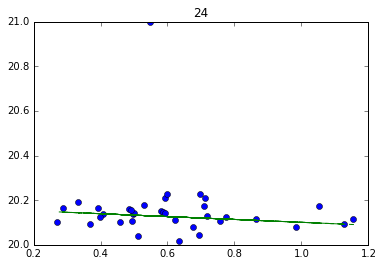

-0.0642584191635


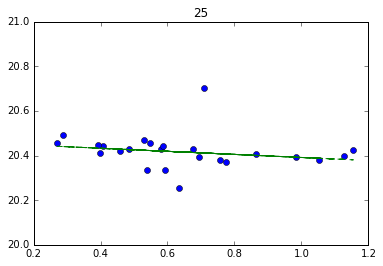

-0.0686668404687


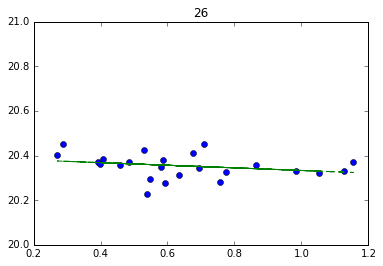

-0.0581989457599


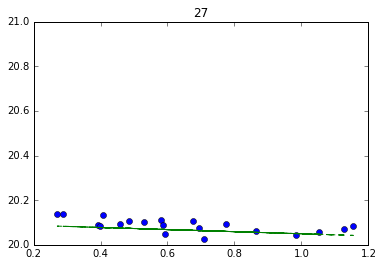

-0.0470201824992


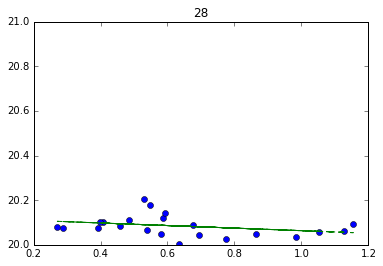

-0.0574346243056


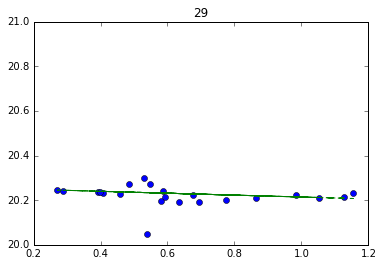

-0.0426686263362


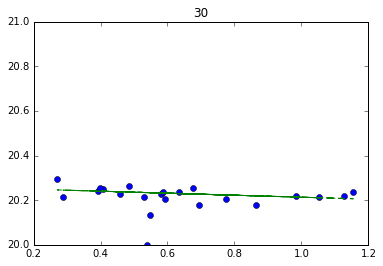

-0.0447250547974


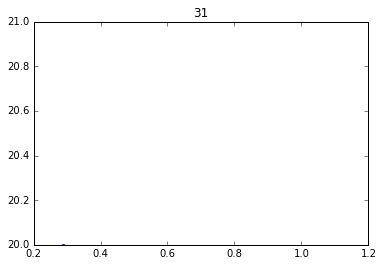

-0.0361557105409


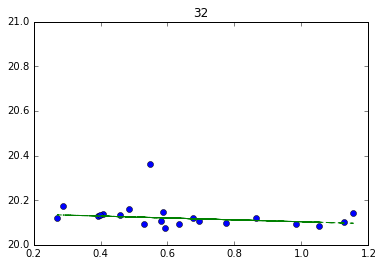

-0.0424796903763


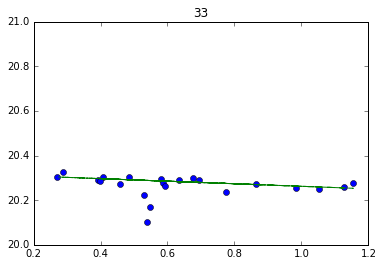

-0.0571397219964


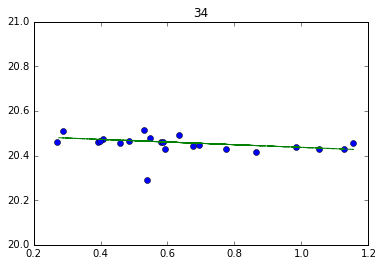

-0.0595266958837


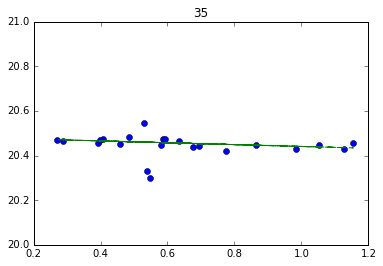

-0.0412219480331


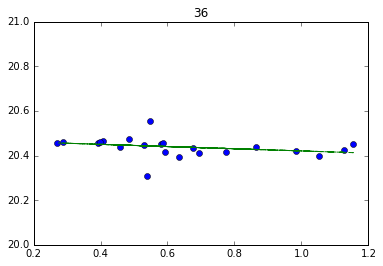

-0.0492022635925


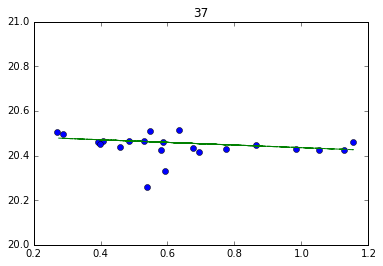

-0.0588932551416


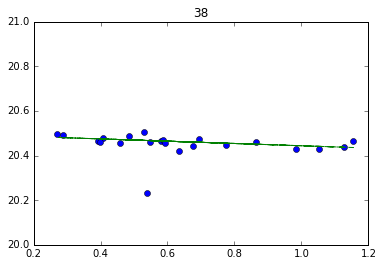

-0.0511398915882


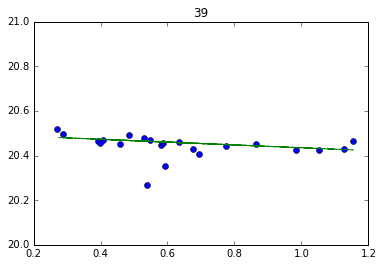

-0.063152022262


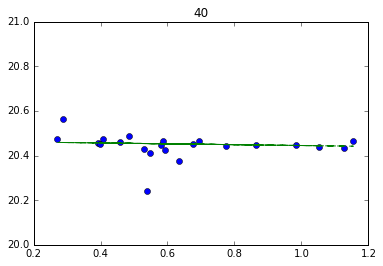

-0.0189894560136


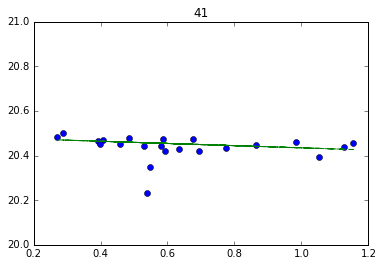

-0.0490654023721


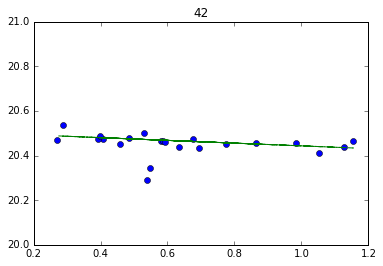

-0.0613124664896


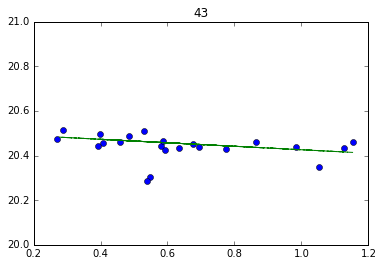

-0.078016953445


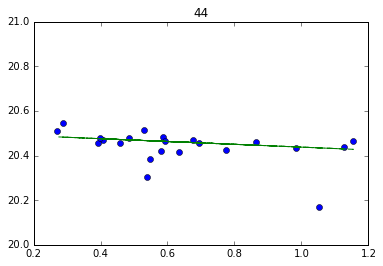

-0.0630394678039


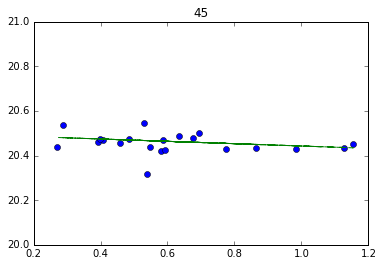

-0.0524305140041


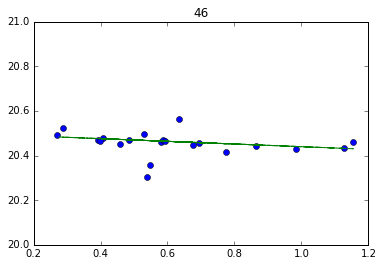

-0.0599238212281


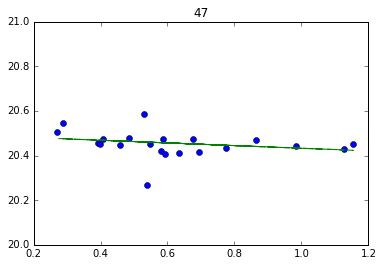

-0.0598171654238


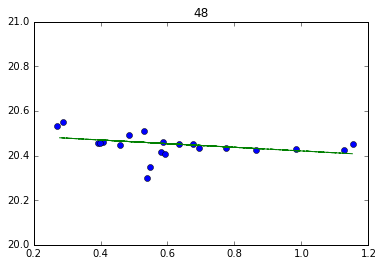

-0.0817502627908


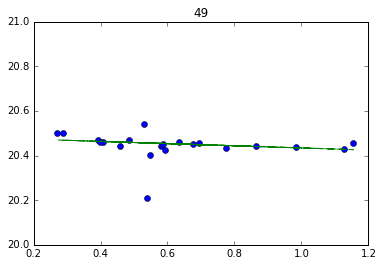

-0.0488572326051


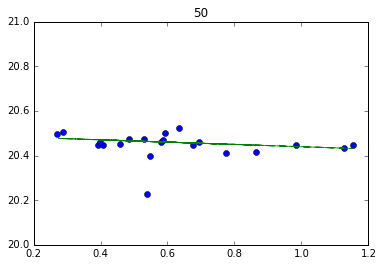

-0.0514865685356


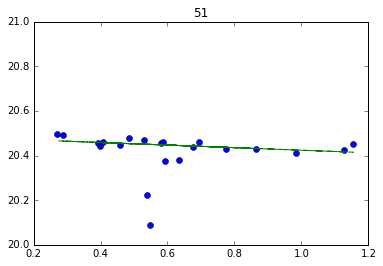

-0.0577079679314


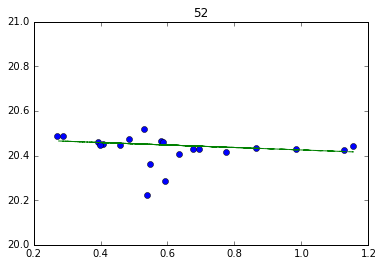

-0.0554500832622


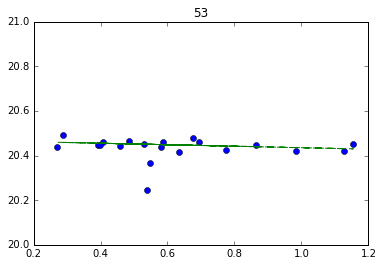

-0.0332932509833


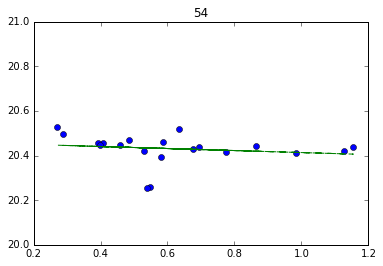

-0.0452203033532


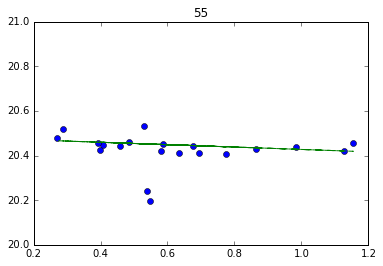

-0.0534719139866


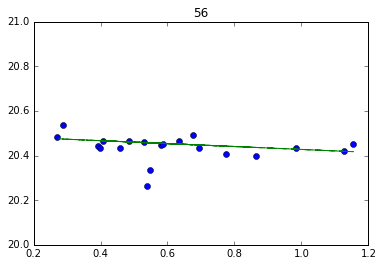

-0.0652850143088


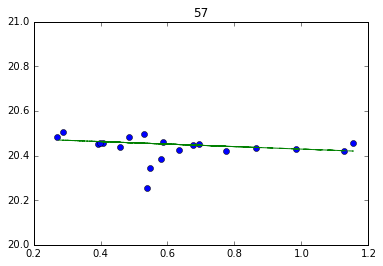

-0.0561382614621


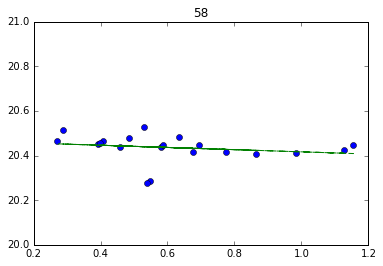

-0.0491950032037


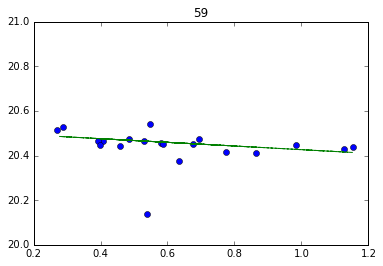

-0.0819591582848


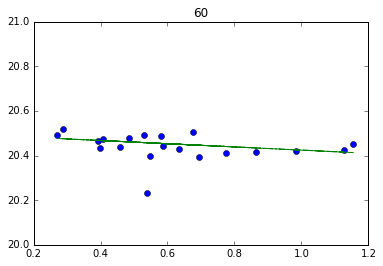

-0.0715425166183


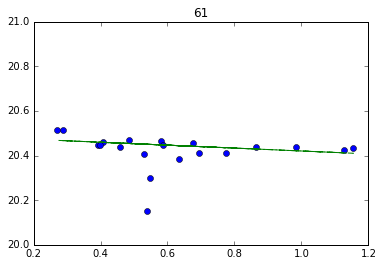

-0.0652836500016


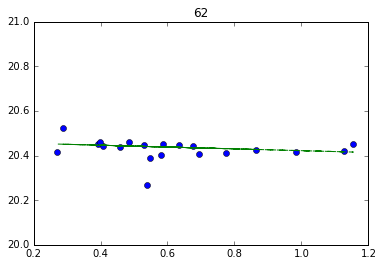

-0.0405836783797


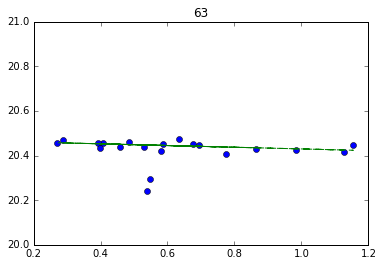

-0.0381103763484


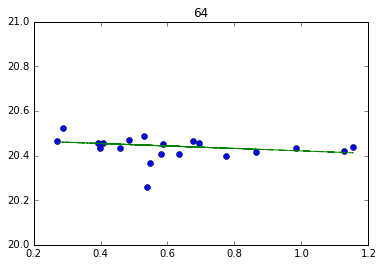

-0.0552464481822


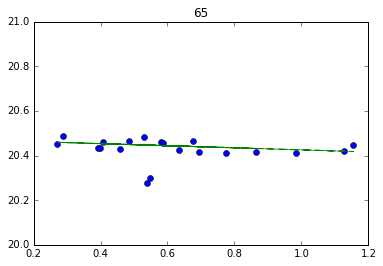

-0.0466207062064


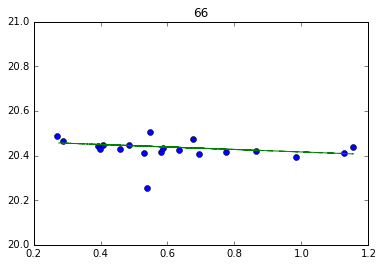

-0.055813631462


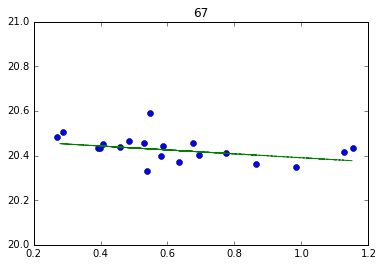

-0.0876084714601


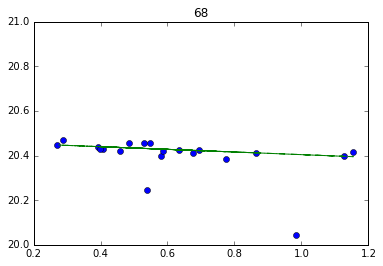

-0.0592454147324


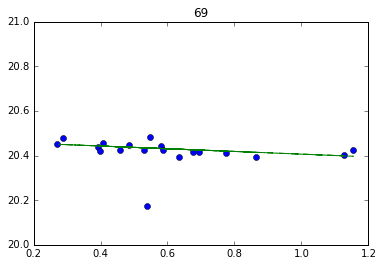

-0.0607482782228


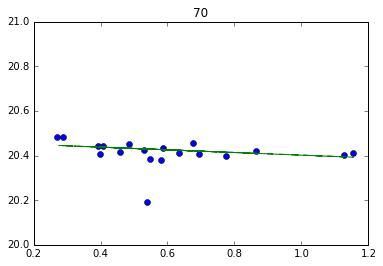

-0.0598390156375


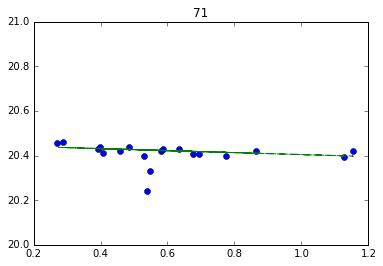

-0.0445374312354


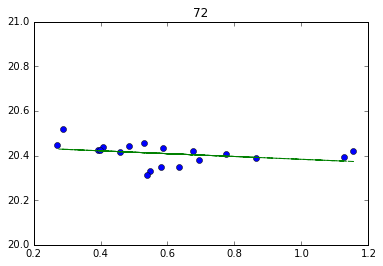

-0.0632362817894


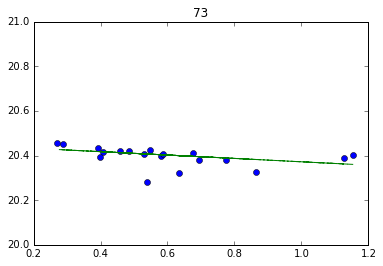

-0.0755708808112


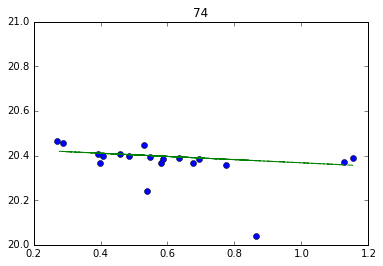

-0.0713098143181


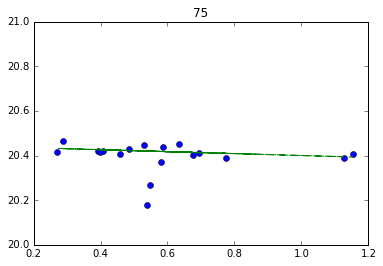

-0.0433778033935


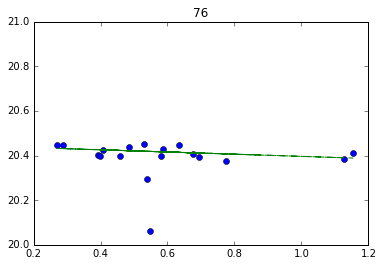

-0.0489928912871


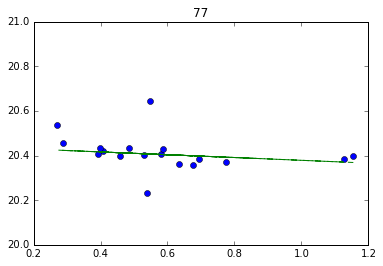

-0.0626563698096


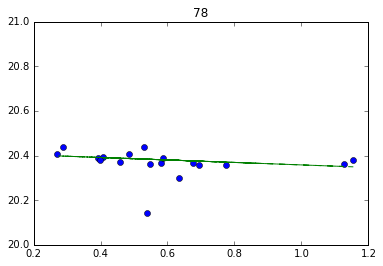

-0.0554971177163


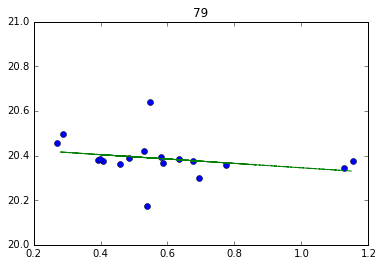

-0.0981920671777


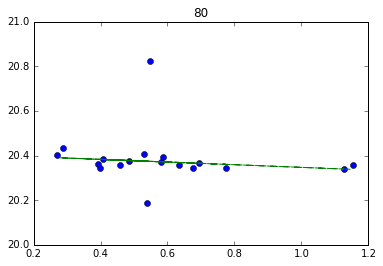

-0.0594913109676


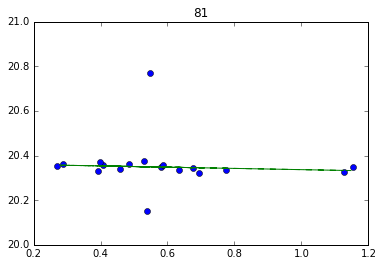

-0.0277780334556


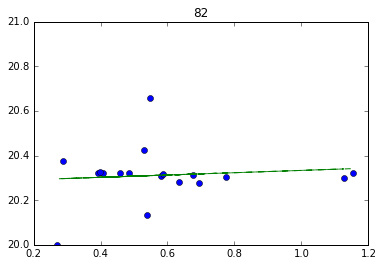

0.0516376281113


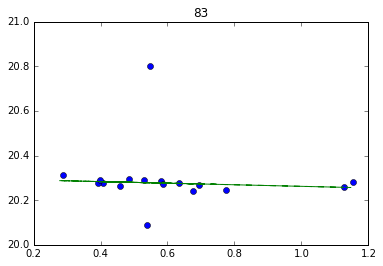

-0.0353754819977


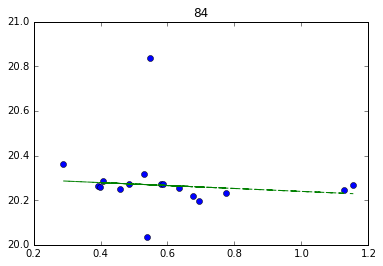

-0.0656508495742


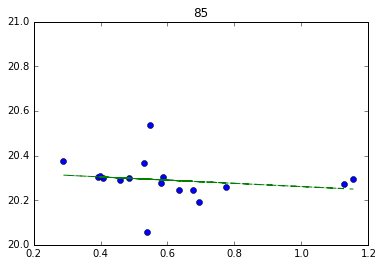

-0.0720993645616


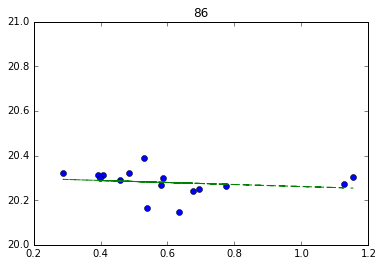

-0.0452233874229


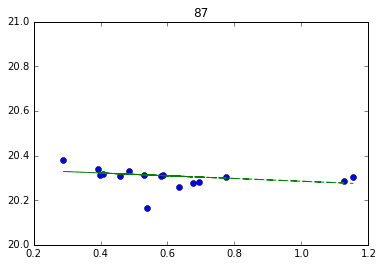

-0.0617195168003


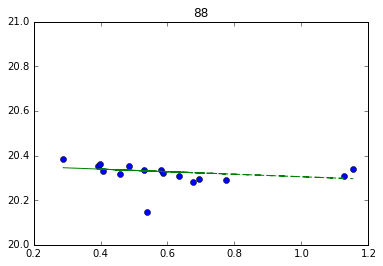

-0.0567775441145


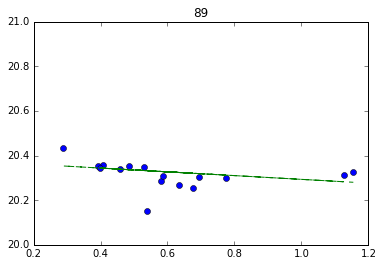

-0.0842599199032


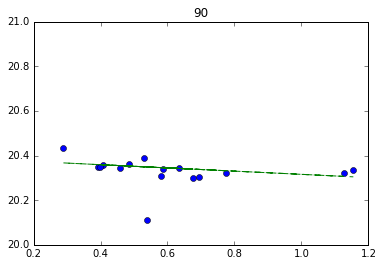

-0.0721050009973


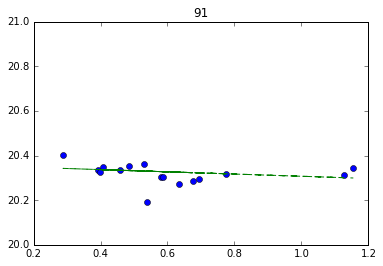

-0.0496610561475


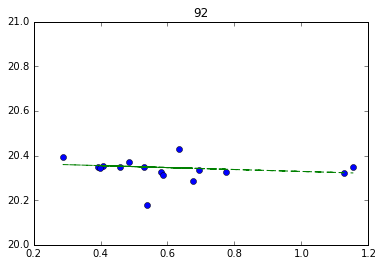

-0.043372918778


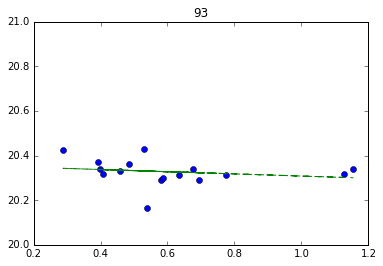

-0.0487444408371


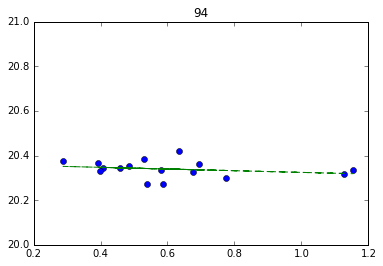

-0.0377375082364


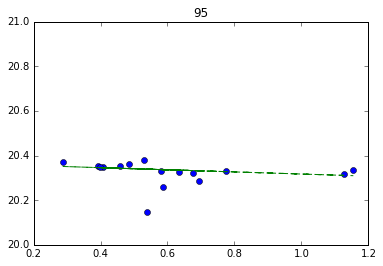

-0.0475034846995


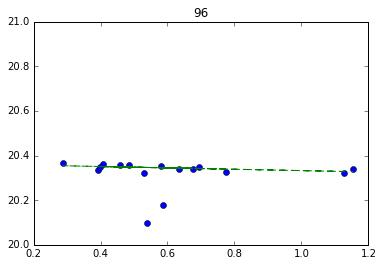

-0.0306911608744


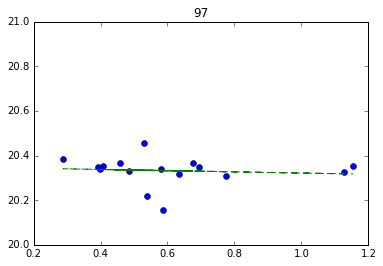

-0.0269387323863


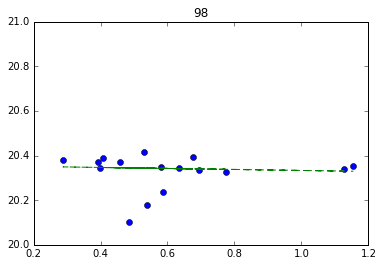

-0.0224293840323


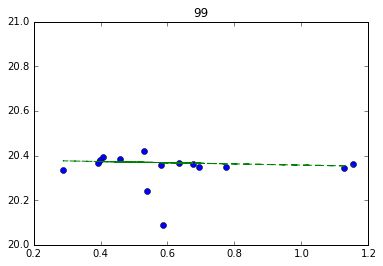

-0.0267289770408


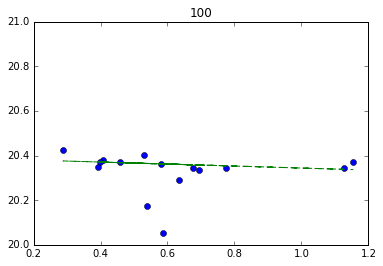

-0.0446281150238


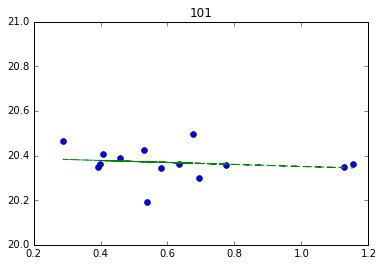

-0.0445281577208


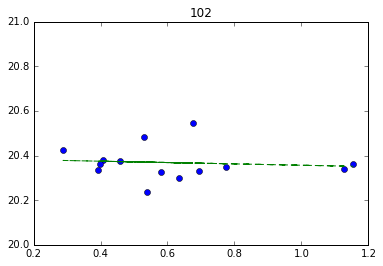

-0.0300800992841


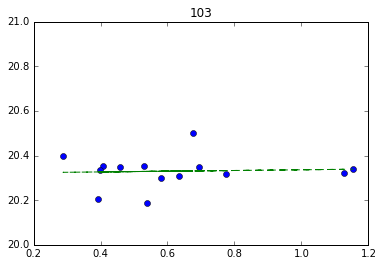

0.0159561465182


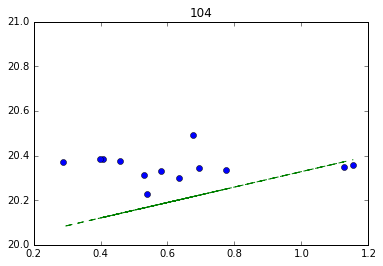

0.345959891705


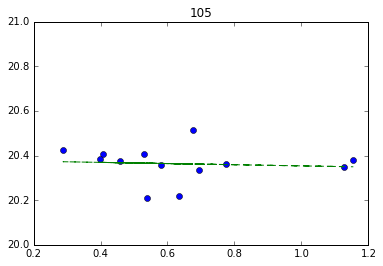

-0.0260937448483


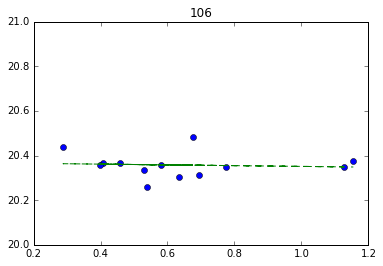

-0.0169564636908


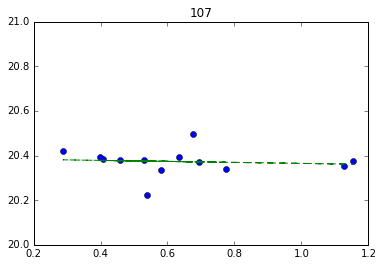

-0.022406305638


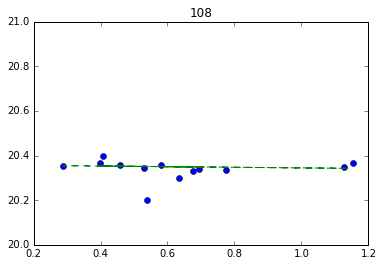

-0.0139943153362


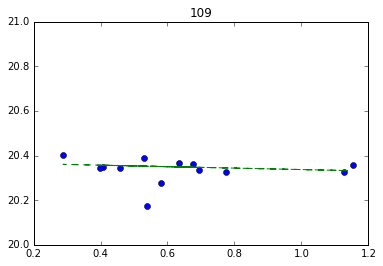

-0.0326988610329


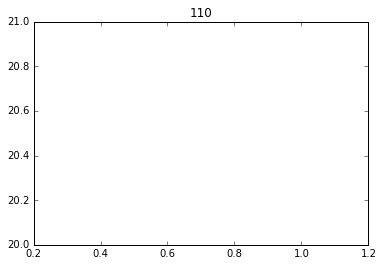

-0.0500967537877


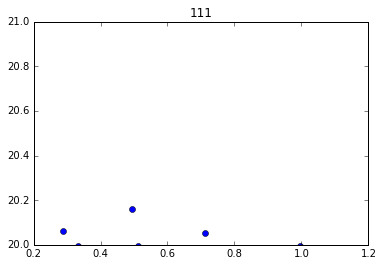

-0.0556795899916


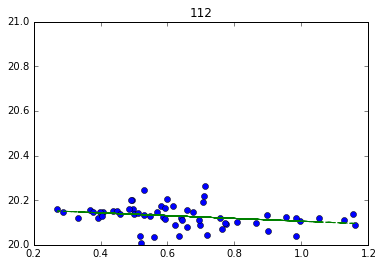

-0.0626457157549


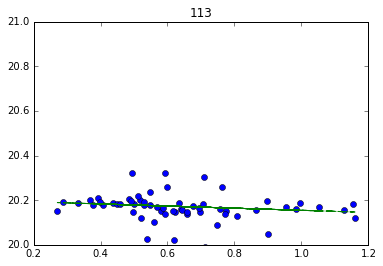

-0.0474885295788


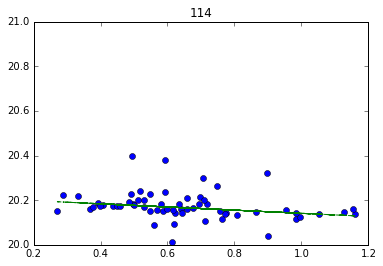

-0.0711033054464


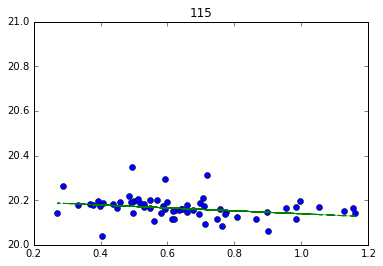

-0.0658204782667


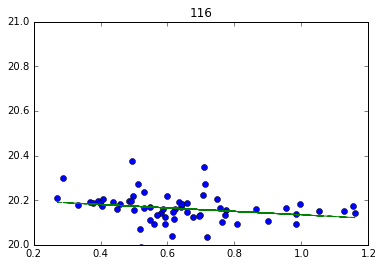

-0.0773554201615


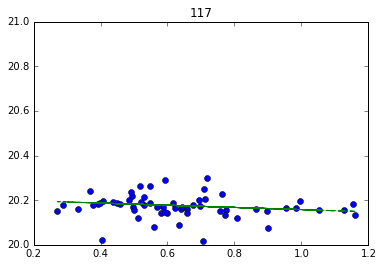

-0.048813775389


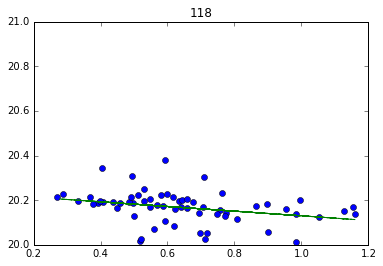

-0.104557115235


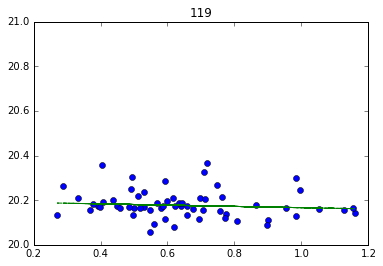

-0.0283969805596


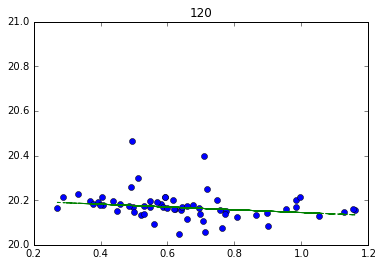

-0.0624216971695


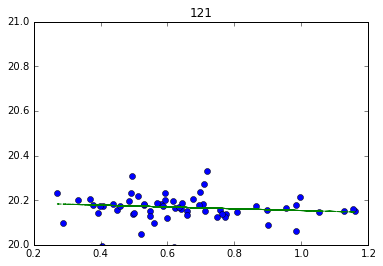

-0.0404725304812


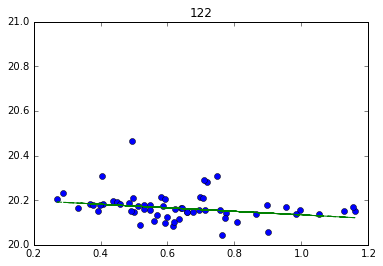

-0.079051151936


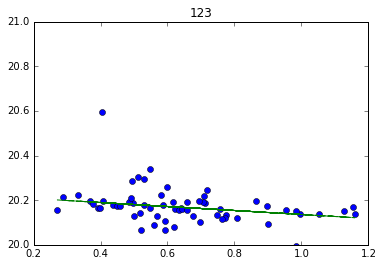

-0.0894489608106


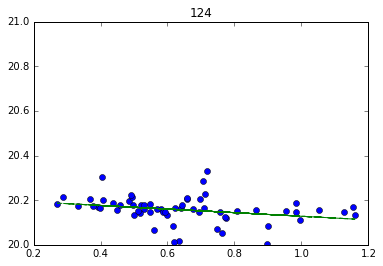

-0.0806601940199


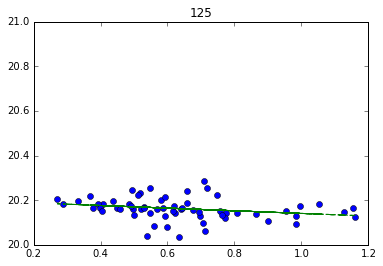

-0.0591173852682


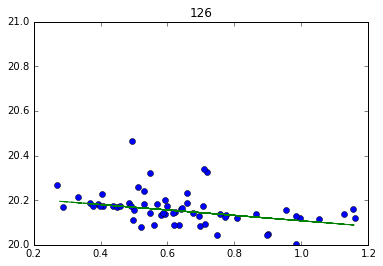

-0.121115297555


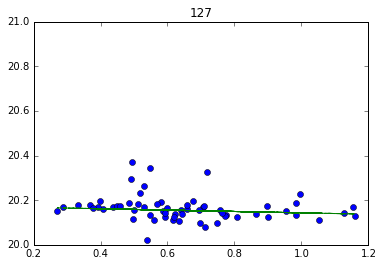

-0.0306333388384


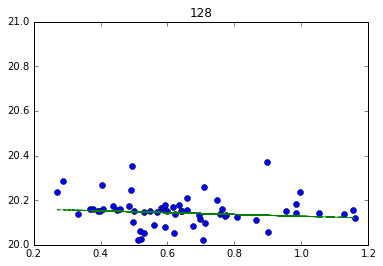

-0.0402375664506


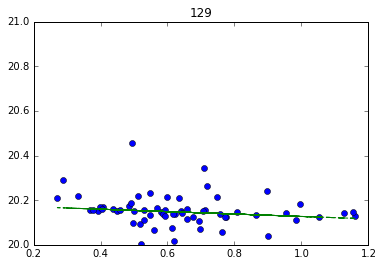

-0.0540828882382


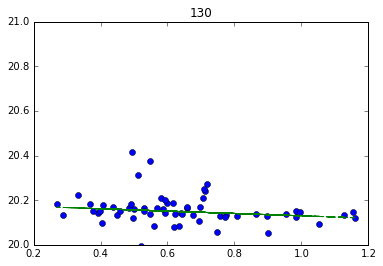

-0.0527708079465


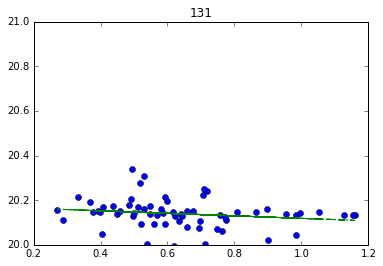

-0.0562999865263


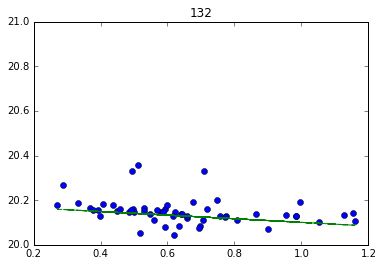

-0.080938236921


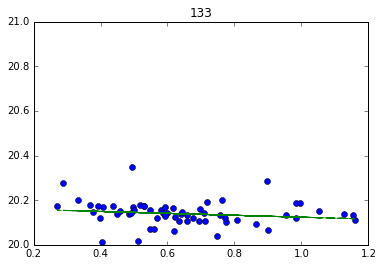

-0.0428021331374


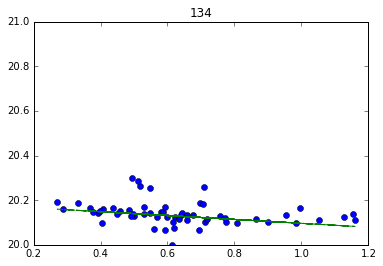

-0.0869741871892


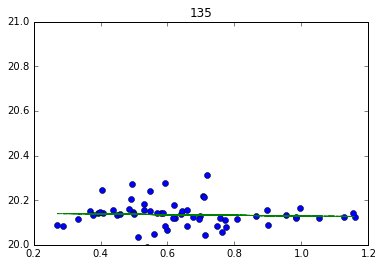

-0.0145743670127


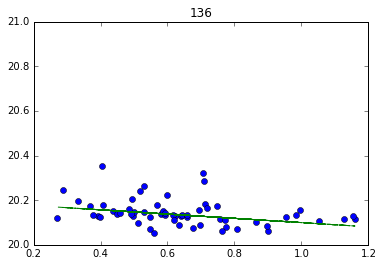

-0.0953796165875


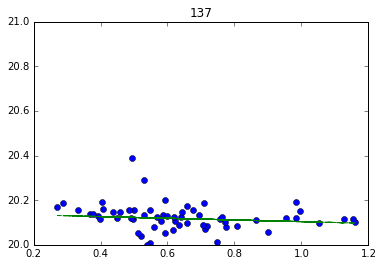

-0.0379218276717


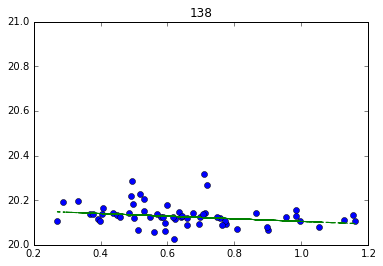

-0.0587086533549


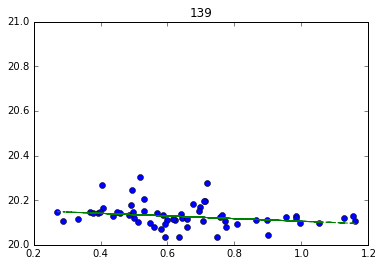

-0.0591830127371


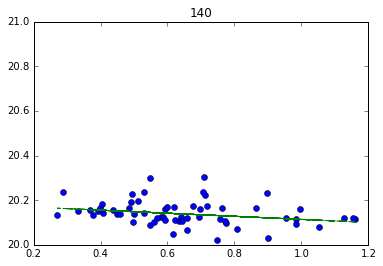

-0.0687682074251


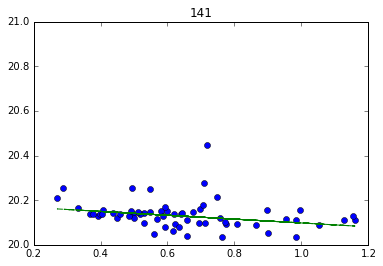

-0.0862413449963


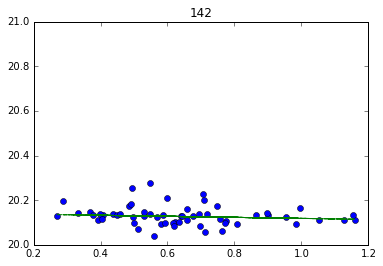

-0.0231039885084


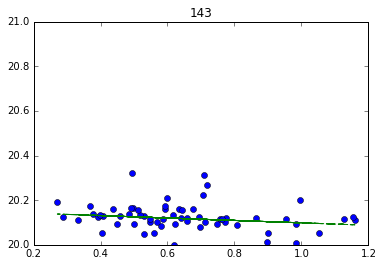

-0.0542055113526


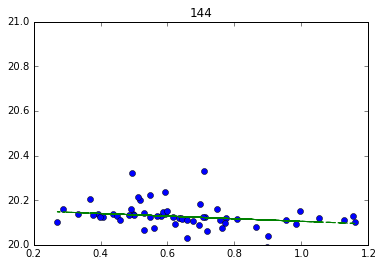

-0.0584103847907


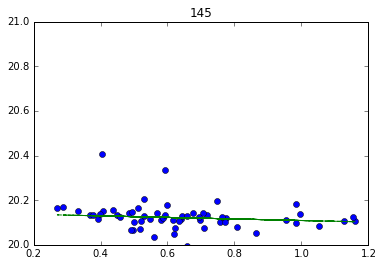

-0.0344928359685


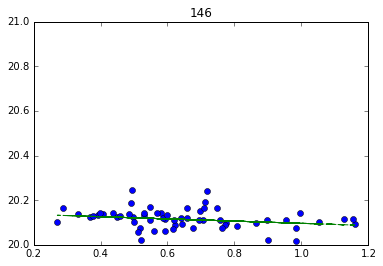

-0.0495003190737


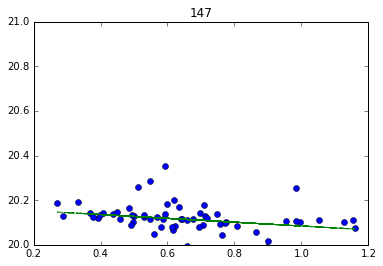

-0.0858329580153


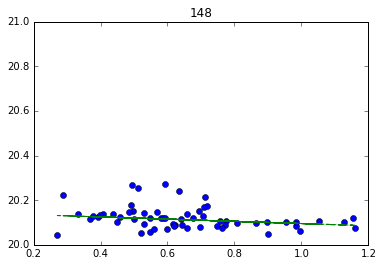

-0.0493356954138


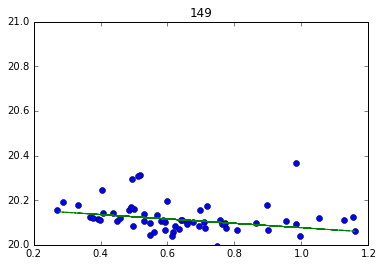

-0.0980273249741


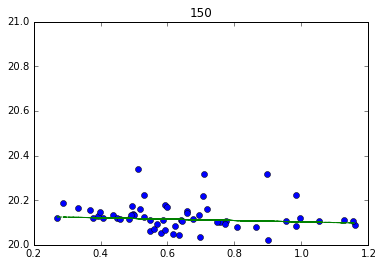

-0.0303976107086


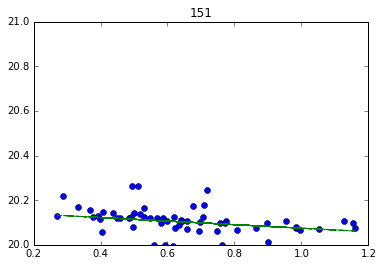

-0.0797115608266


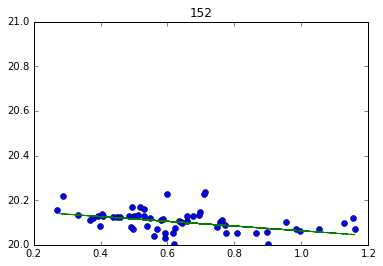

-0.106118380566


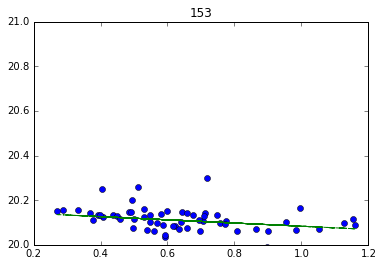

-0.0715509394678


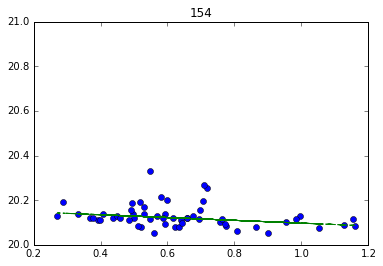

-0.0626732980397


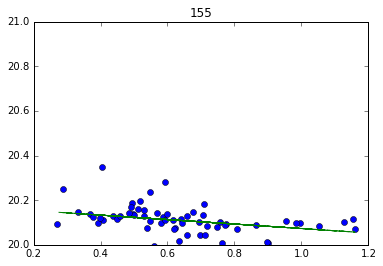

-0.100182252056


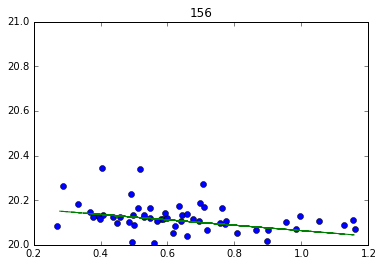

-0.120849326791


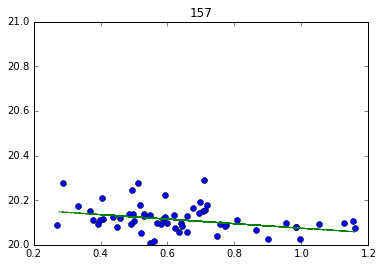

-0.101348390198


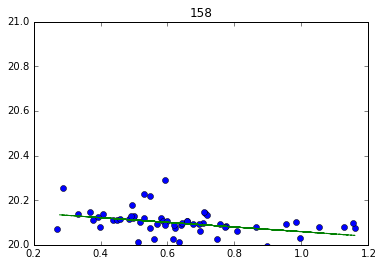

-0.104513467107


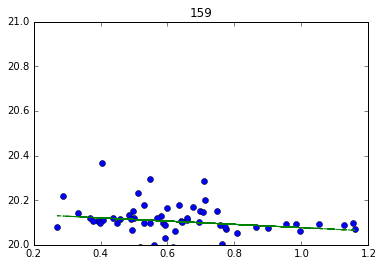

-0.073034943915


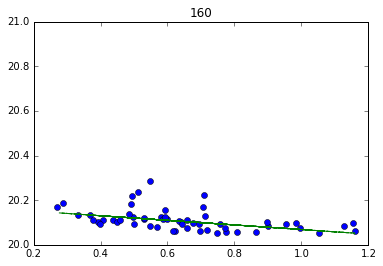

-0.102892180544


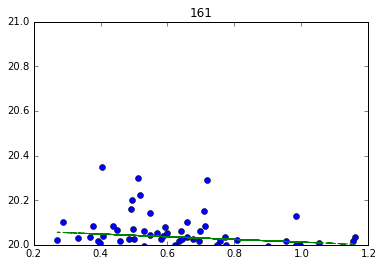

-0.060403244053


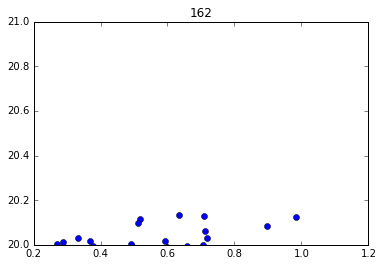

-0.0319924173326


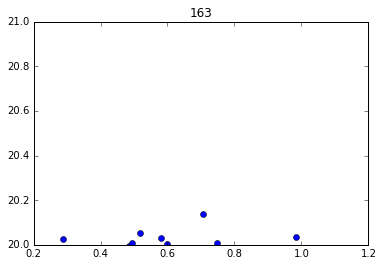

-0.0507828424916


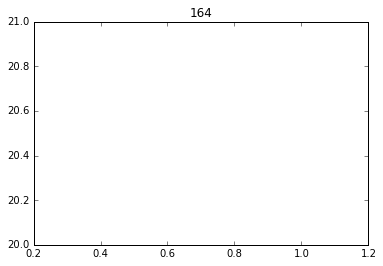

-0.0346852377931


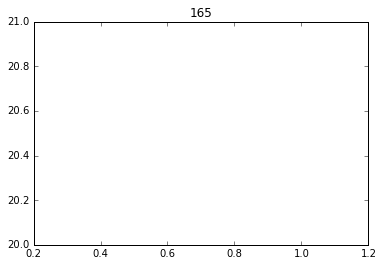

-0.0907050129256


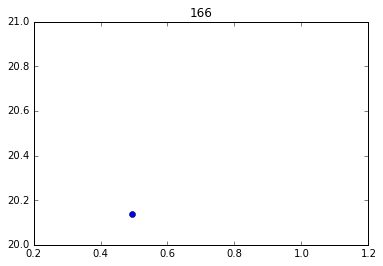

-0.0600508591038


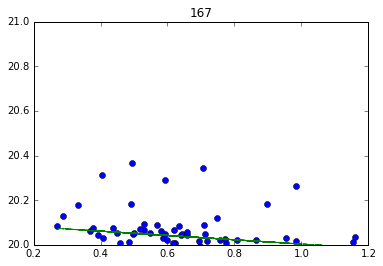

-0.0965218600954


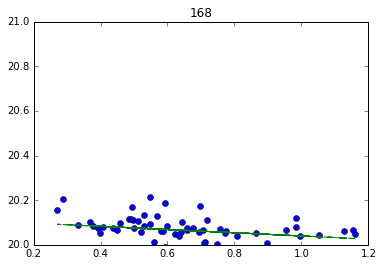

-0.0720530833579


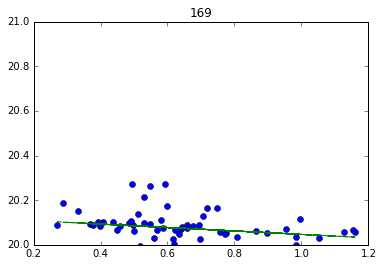

-0.0769343233395


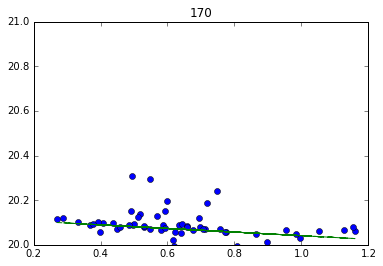

-0.0808919909019


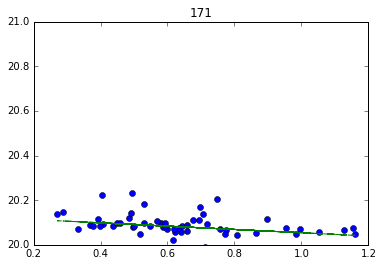

-0.0739556595221


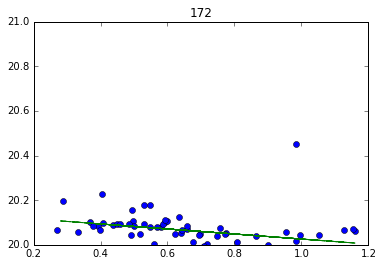

-0.11265196571


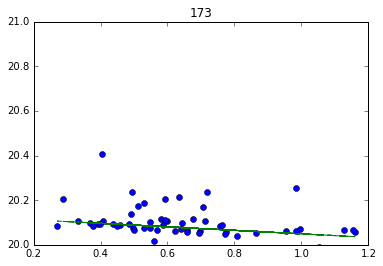

-0.0785150366511


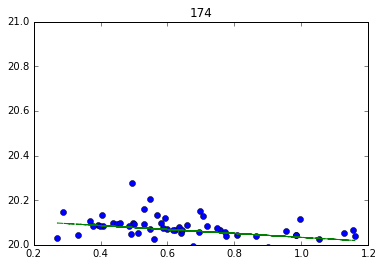

-0.0880473160955


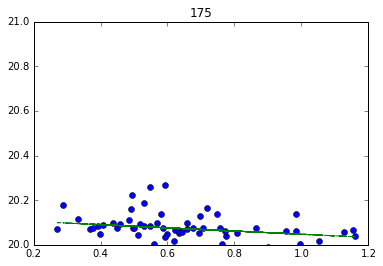

-0.0713311766616


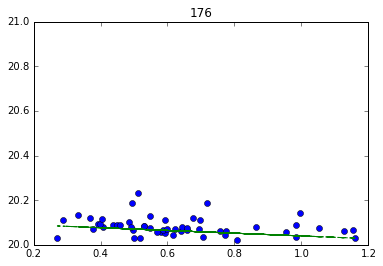

-0.061283440315


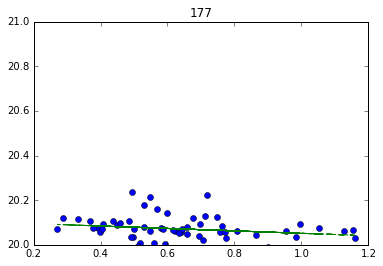

-0.0543158024498


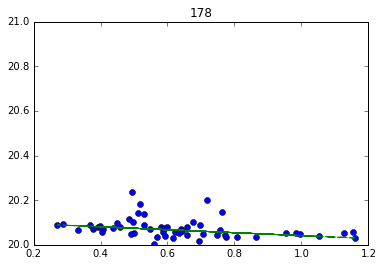

-0.0660011982965


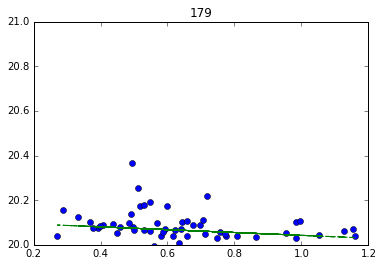

-0.063199951249


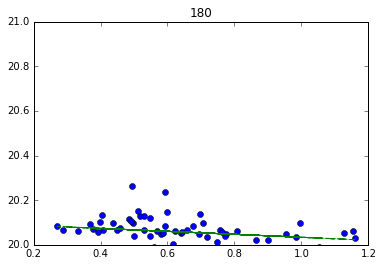

-0.0663574969416


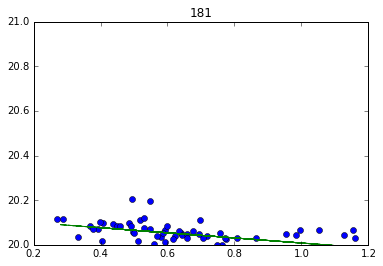

-0.114248087746


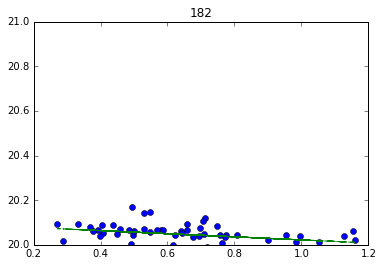

-0.069214648517


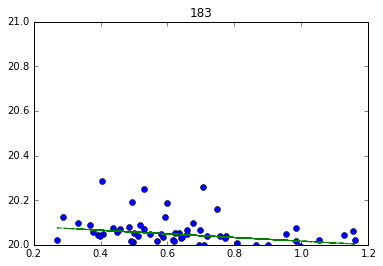

-0.0812526370925


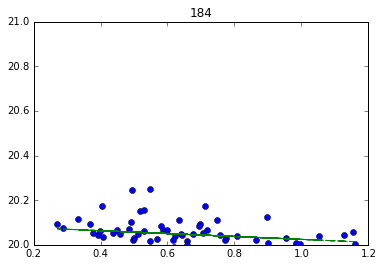

-0.064430890796


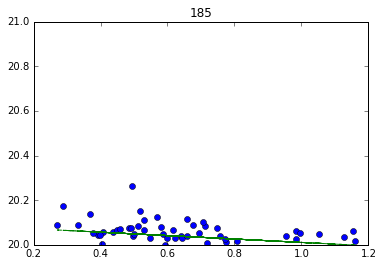

-0.0763868832228


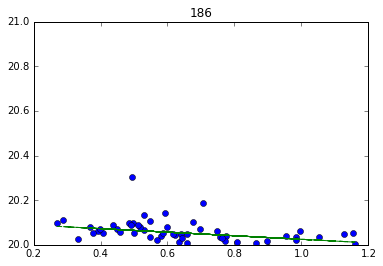

-0.0795722563368


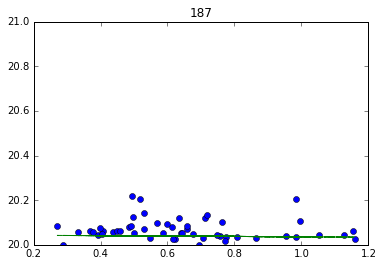

-0.00849064665385


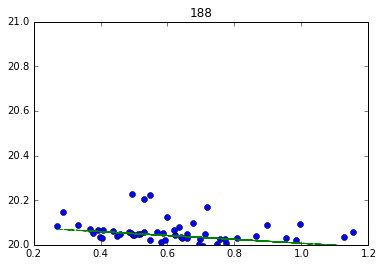

-0.0867648956753


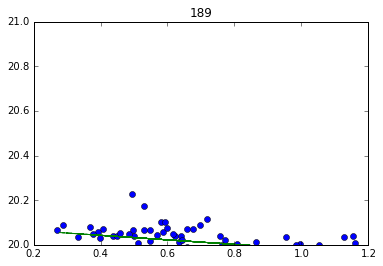

-0.101803691349


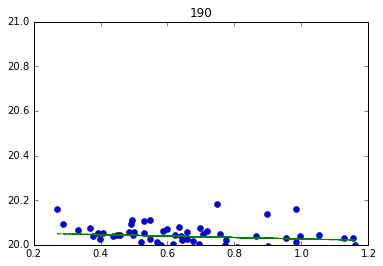

-0.0321147505161


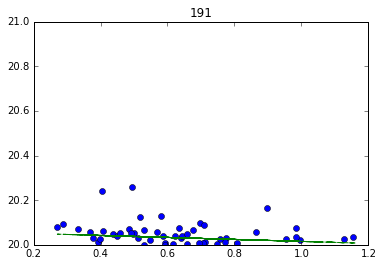

-0.0444127404997


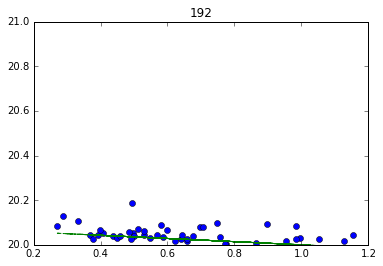

-0.0711406740733


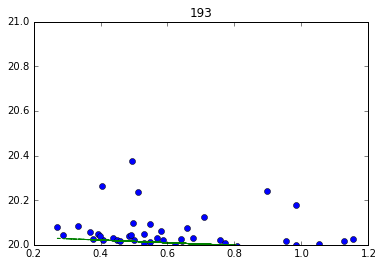

-0.0592804821908


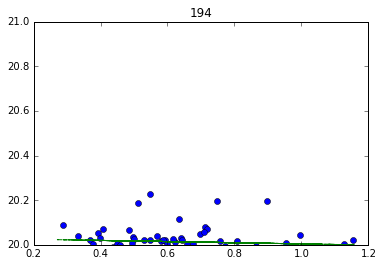

-0.0258887249829


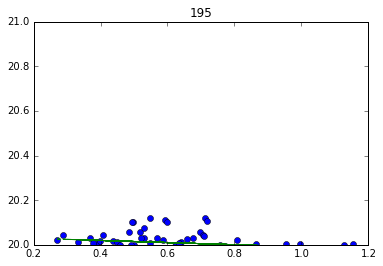

-0.0480609213039


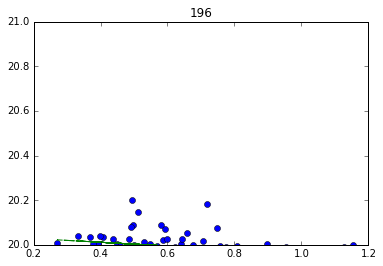

-0.0840649923866


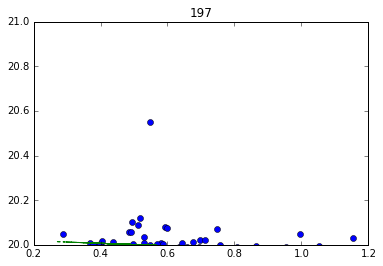

-0.0572512988774


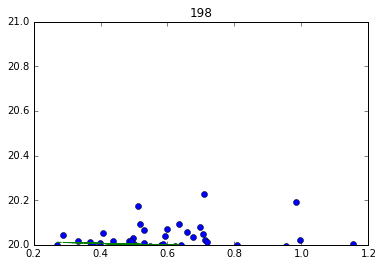

-0.0388477846335


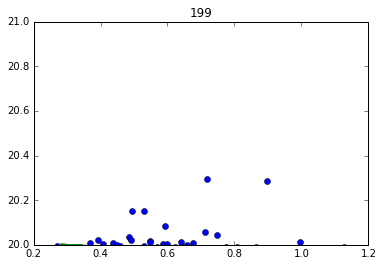

-0.0775372609084


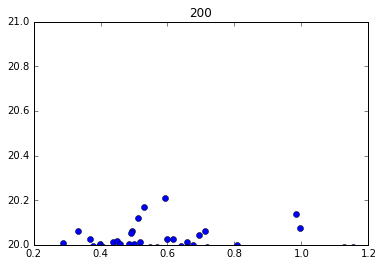

-0.025552053665


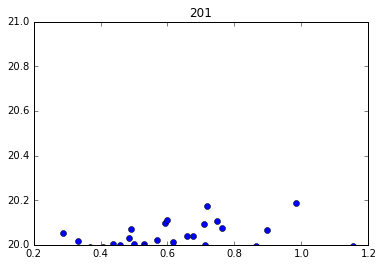

0.0107602629076


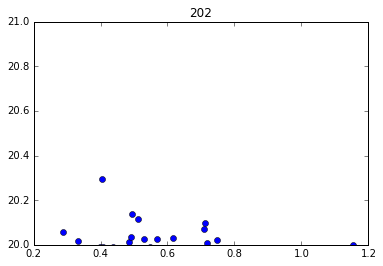

-0.0509615527778


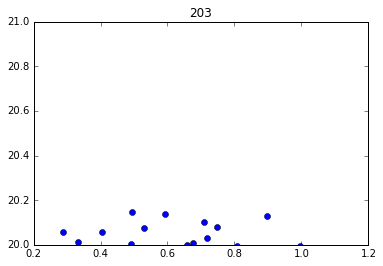

-0.0423362124383


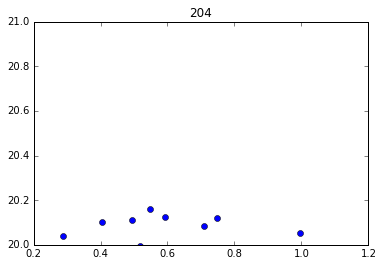

-0.10497025528


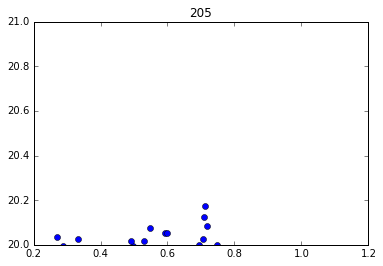

-0.0880180845929


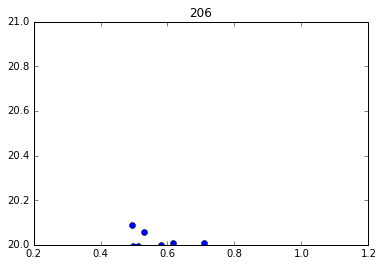

-0.0625419270403


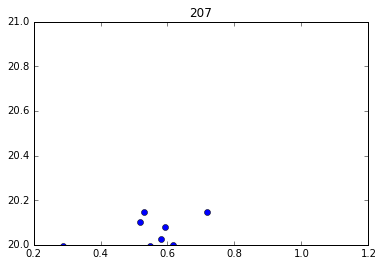

-0.0791647800619


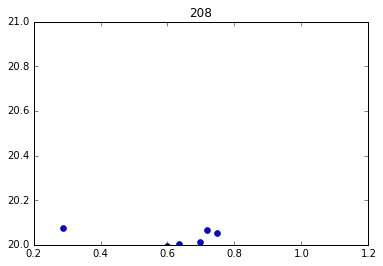

-0.0452920343092


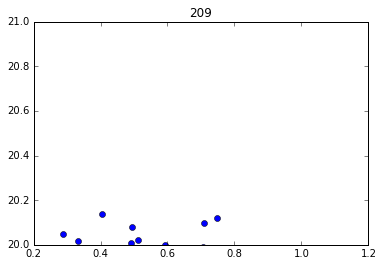

-0.104782227709


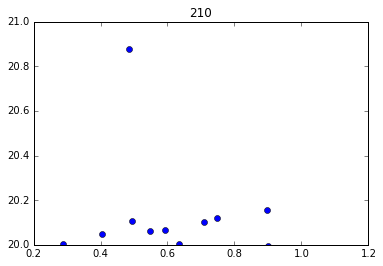

0.00503618928531


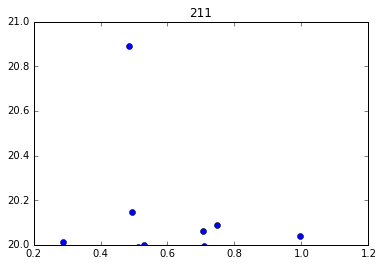

-0.0842125073588


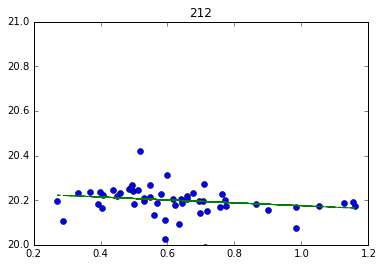

-0.0650325704038


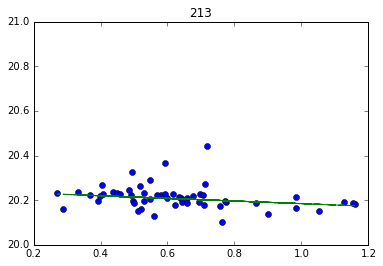

-0.0589147502979


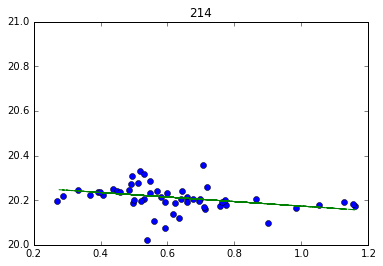

-0.101428989671


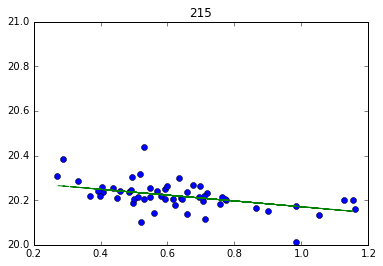

-0.130267441376


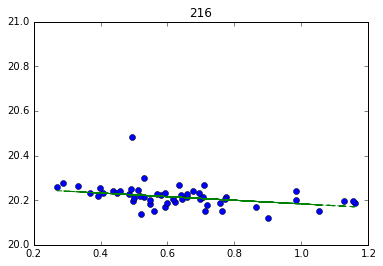

-0.0811322467276


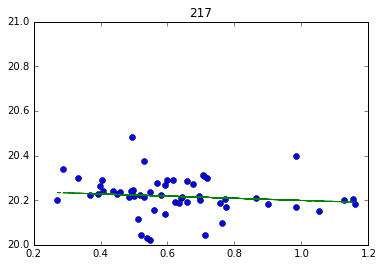

-0.0483714432827


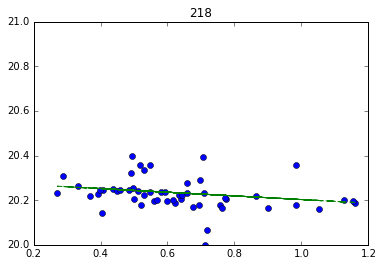

-0.0819139011109


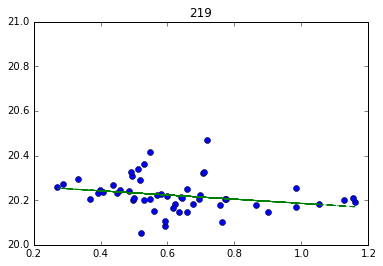

-0.0938957736871


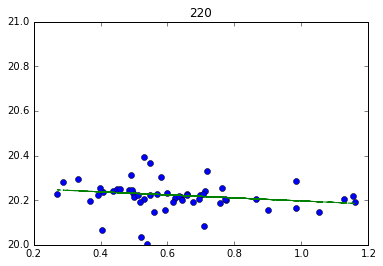

-0.0680922854536


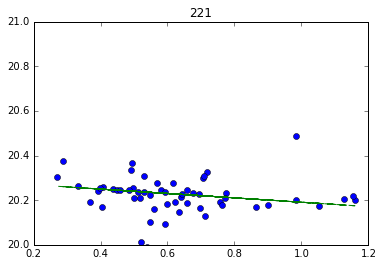

-0.0980732501787


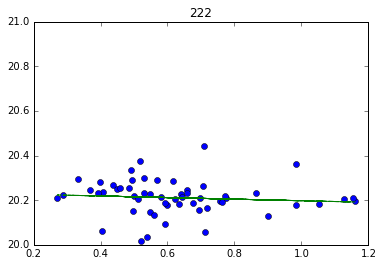

-0.0354364779306


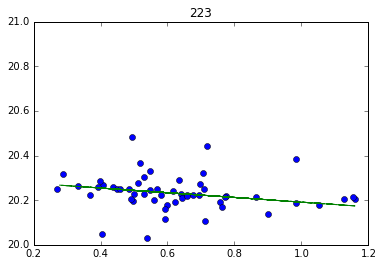

-0.105340968446


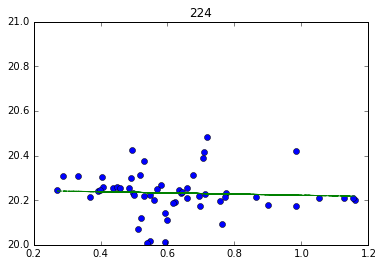

-0.0260591855147


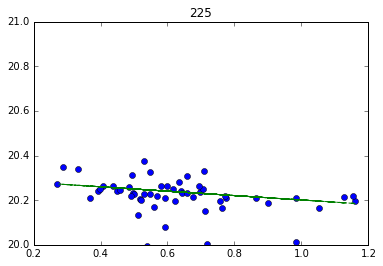

-0.0983340115034


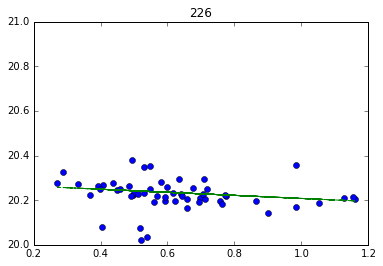

-0.0685843567499


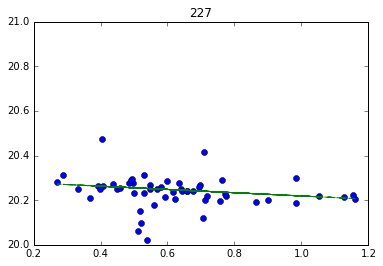

-0.0729453627766


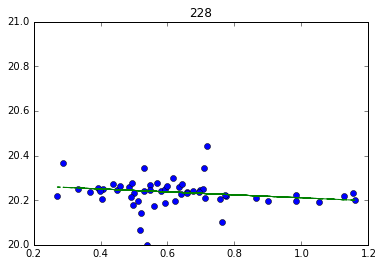

-0.066180258611


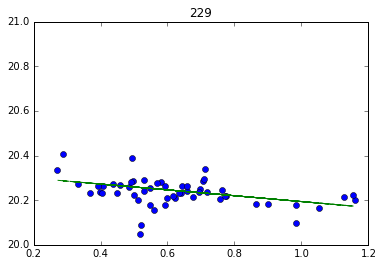

-0.130815335211


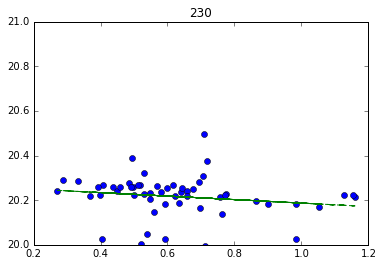

-0.0782252988951


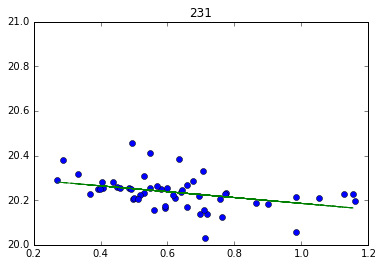

-0.131393997414


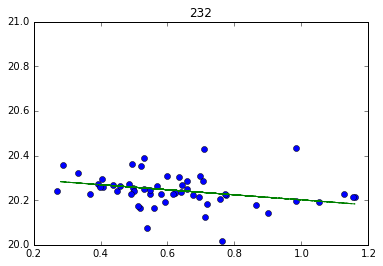

-0.113411449595


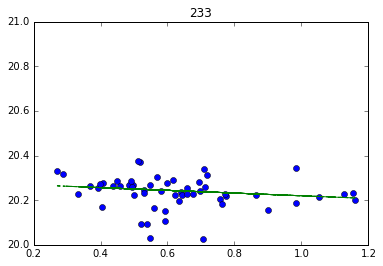

-0.0608943683544


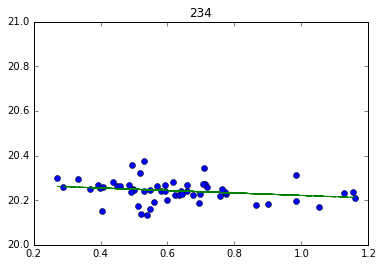

-0.0555569063804


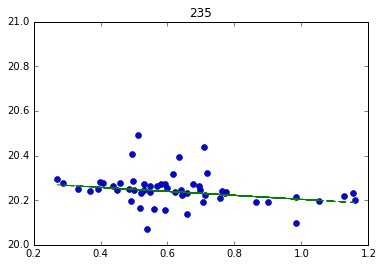

-0.089057779481


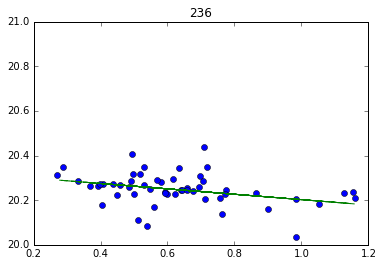

-0.120656187831


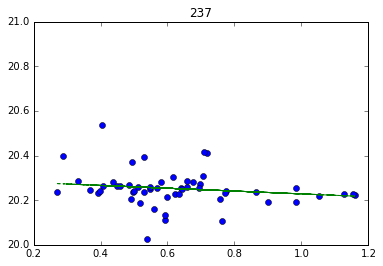

-0.063371042278


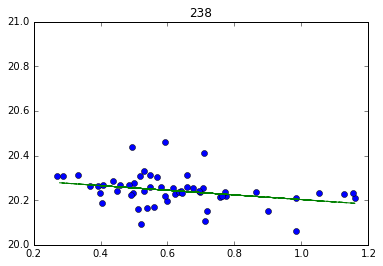

-0.104245834226


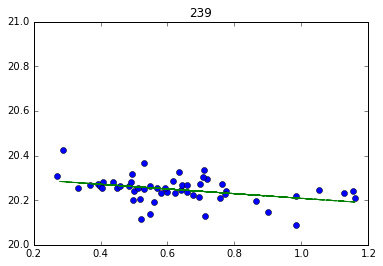

-0.104924048418


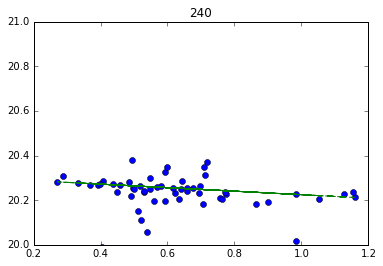

-0.0788565632002


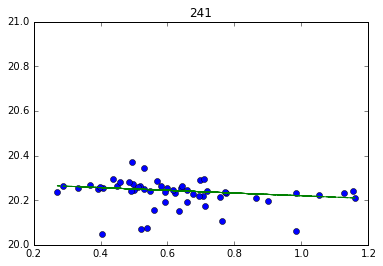

-0.0610395967919


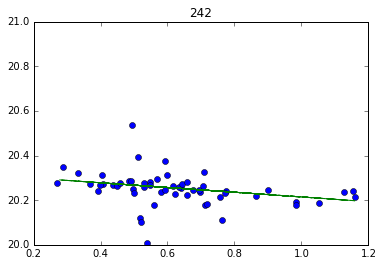

-0.105736484815


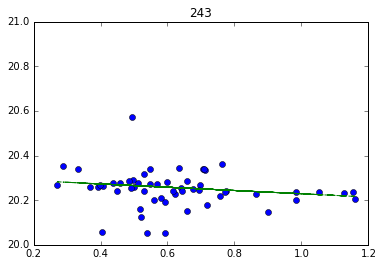

-0.0735204926235


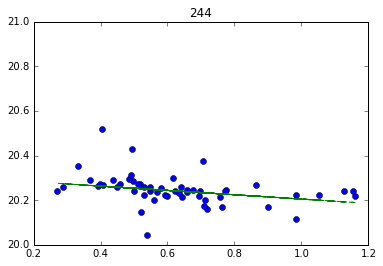

-0.0968644907148


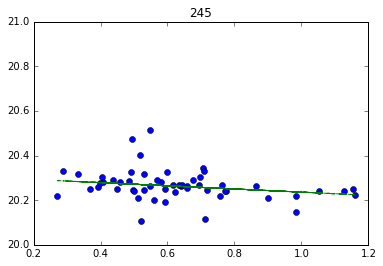

-0.0708085445975


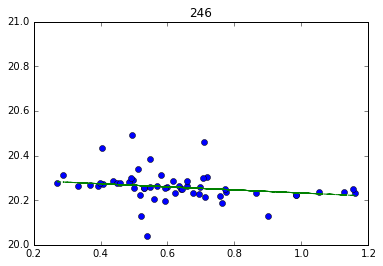

-0.069016729349


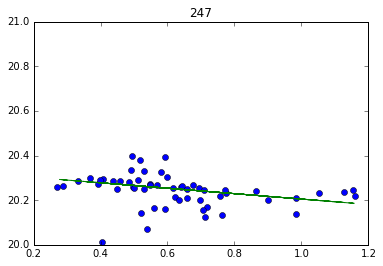

-0.121480259051


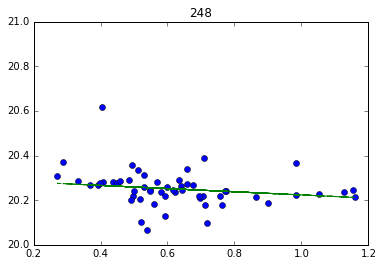

-0.0712452989968


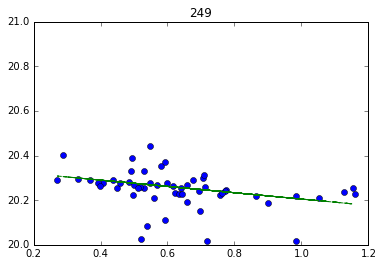

-0.141485027398


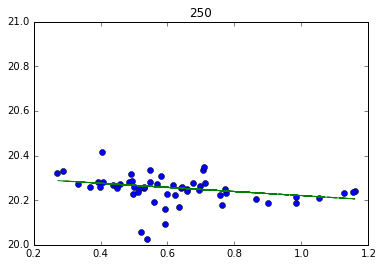

-0.0922207872734


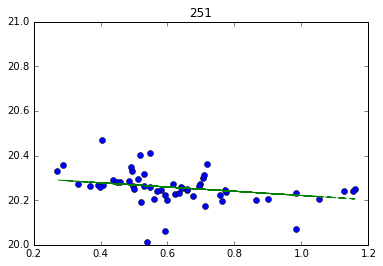

-0.0950333585931


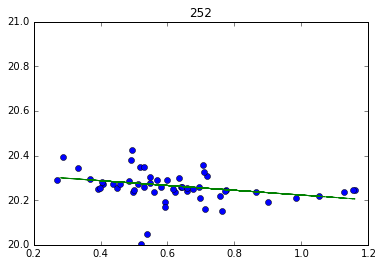

-0.107288473153


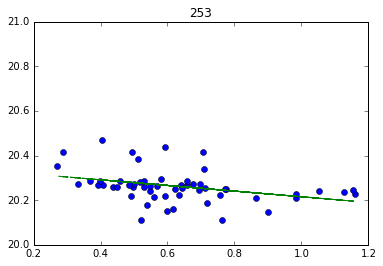

-0.126745159276


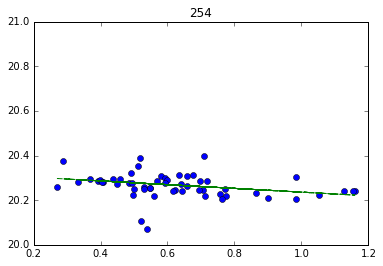

-0.0836671570723


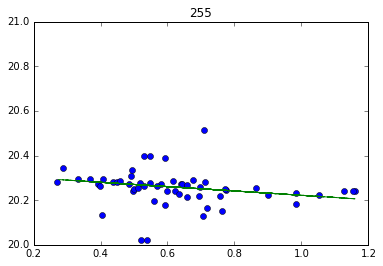

-0.0971879418338


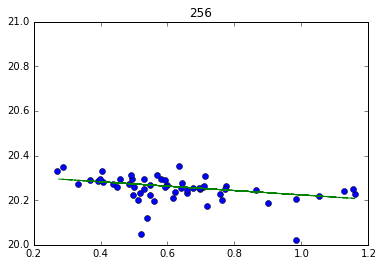

-0.0980934227641


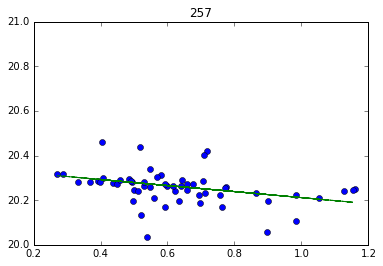

-0.134981175902


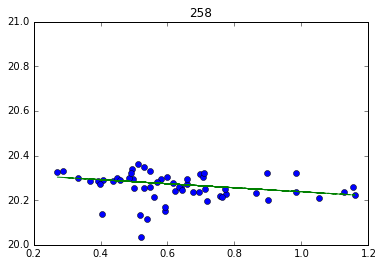

-0.0901884779242


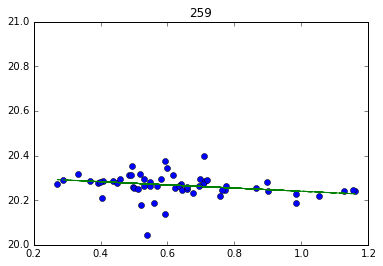

-0.0713902388322


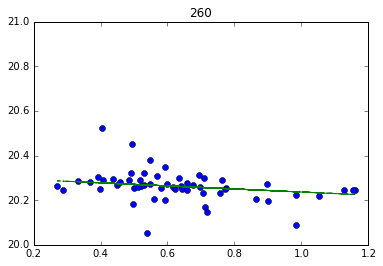

-0.0685656776598


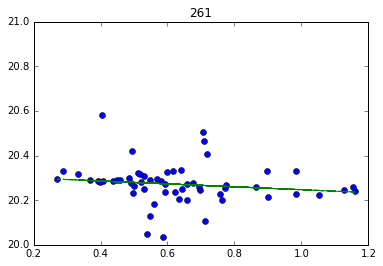

-0.0653190739567


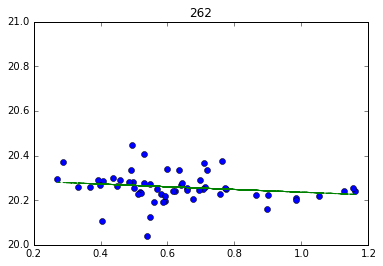

-0.0609099946194


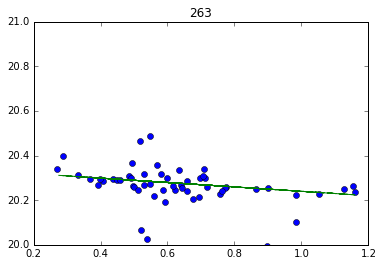

-0.0986554539033


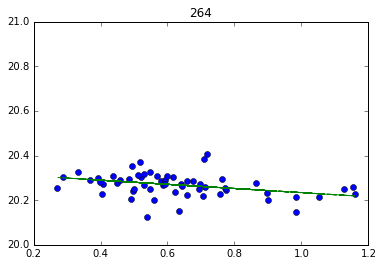

-0.0930241993935


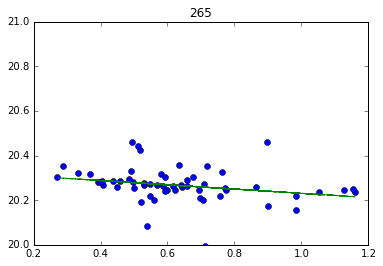

-0.0954135987828


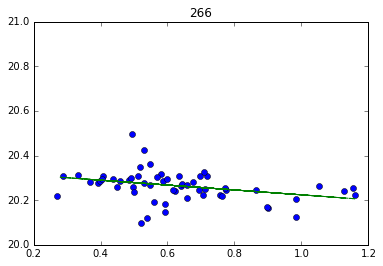

-0.109481150229


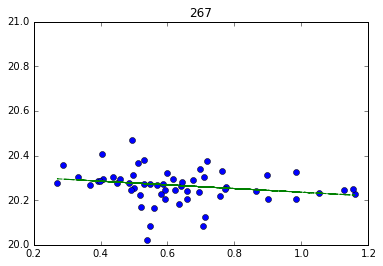

-0.0824267389294


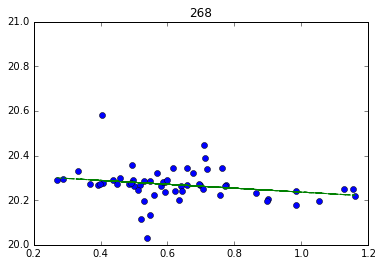

-0.0875617330321


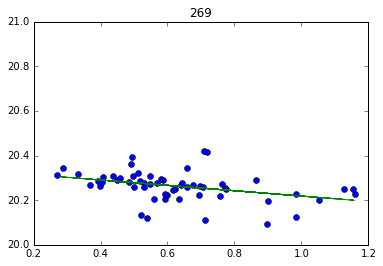

-0.120075698154


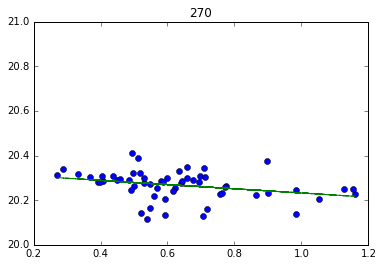

-0.094129647366


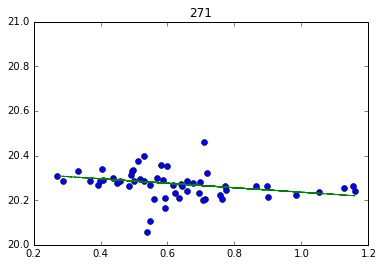

-0.100034965694


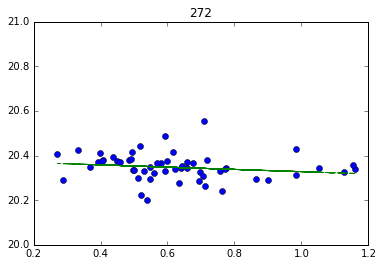

-0.050639676029


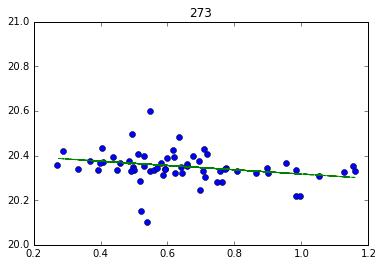

-0.0959650804035


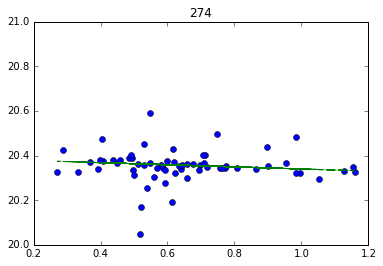

-0.0474222743407


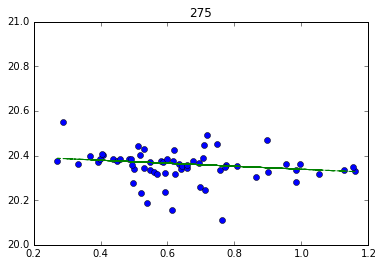

-0.0670913275346


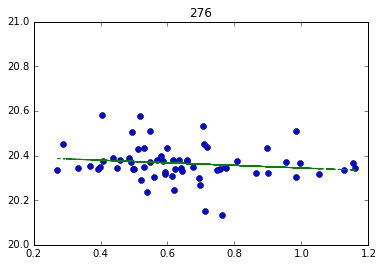

-0.0580483171549


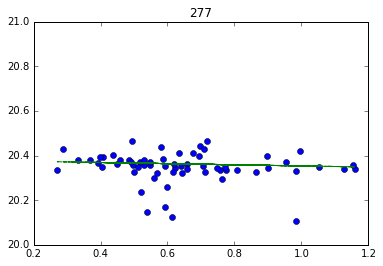

-0.0257643824973


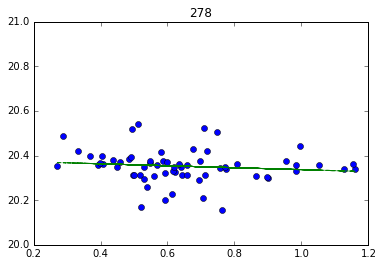

-0.0438067934324


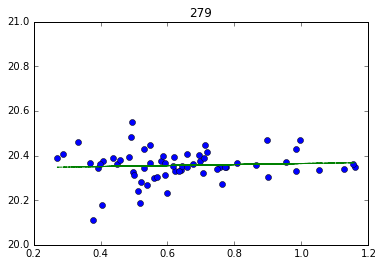

0.0224996702594


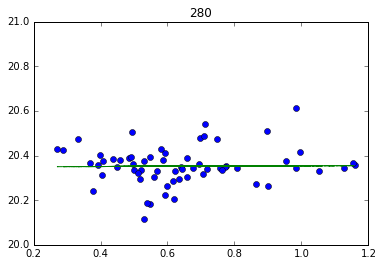

0.00523485410391


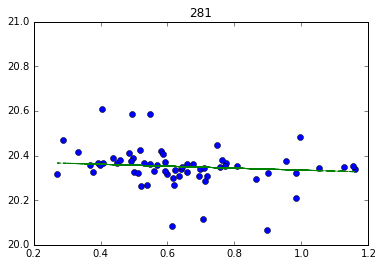

-0.0436180699913


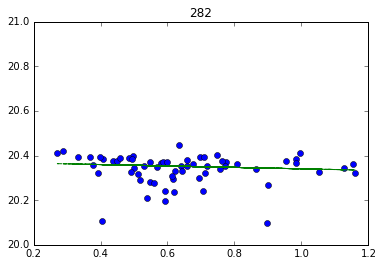

-0.0318364357675


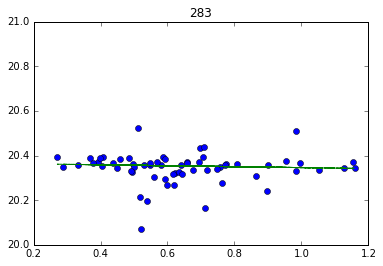

-0.0209564916966


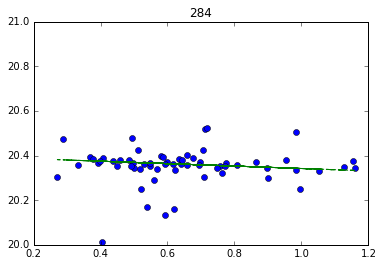

-0.0544164222026


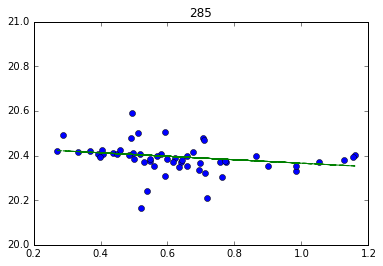

-0.0777919335327


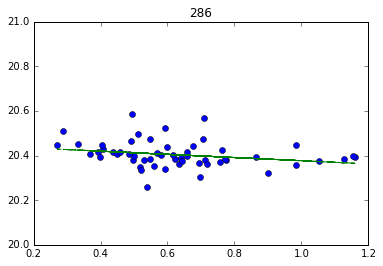

-0.0712109303071


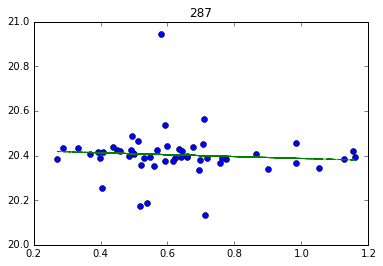

-0.0423887959651


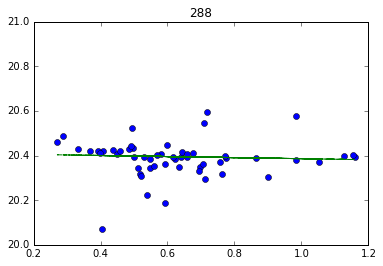

-0.0238113805674


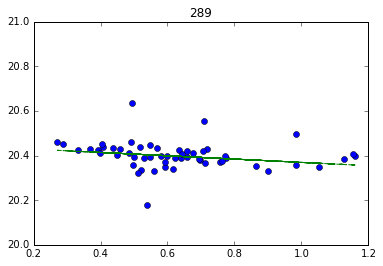

-0.0742377351157


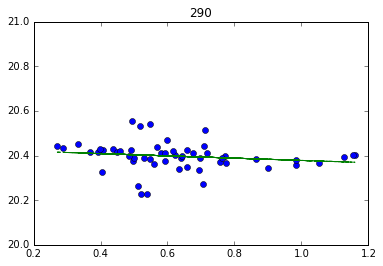

-0.0507949050228


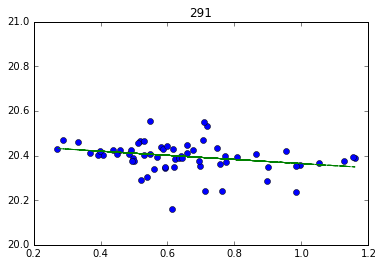

-0.0927154194488


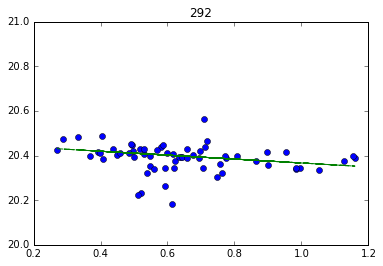

-0.0876914215177


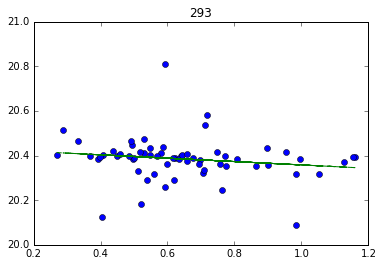

-0.0754245762283


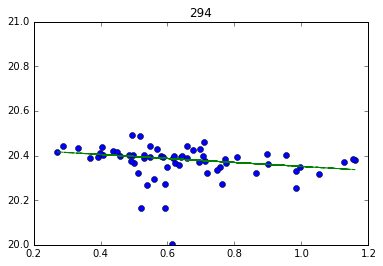

-0.0891426963848


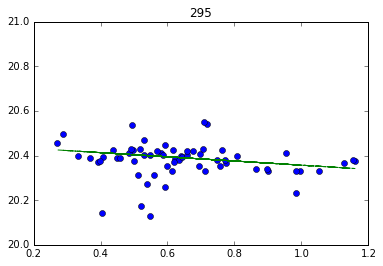

-0.0936461169046


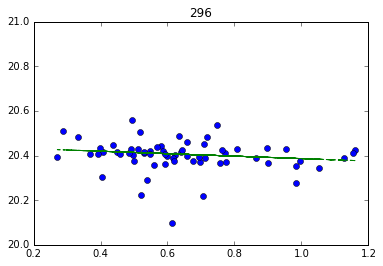

-0.0551440704407


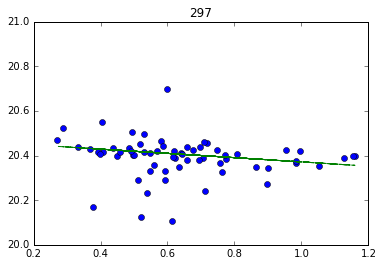

-0.0954991271698


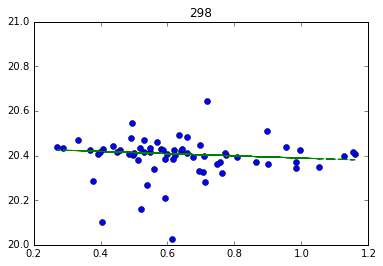

-0.0498145466971


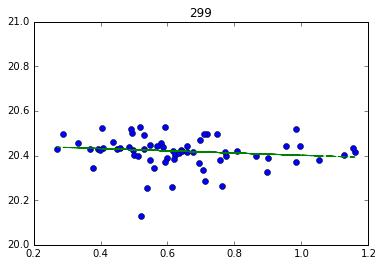

-0.0498724863436


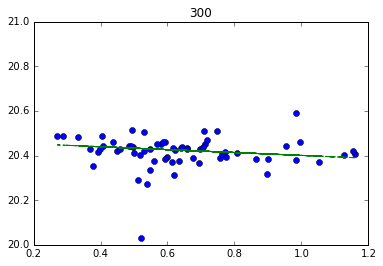

-0.0643930592957


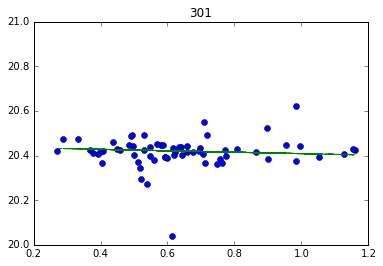

-0.0321322796121


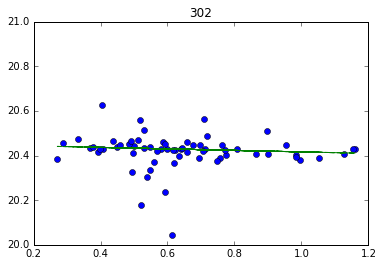

-0.0336530160324


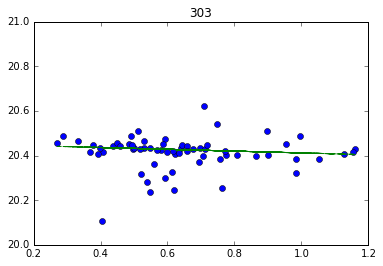

-0.0404048645836


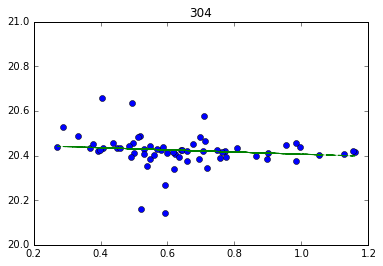

-0.0483162087294


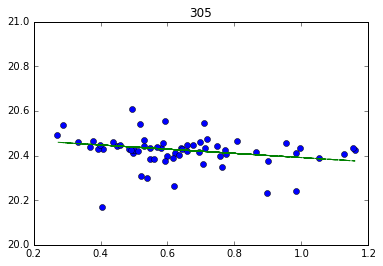

-0.0941808298246


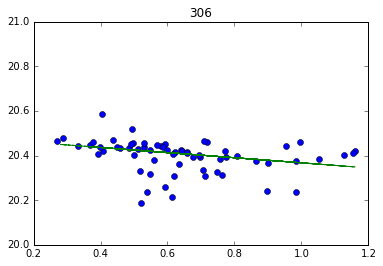

-0.114504929781


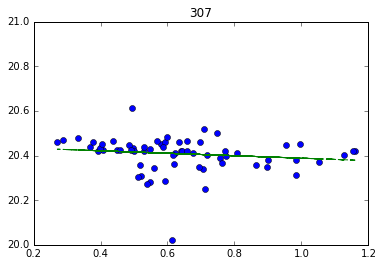

-0.0550501826287


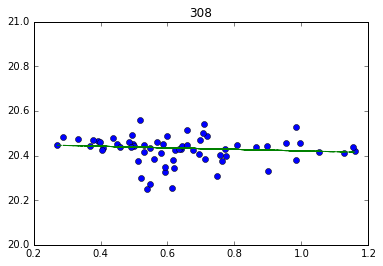

-0.0346568102433


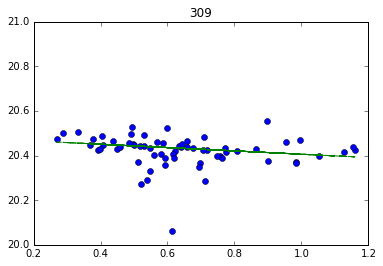

-0.0744275103378


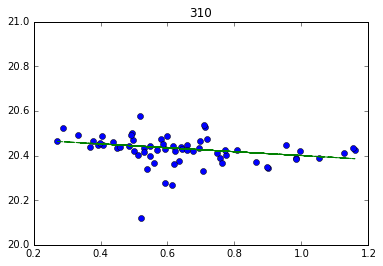

-0.0870852504122


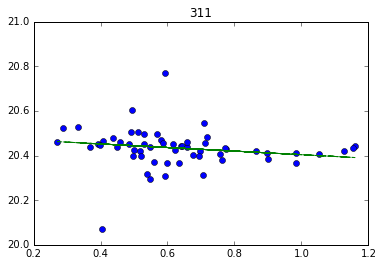

-0.0802948619882


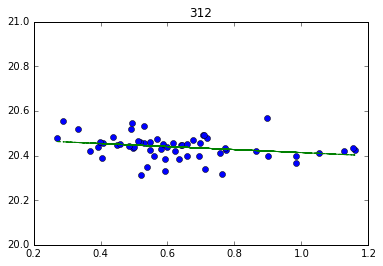

-0.0678324619592


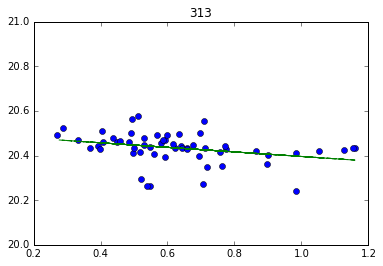

-0.102061384528


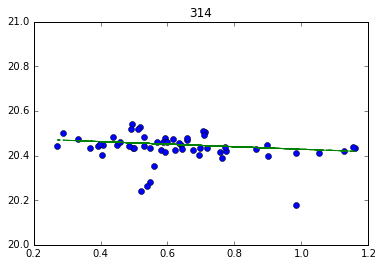

-0.0571252381931


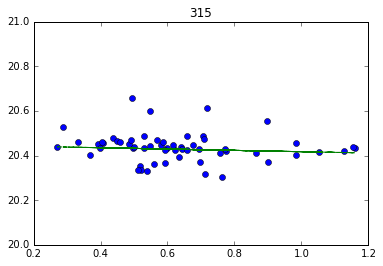

-0.0296864458836


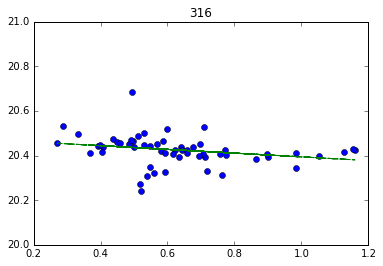

-0.0836318271838


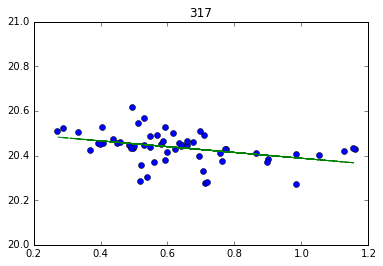

-0.130192228372


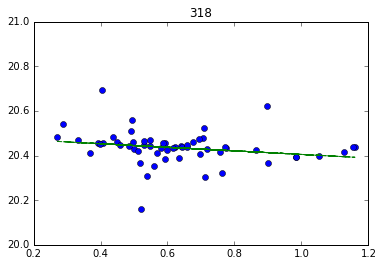

-0.0797938010713


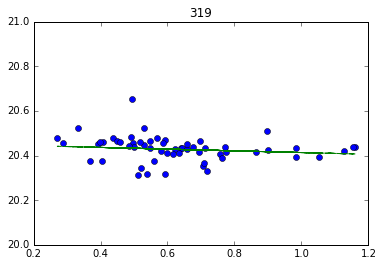

-0.0383803271501


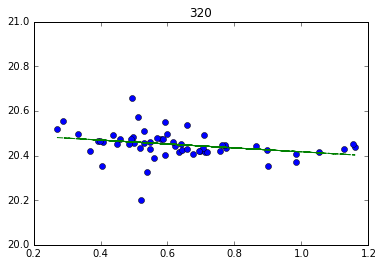

-0.0875951709164


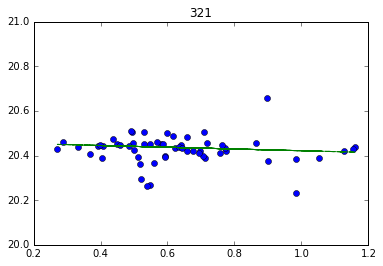

-0.0389961007224


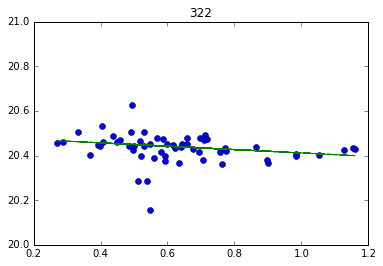

-0.0753401766941


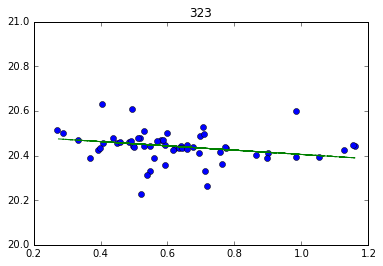

-0.09579073338


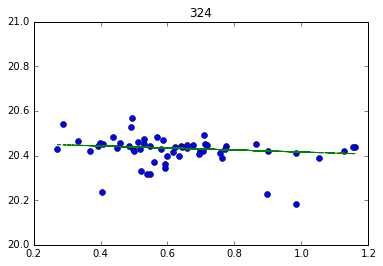

-0.045278457015


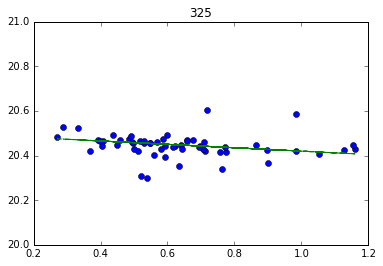

-0.0759221645748


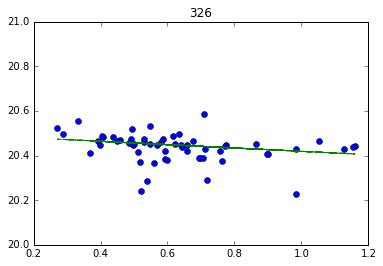

-0.0748528504751


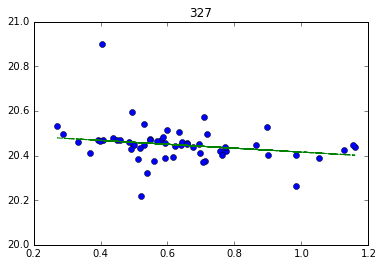

-0.0872166845422


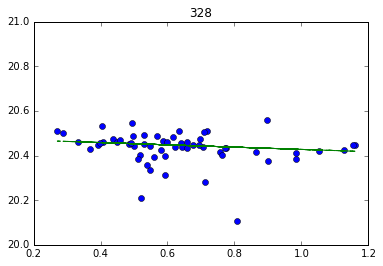

-0.0510943358223


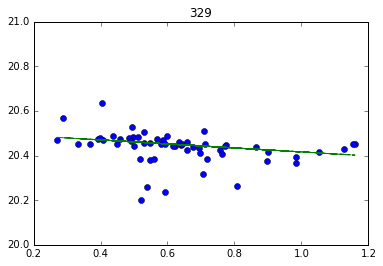

-0.0896152559495


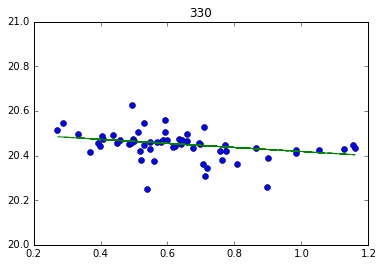

-0.0910471108191


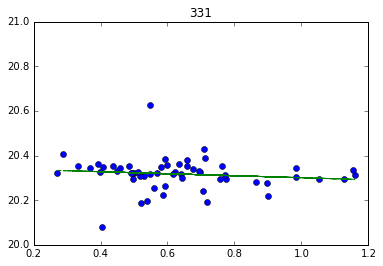

-0.0447600987329


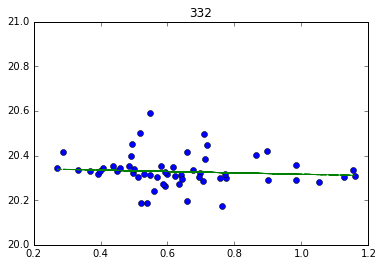

-0.0308765185225


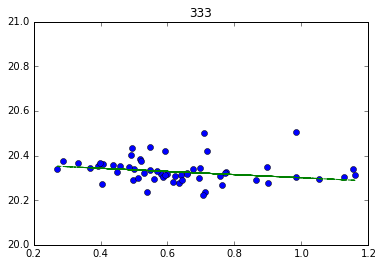

-0.0708727186358


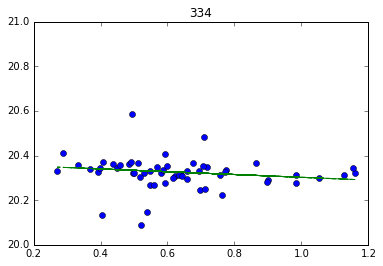

-0.0624836310078


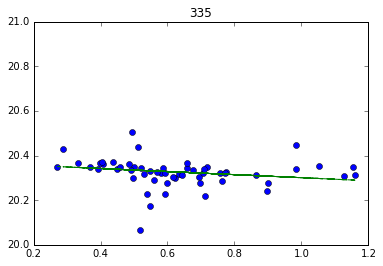

-0.0685420828154


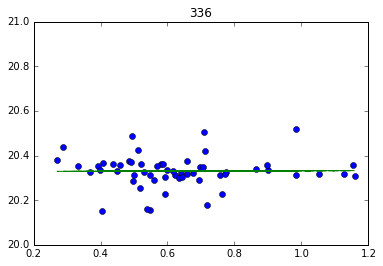

0.00387943839405


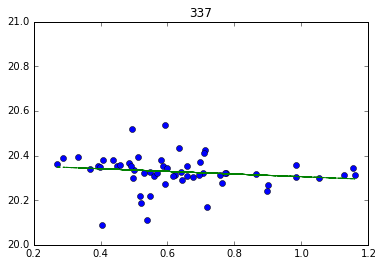

-0.0595023949488


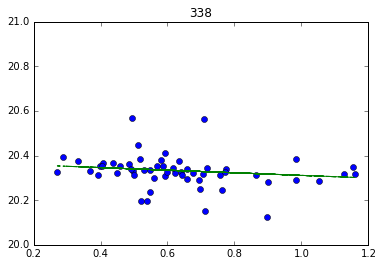

-0.0580880019789


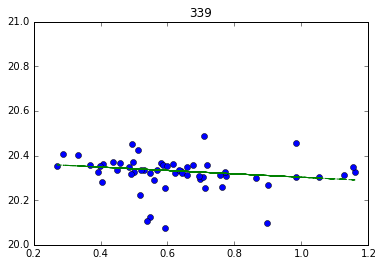

-0.0756757997545


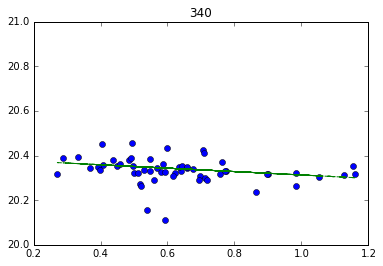

-0.076068754987


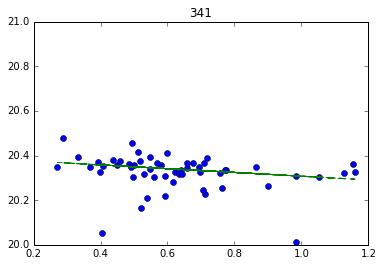

-0.0842887347856


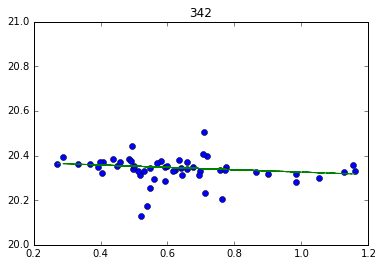

-0.0529484313056


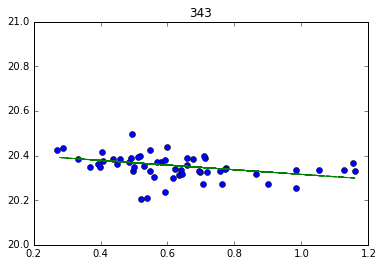

-0.104534779525


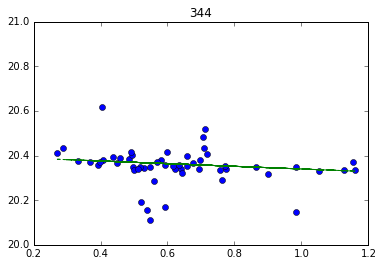

-0.0596878251935


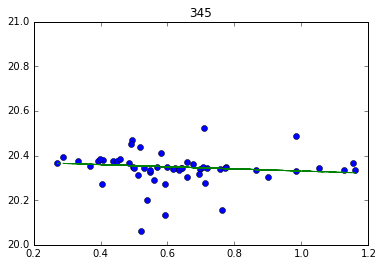

-0.0479725078013


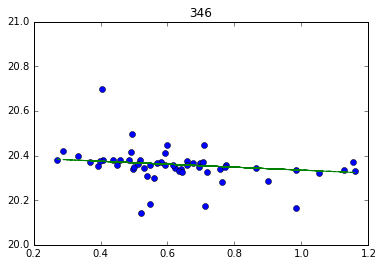

-0.0664152545186


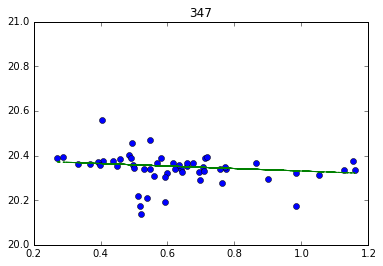

-0.0558832650284


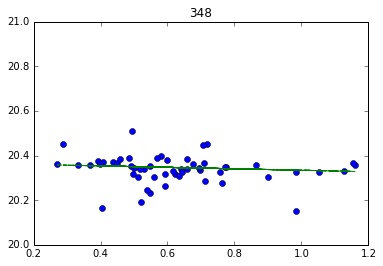

-0.0323628103179


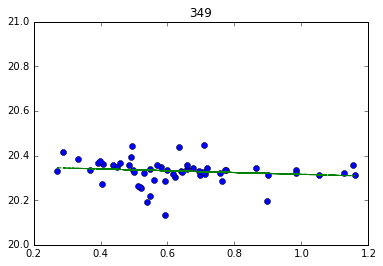

-0.040090381432


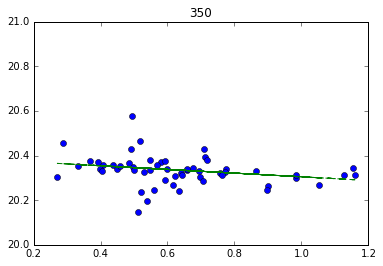

-0.0823895688059


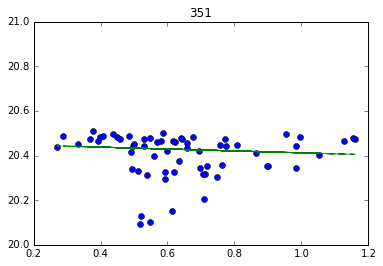

-0.0425279240787


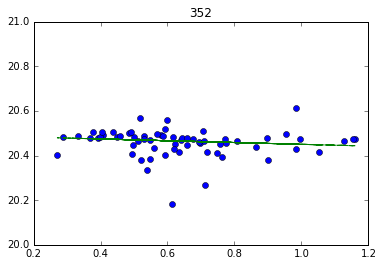

-0.040067682753


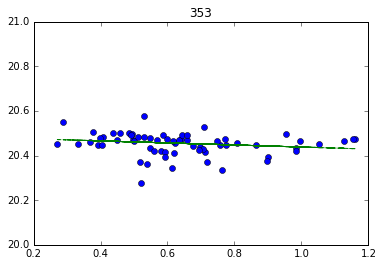

-0.0458221140938


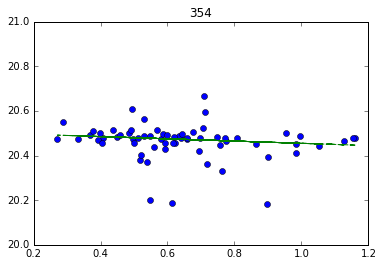

-0.050224470303


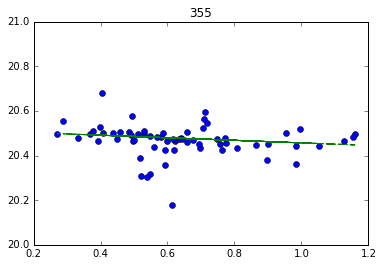

-0.0572522371792


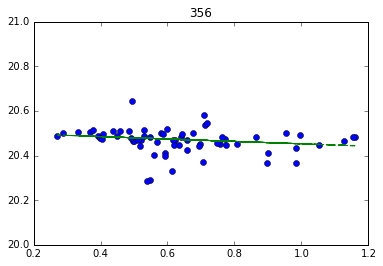

-0.0539869933979


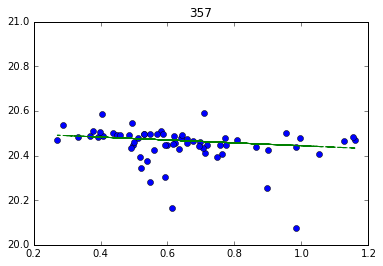

-0.064640459521


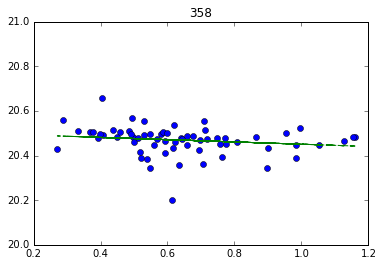

-0.0508813059235


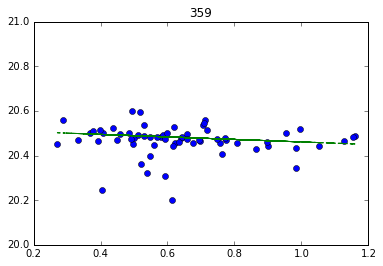

-0.056408262168


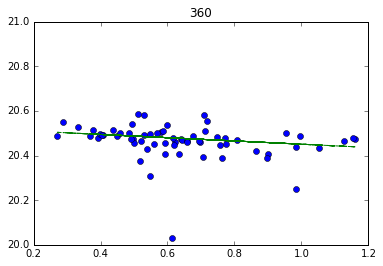

-0.0729847676985


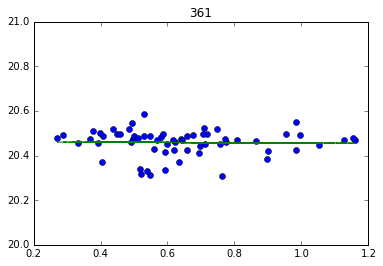

-0.00558097365076


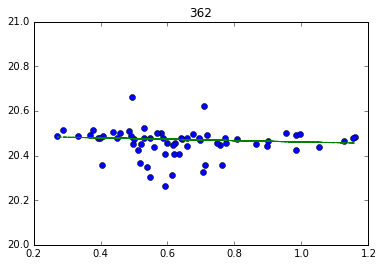

-0.0302890144898


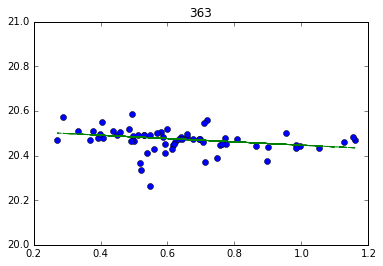

-0.0742005326595


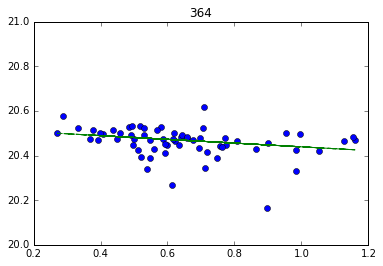

-0.0836095469342


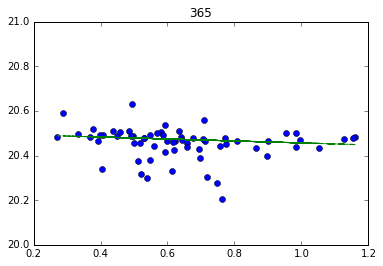

-0.0441921742394


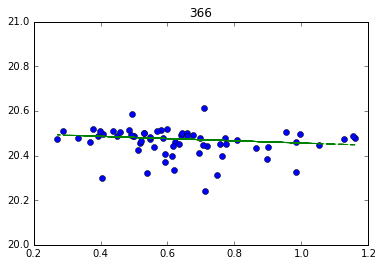

-0.0500943611741


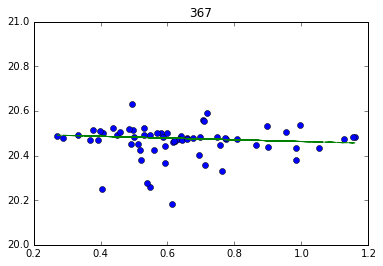

-0.0388550375163


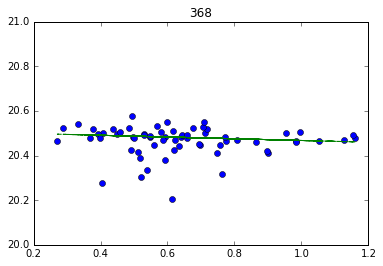

-0.0387491170252


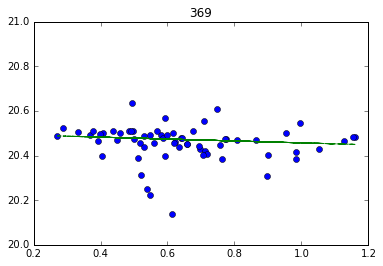

-0.0427464263621


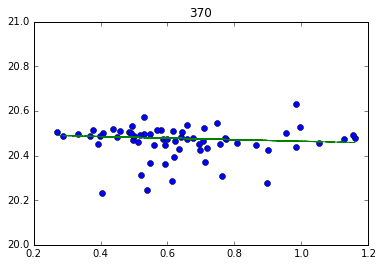

-0.0353160034382


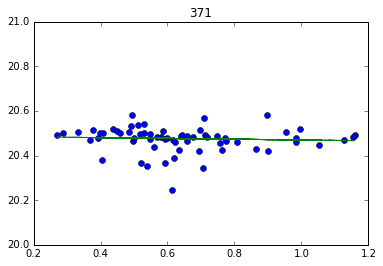

-0.0175927202745


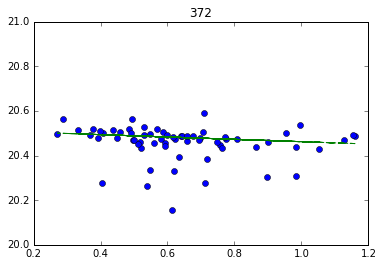

-0.0526556684409


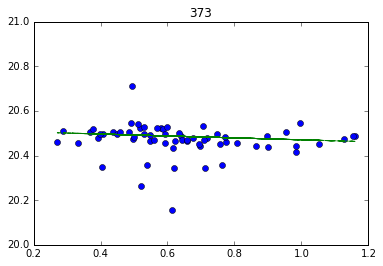

-0.0432460494636


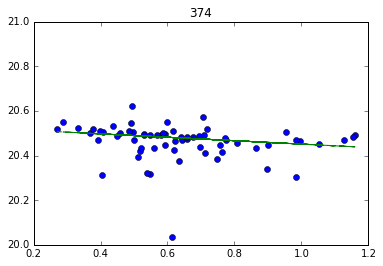

-0.0763962443389


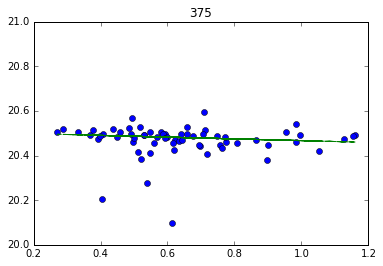

-0.0392632407182


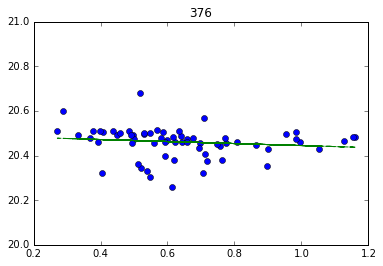

-0.0451467021111


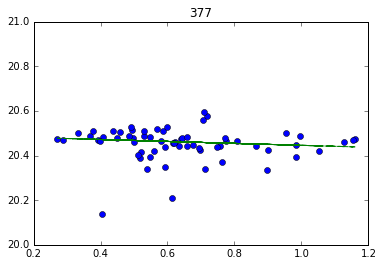

-0.043510892974


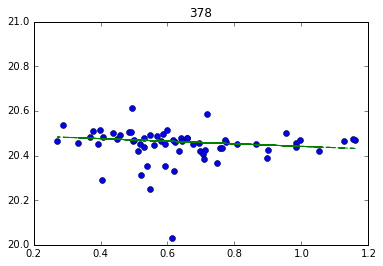

-0.0575876942335


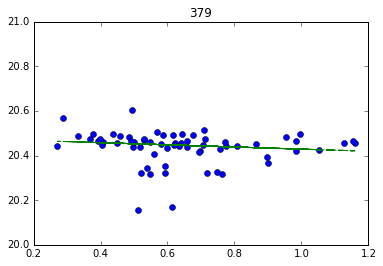

-0.0481249537474


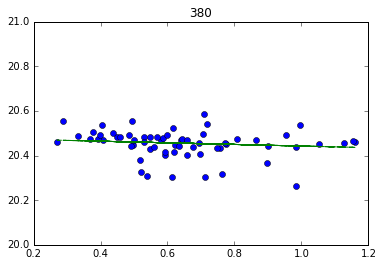

-0.0361527242277


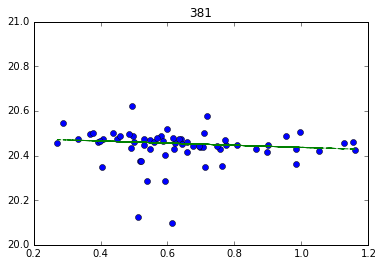

-0.0476753102252


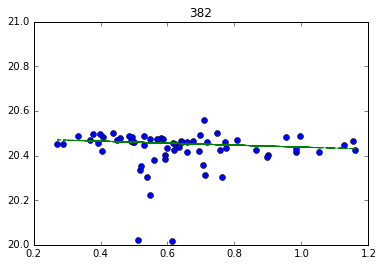

-0.0442157098775


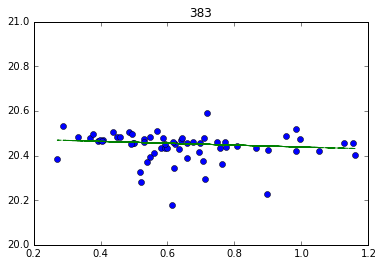

-0.0421773844044


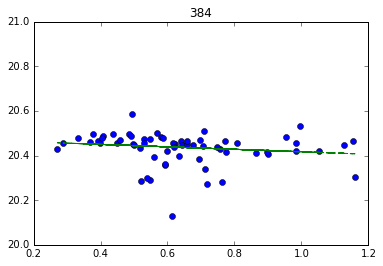

-0.0552892370177


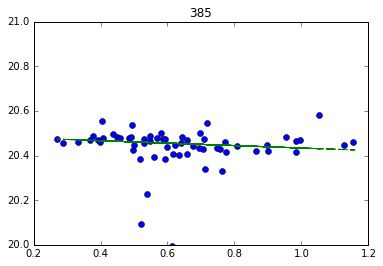

-0.0547040557637


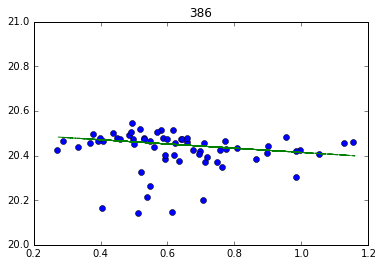

-0.0946649208092


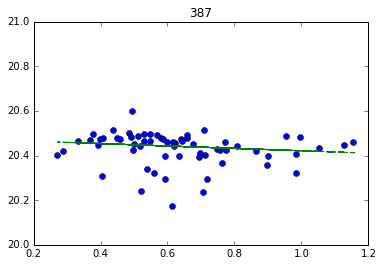

-0.0536814256616


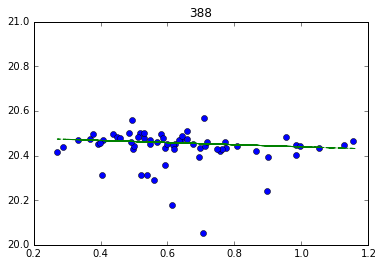

-0.0475903479059


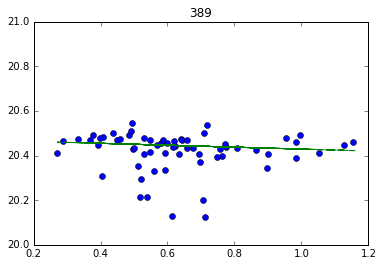

-0.0431292287729


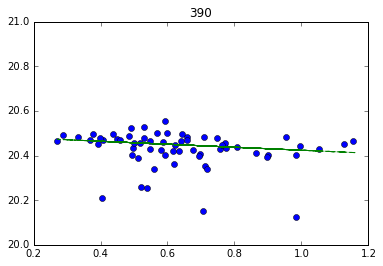

-0.0668921894109


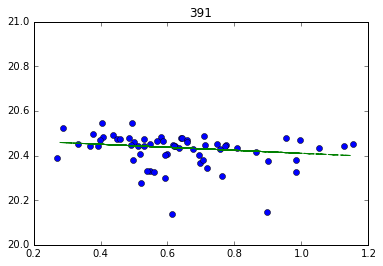

-0.0673097944194


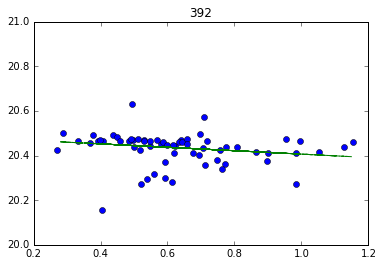

-0.0764568644503


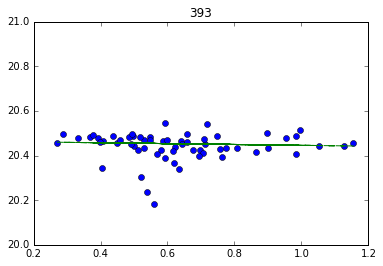

-0.018975608365


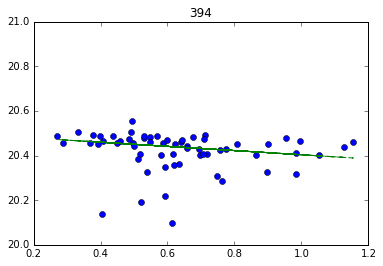

-0.0937886400645


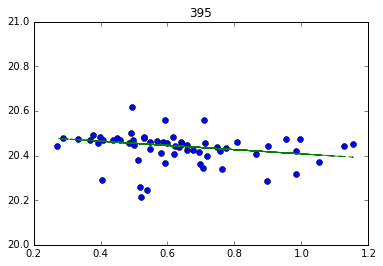

-0.0950320383794


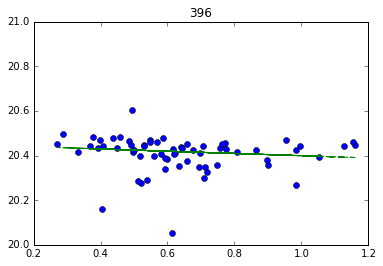

-0.0502877051435


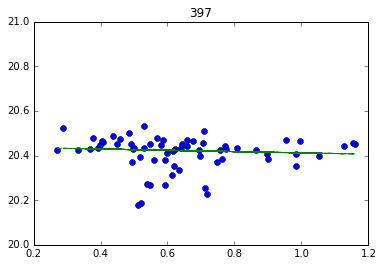

-0.0286475228359


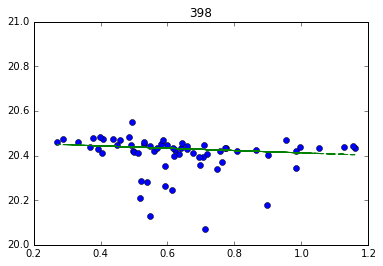

-0.0521444908981


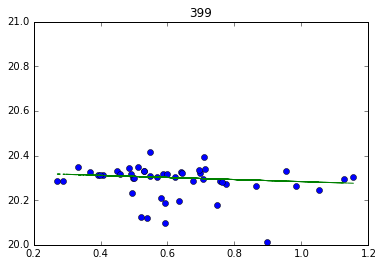

-0.0465034586301


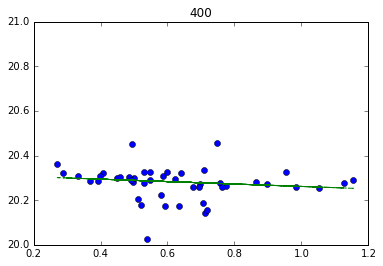

-0.054291835779


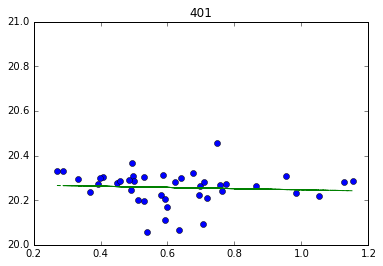

-0.0265910017784


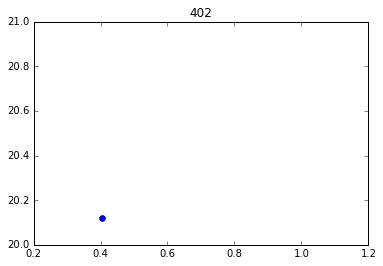

-0.0968532476464


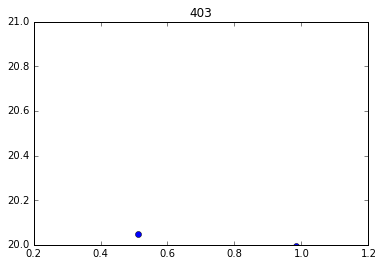

-0.0281738485081


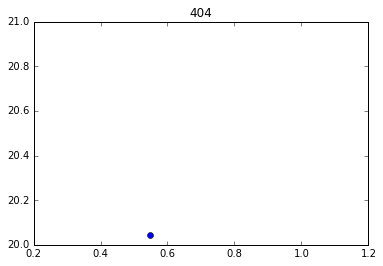

-0.0664904466995


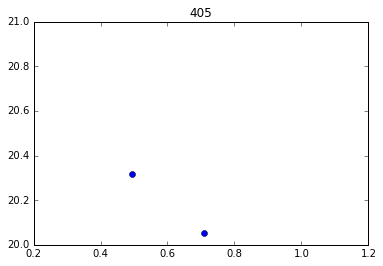

-0.0716085451137


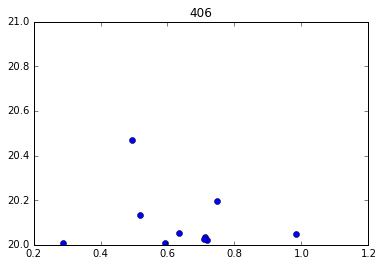

0.0203410542512


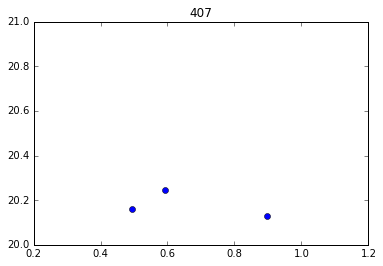

-0.0307633087848


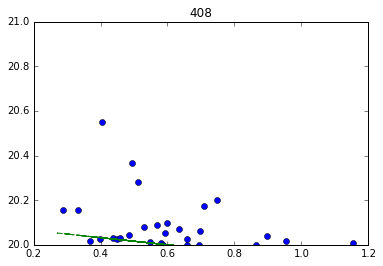

-0.160460206794


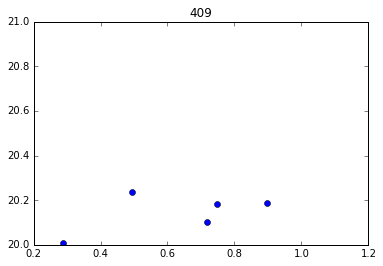

-0.0563963409339


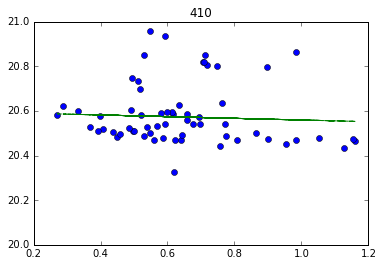

-0.0376380884581


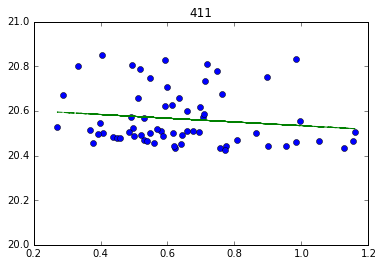

-0.0836402008105


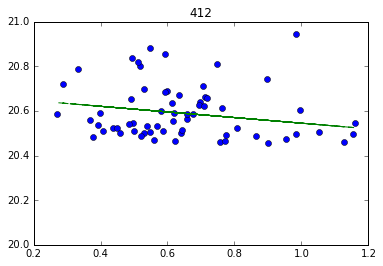

-0.125962974767


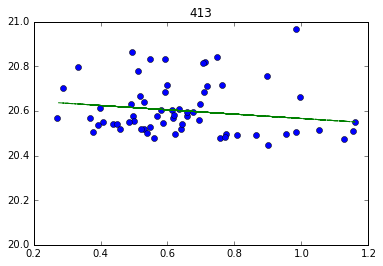

-0.0971336432762


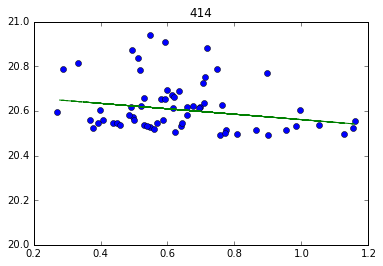

-0.121362879955


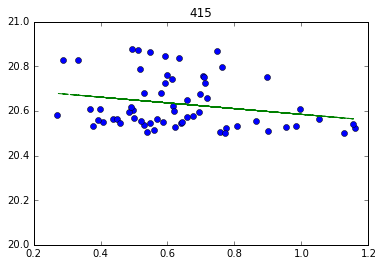

-0.128631704875


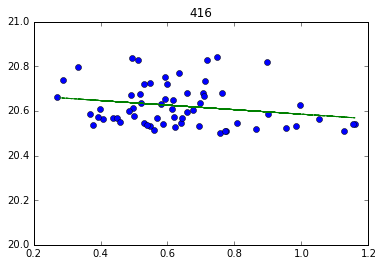

-0.101683048969


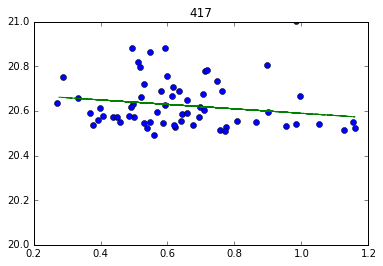

-0.0996482891751


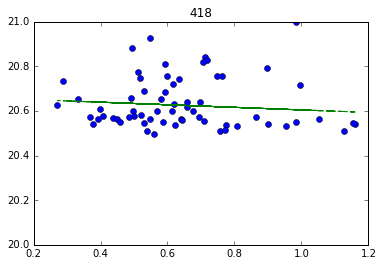

-0.0575818751247


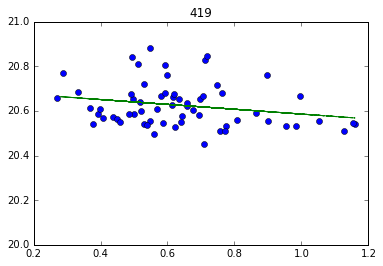

-0.108435125831


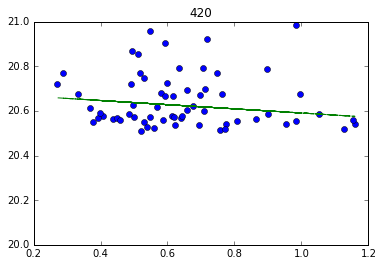

-0.0933235130704


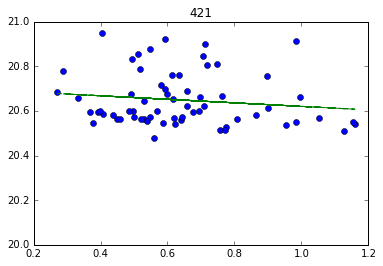

-0.0791187705518


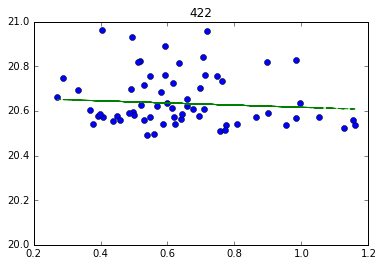

-0.0482428855417


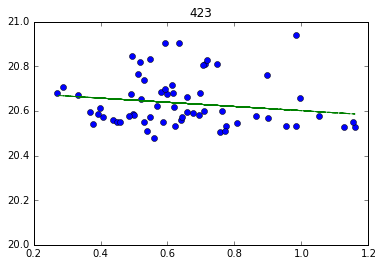

-0.0937367222261


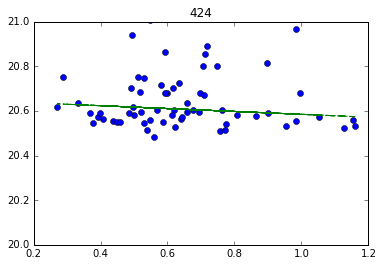

-0.064300251905


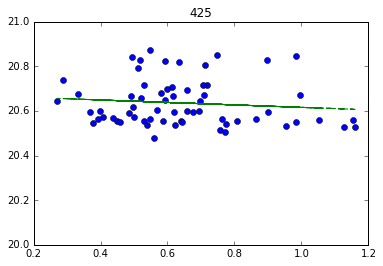

-0.0551121410021


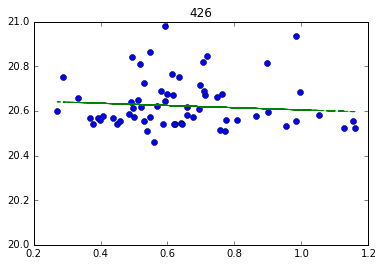

-0.0495949095426


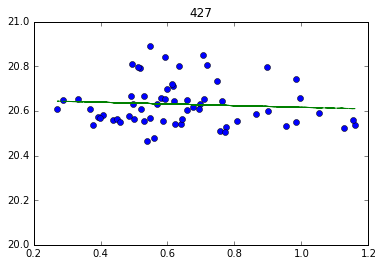

-0.0376902215522


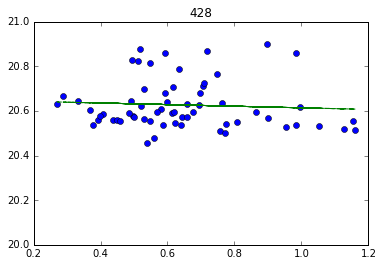

-0.035965246431


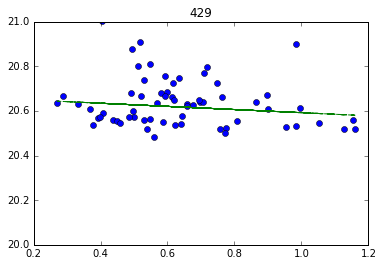

-0.070606813021


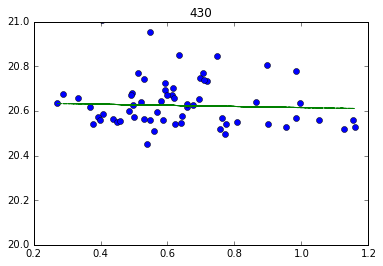

-0.0250483750504


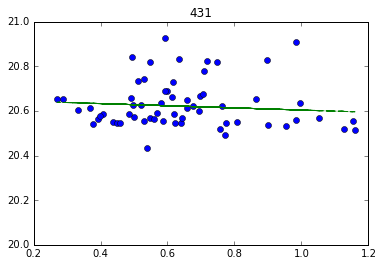

-0.0481866482649


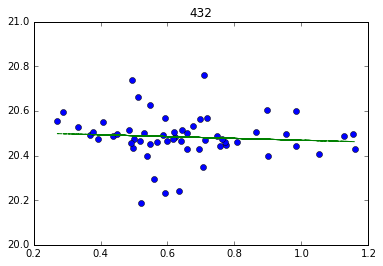

-0.040611478802


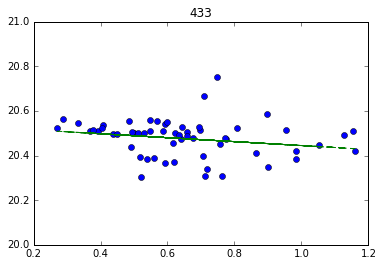

-0.0880478937423


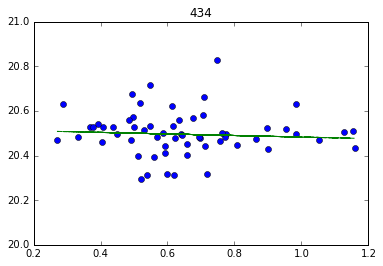

-0.034694146474


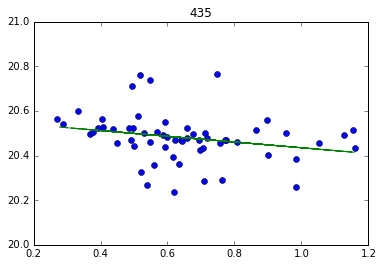

-0.128195455117


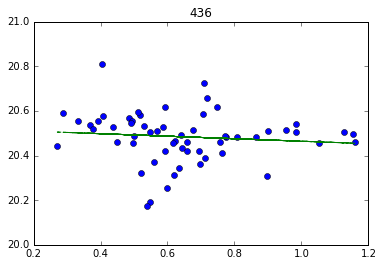

-0.0561781358031


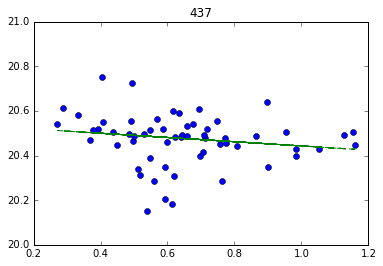

-0.0948045793386


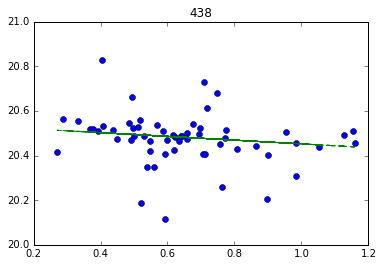

-0.0839159717765


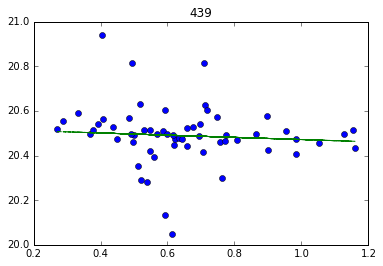

-0.0491150683907


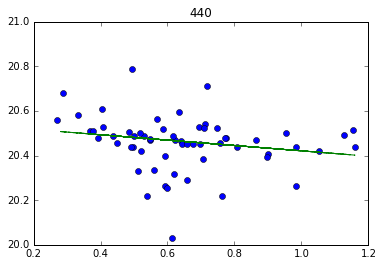

-0.120072823635


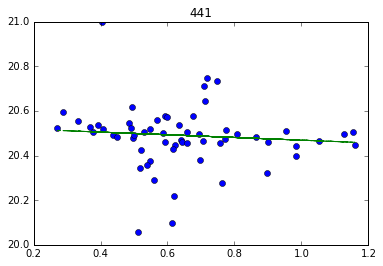

-0.060235821552


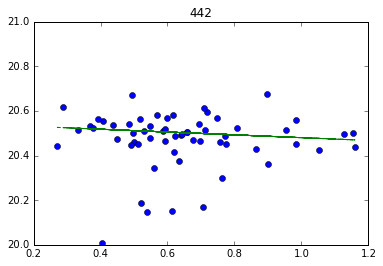

-0.0631142717042


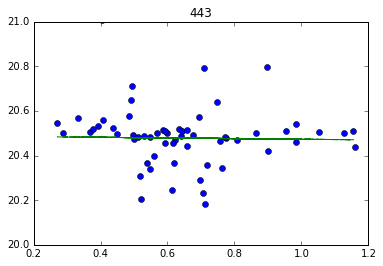

-0.0143391313816


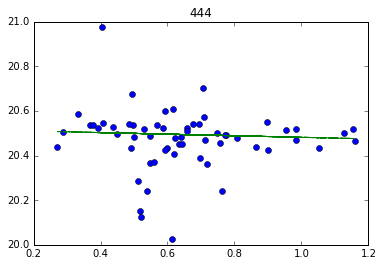

-0.0349991217393


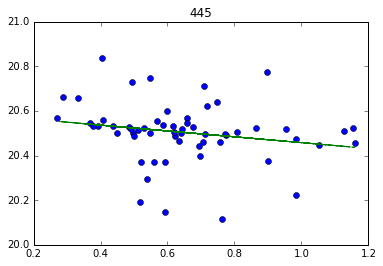

-0.130933161148


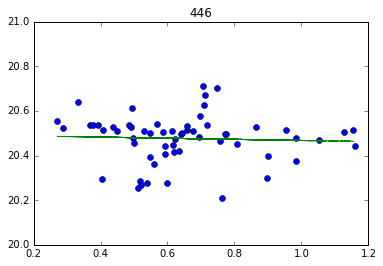

-0.0249146868944


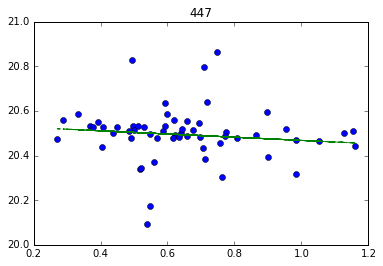

-0.0715842889851


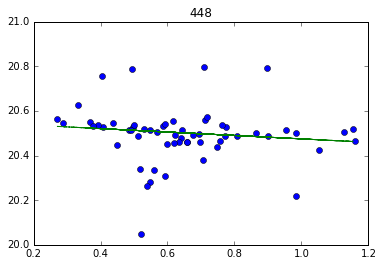

-0.0766511877807


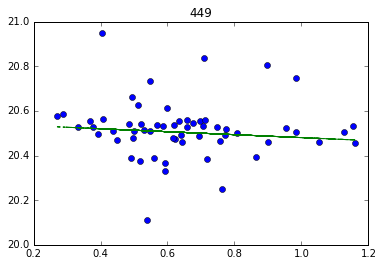

-0.0662261958804


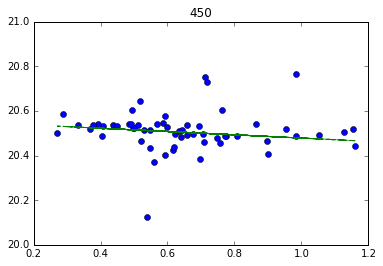

-0.0732996765608


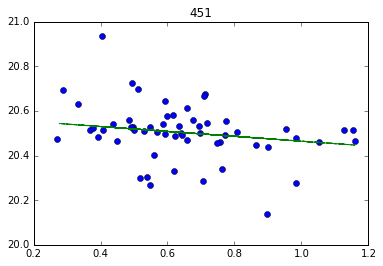

-0.1092965192


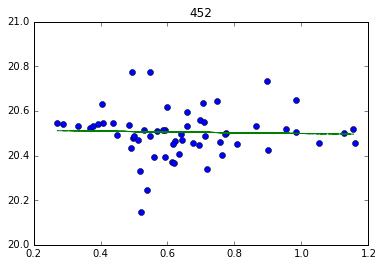

-0.0173403101845


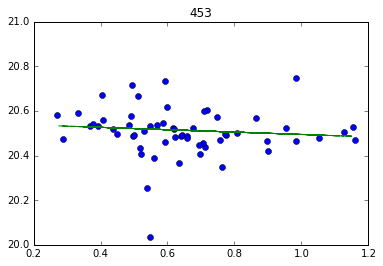

-0.0530758524081


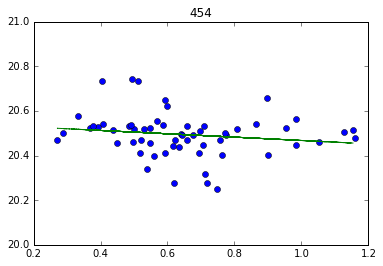

-0.0749154814121


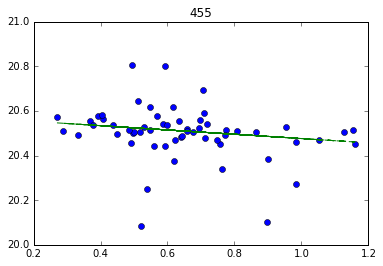

-0.0962266203439


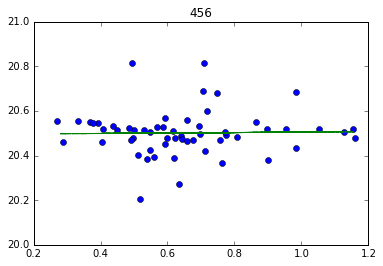

0.0101089233418


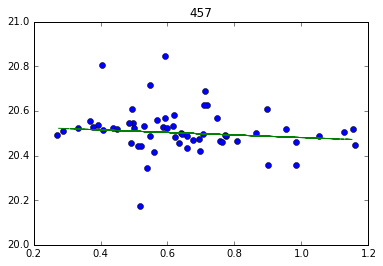

-0.0571214935482


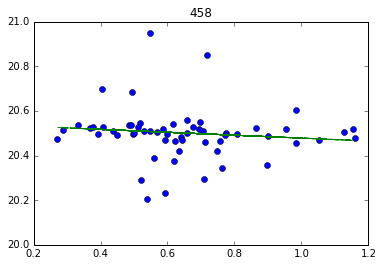

-0.0652722725915


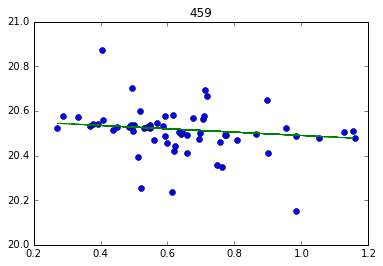

-0.0750891530085


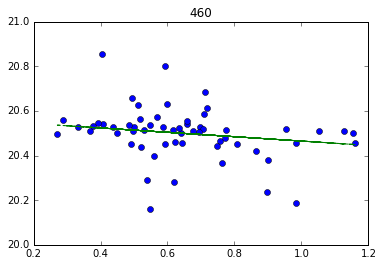

-0.0977985156596


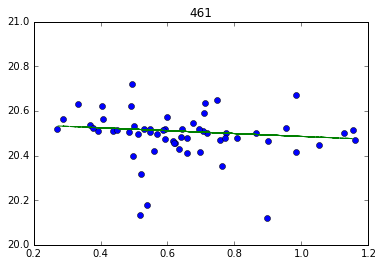

-0.0643689697041


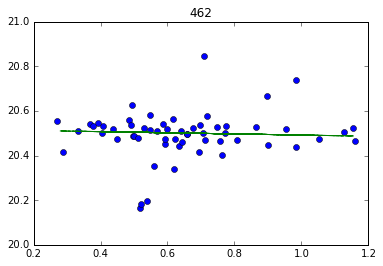

-0.0256153482334


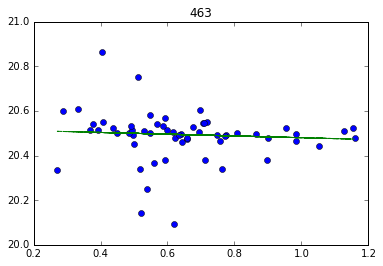

-0.039305263982


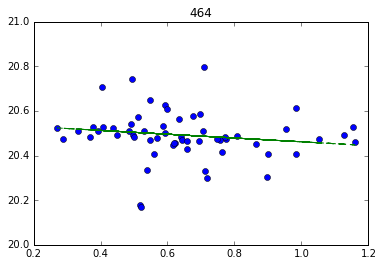

-0.0849582832591


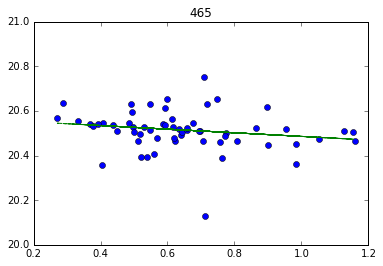

-0.0810680845123


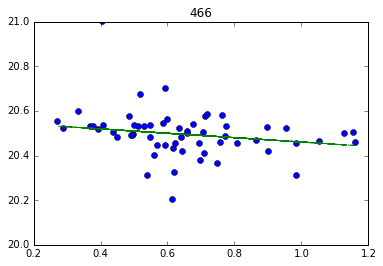

-0.0978886450905


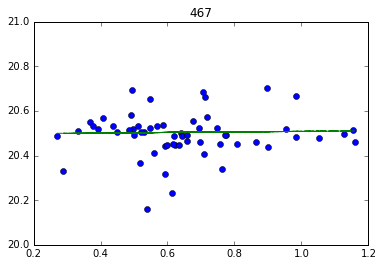

0.0121633430702


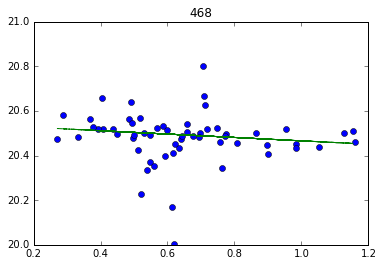

-0.0756744808843


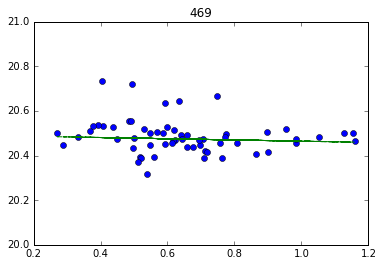

-0.0272973964008


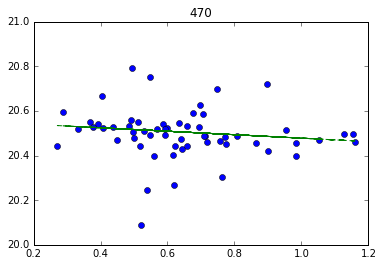

-0.0774384554887


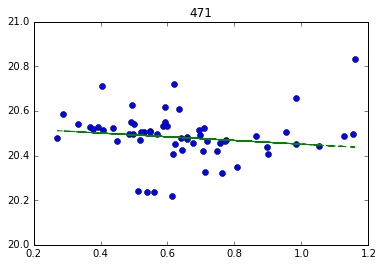

-0.08287113394


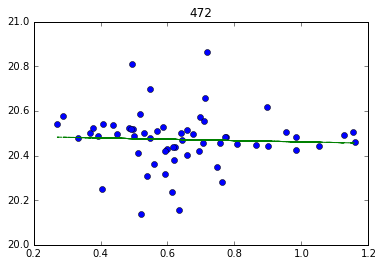

-0.0290717785313


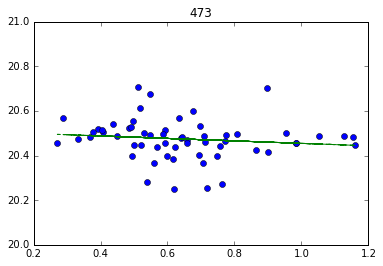

-0.055269930468


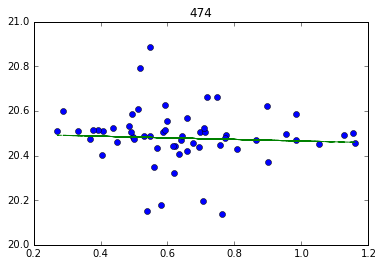

-0.0356308596282


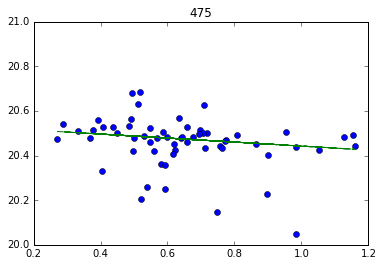

-0.0897539590844


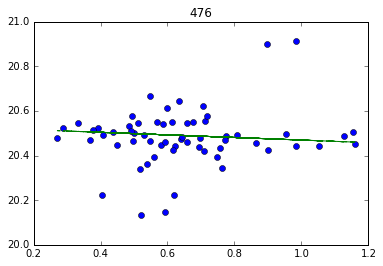

-0.0578238151621


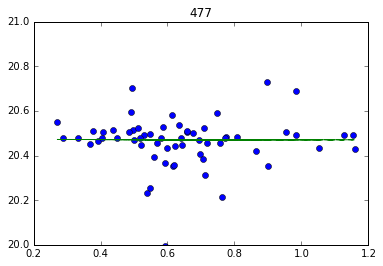

-0.00146218832635


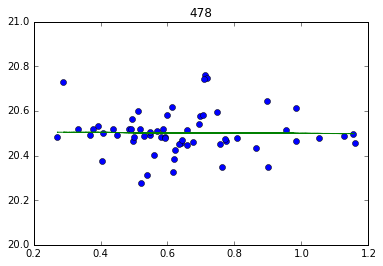

-0.00701132414159


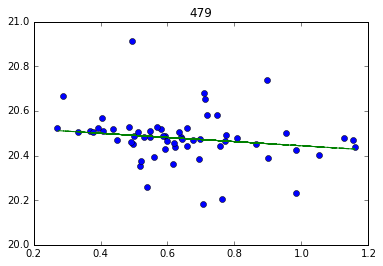

-0.0933056538467


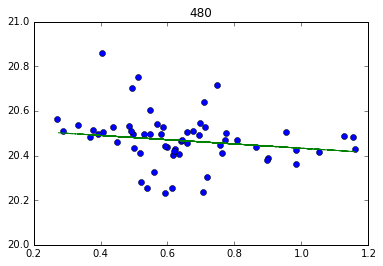

-0.0953761218136


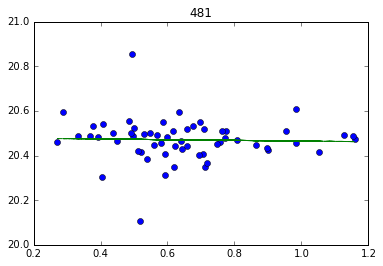

-0.0152976781259


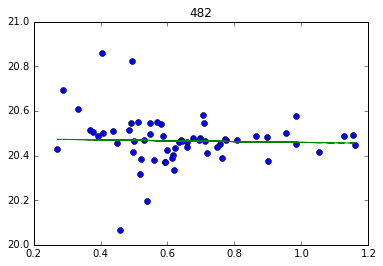

-0.0188746946242


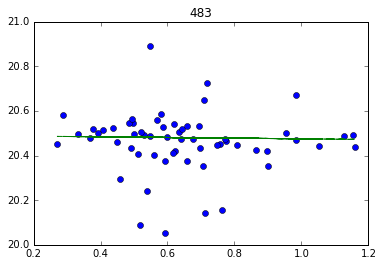

-0.0148849209683


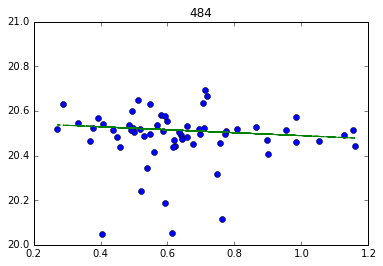

-0.0663116528275


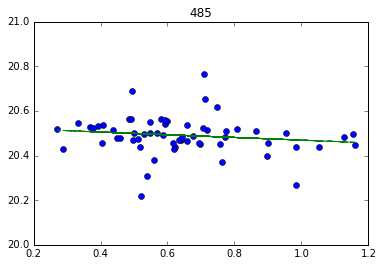

-0.060585156818


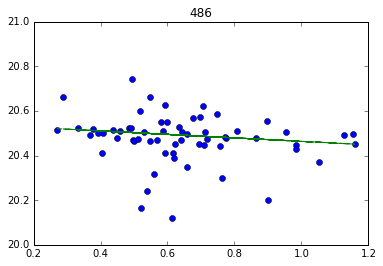

-0.0779291241938


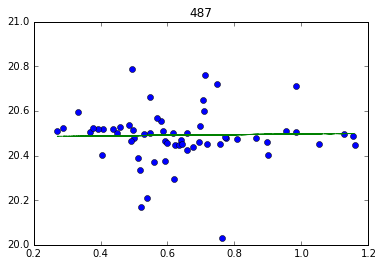

0.0143042015242


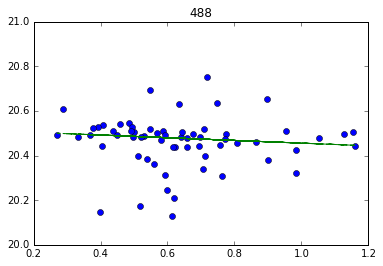

-0.0605642247357


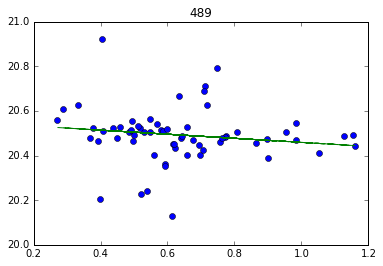

-0.0913566911242


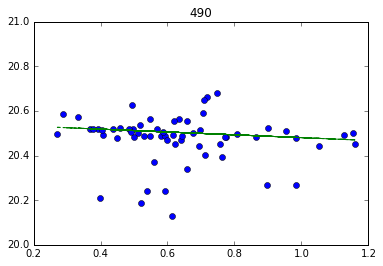

-0.0635442344481


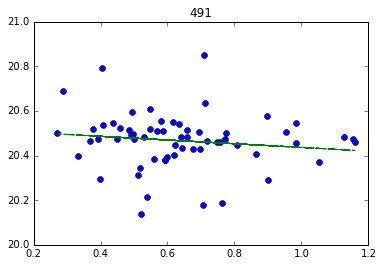

-0.0830458795609


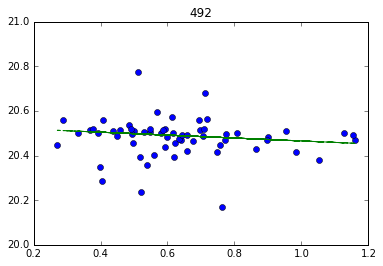

-0.0653150304326


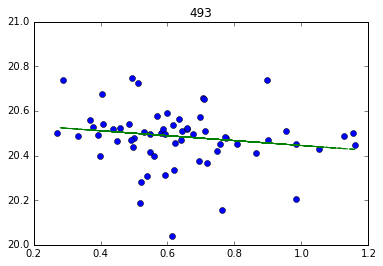

-0.109954917672


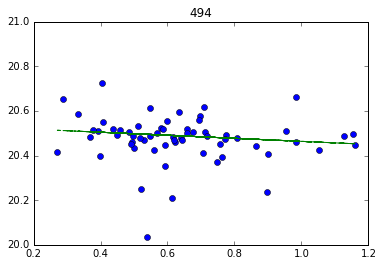

-0.068012254669


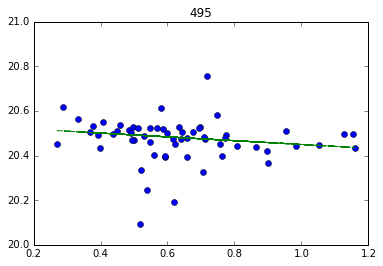

-0.0850213851676


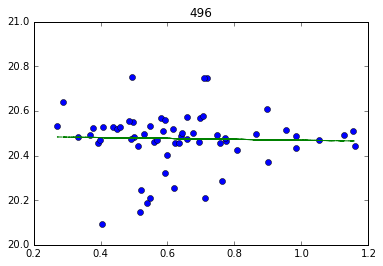

-0.0201189902658


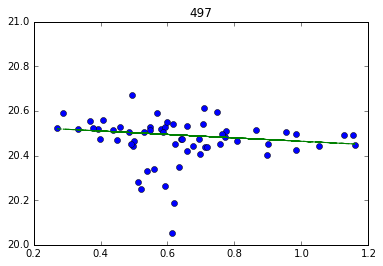

-0.0765801356846


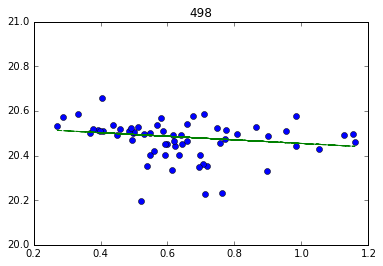

-0.0803382450768


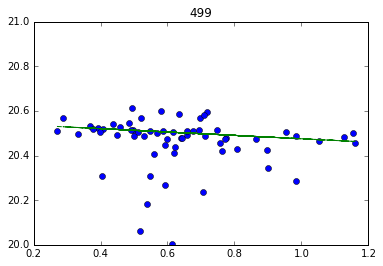

-0.0755433173957


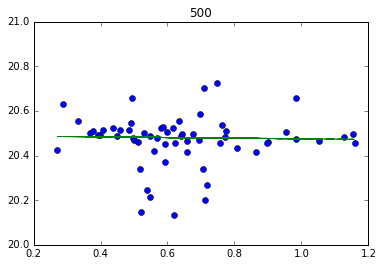

-0.0142619890676


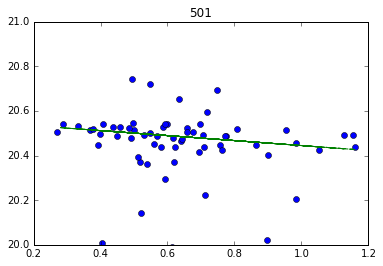

-0.111587599598


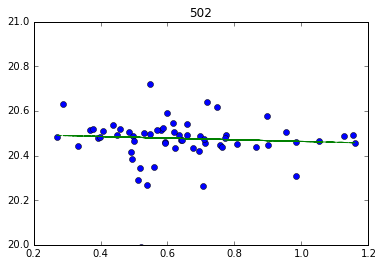

-0.0370359445623


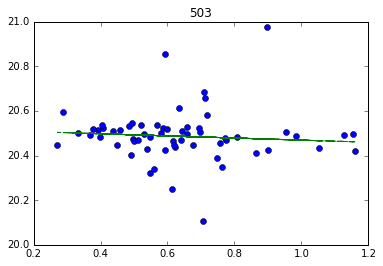

-0.0475638920331


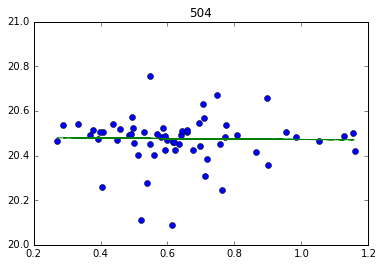

-0.0101015940114


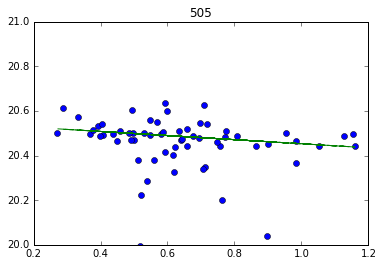

-0.0917487483228


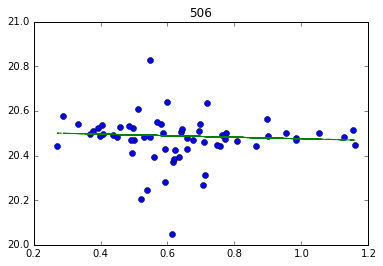

-0.034755815956


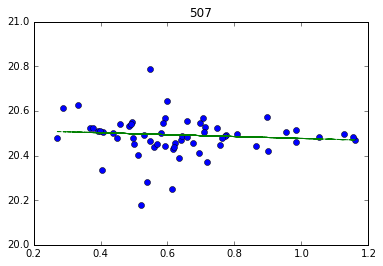

-0.042355725349


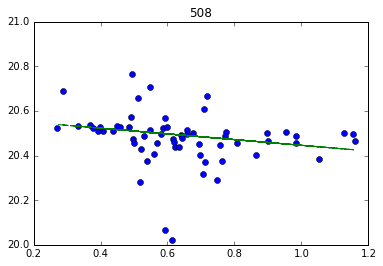

-0.127973508569


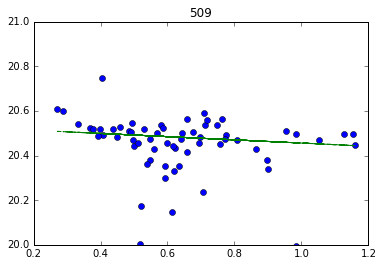

-0.0718727822657


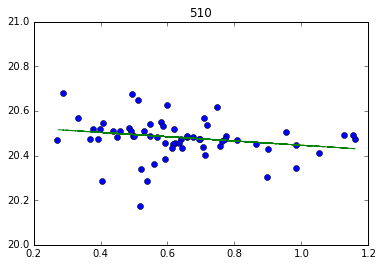

-0.0957289805107


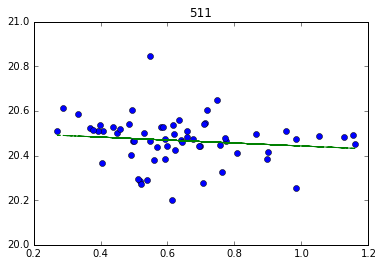

-0.0662538107779


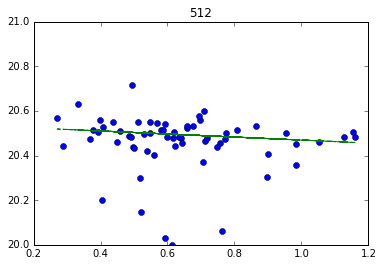

-0.0678975891767


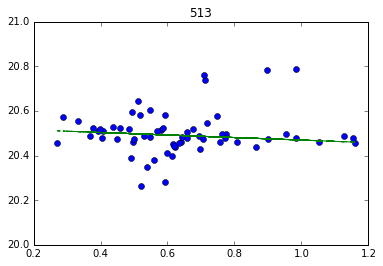

-0.0567655260151


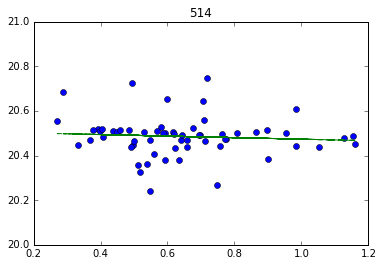

-0.0343138771917


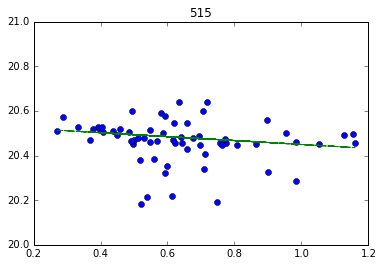

-0.0877158979016


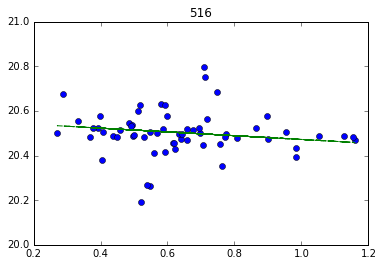

-0.0844916741187


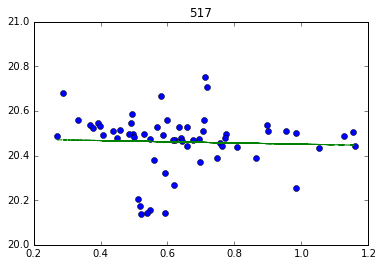

-0.0269497065998


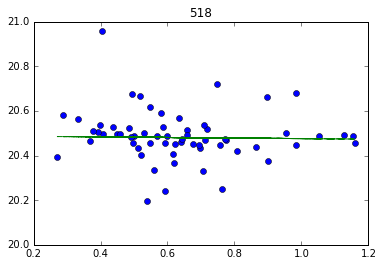

-0.012571312285


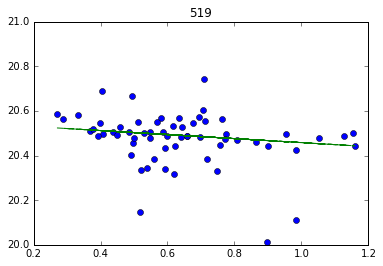

-0.0900256606074


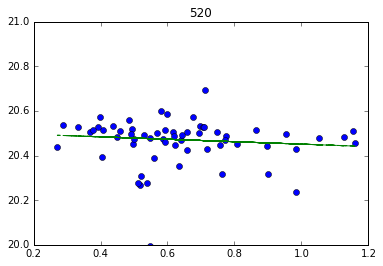

-0.0544574613262


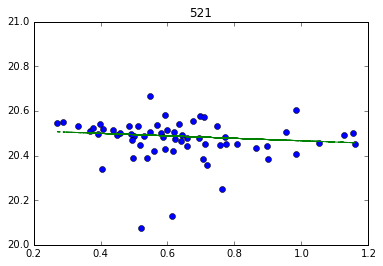

-0.0552680814842


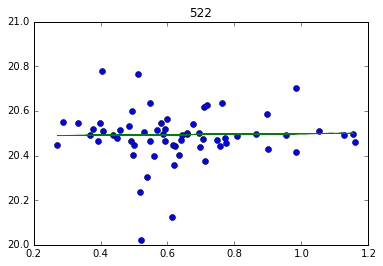

0.0117810514358


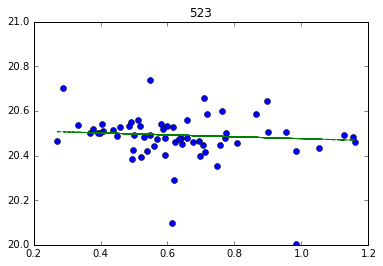

-0.0429088186973


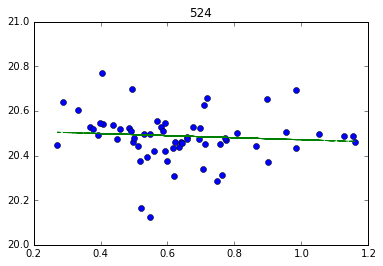

-0.0460707486267


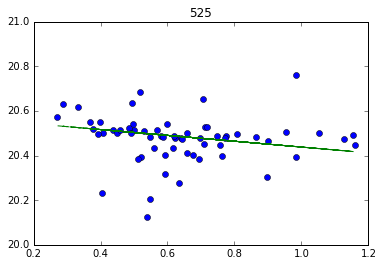

-0.130667315525


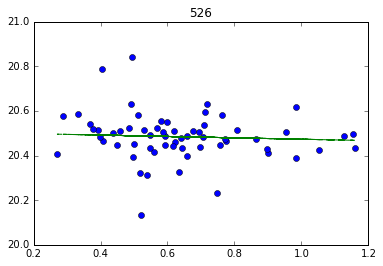

-0.0309106472224


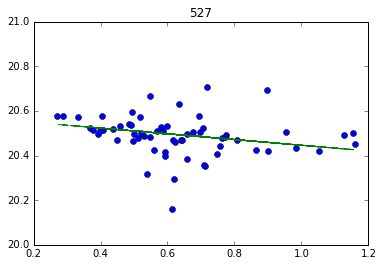

-0.128013868968


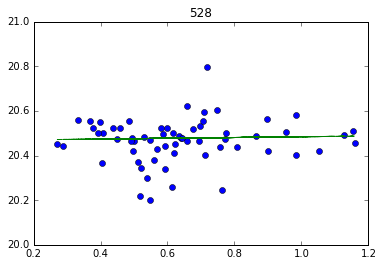

0.0170295948539


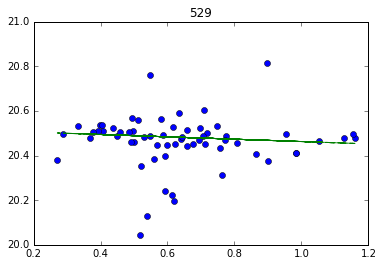

-0.0526767937011


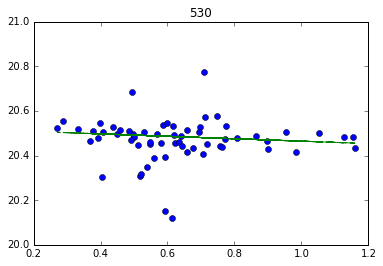

-0.0541901982466


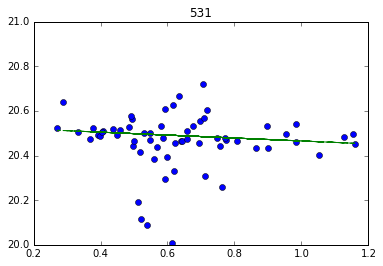

-0.0656916979424


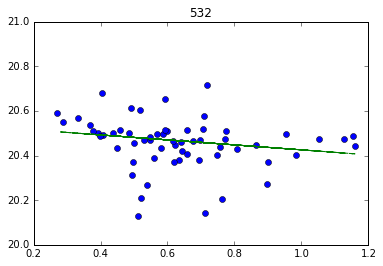

-0.11146570042


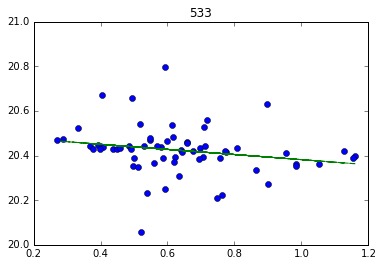

-0.114666702957


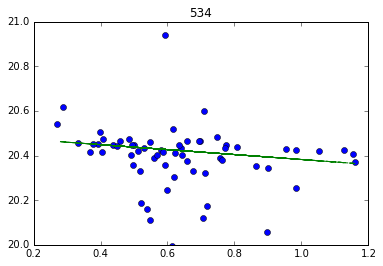

-0.110791257243


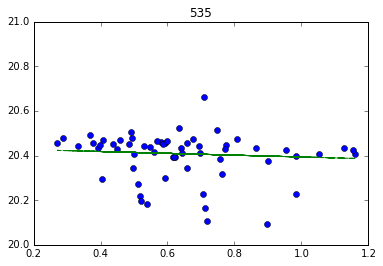

-0.0407485068058


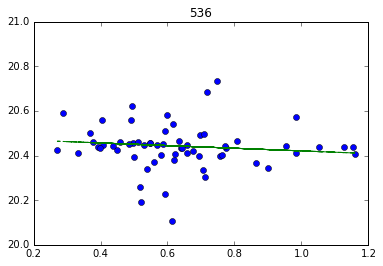

-0.0593638807695


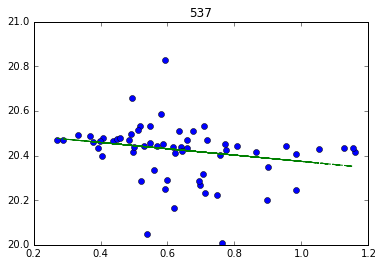

-0.141378854058


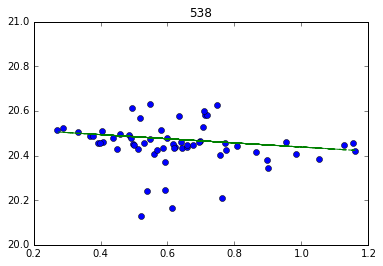

-0.0926556899396


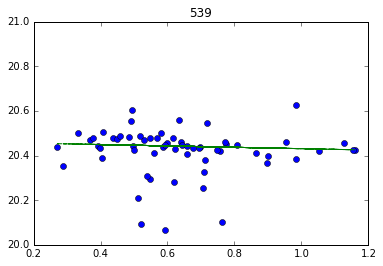

-0.0307139466671


In [10]:
corrections, BminusV = color_corrections(aij_stars, aij_mags,apass_index, apass_color, apass_R_mags, good_match)

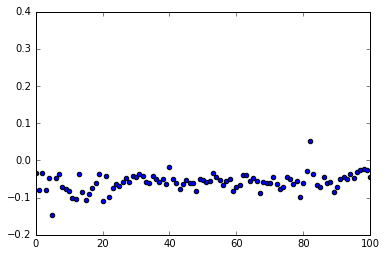

In [11]:
#This just plots the slope of the linear fit for all images
for image in range(aij_mags.shape[1]):
    plt.xlim(0,100)
    plt.scatter(image, corrections[image][0])

• Source Radius: radius of the aperture used to calculate
net integrated counts. In fixed aperture mode, this value
is the aperture radius set by the user. In variable aperture
mode, this value represents the actual aperture radius
calculated as the product of the average FWHM in
the image and the multiplicative factor set in the MultiAperture
Measurements set up panel.

• FWHM mult: in variable aperture mode, this value is
the FWHM multiplier set in the Multi-Aperture Measurements
set up panel. In fixed aperture mode, this
column is not included in the table.

• Source Rad(base): in variable aperture mode, this
value represents the fixed aperture radius set by the user
and should be set to a number greater than 1.5 times the
maximum FWHM expected to ensure proper measurement
of FWHM. In fixed aperture mode, this column is
not included in the table.

• Sky Rad(min): radius of the inner edge of the annulus
used to calculate the sky background

• Sky Rad(max): radius of the outer edge of the annulus
used to calculate the sky background

In [12]:
#Calculate the error in the magnitudes to be used in the apass calibration
%matplotlib inline
#define the gain of the ccd
gain = 1.5
#define the read noise of the ccd
read_noise = 30.0


npix = np.pi * 15**2  # pixel^2, estimated aperture size
n_sky = 50.0   # counts/pixel, estimated upper limit

mag_err = mag_error(aij_raw, gain, read_noise, sources)

here in the object loop, we are now studying object number 0
-0.0207932584666
20.1963328168
-8.22313540409
11.9524041542
here in the object loop, we are now studying object number 1
here in the object loop, we are now studying object number 2
here in the object loop, we are now studying object number 3
here in the object loop, we are now studying object number 4
here in the object loop, we are now studying object number 5
here in the object loop, we are now studying object number 6
here in the object loop, we are now studying object number 7
here in the object loop, we are now studying object number 8
here in the object loop, we are now studying object number 9
here in the object loop, we are now studying object number 10
here in the object loop, we are now studying object number 11
here in the object loop, we are now studying object number 12
here in the object loop, we are now studying object number 13
here in the object loop, we are now studying object number 14
here in the object l

notebook_functions.py:318: UserWarning: Warning: converting a masked element to nan.
  corrected_curves[obj] = np.array(tmp_data)


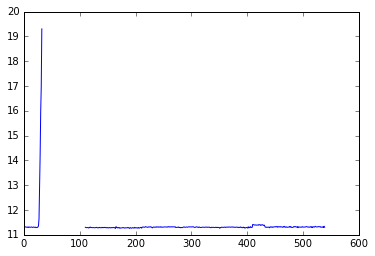

In [13]:
'''
#create an array to store the corrected curves
corrected_curves = np.zeros_like(aij_mags)
#create an array to store the error in the corrected curves
corrected_curves_er = np.zeros_like(aij_mags)
#create an array to store the signal to noise ratios for all stars
all_SNR = np.zeros_like(aij_mags)
#loop over all of the stars
for obj in range(len(aij_stars)):
    #print a little update just to know where the progress is at
    print('here in the object loop, we are now studying object number', str(obj))
    #initialize a list to store the magnitudes for that star
    tmp_data = []
    #initialse a list to store the error
    tmp_data_er = []
    #get the error in the apass color for the star
    er_BV = all_apass_color_error[apass_index_for_color[obj]]
    #get the apass color for the star
    BminusV = all_apass_color[apass_index_for_color[obj]]
    #loop over all of the images
    for image in range(aij_mags.shape[1]):
        ###Date | get the date of the image using glowing waffles
        JD = aij_stars[0].mjd_start[image]
        ###Magnitude | calculate the color term for the star in the image (BminusV * slope)
        color_term = BminusV*corrections[image][0]
        #define the slope intercept
        intercept = corrections[image][1]
        #define the instrumental magnitude
        old_mag = aij_stars[obj].magnitude[image]
        #calculate the new magnitdue (instrumental + slope intercept + color term)
        new_mag = old_mag+intercept+color_term
        if obj == 0 and image == 0:
            print(color_term)
            print(intercept)
            print(old_mag)
            print(new_mag)
        #add the new apass corrected magnitude to the list of magnitudes for that star
        tmp_data.append(new_mag)
        """###Error
        ##Error in color term
        #Error in slope | calcuate fractional uncertainty in the slope
        frac_unc_slope = slope_error[image]/corrections[image][0]
        #Error in B-V | calcualte fractional uncertainty in the color
        frac_unc_BV = er_BV/BminusV
        
        #Calcualte the error in the color term
        color_err = np.sqrt(frac_unc_slope**2+frac_unc_BV**2)*color_term
        ##Error in intercept term | define the error in the intercept (why?)
        er_intercept = intercept_error[image]
        ##Error in old mag | calcualte the SNR of the instrumental magnitude (is this even right?)
        SNR = np.sqrt(aij_stars[obj].counts)
        #Calcualte the error in the instrumental magnitude
        er_old_mag = 1/SNR[image]
        #put the SNR of the image into the all_SNR array
        all_SNR[obj, image] = SNR[image]
        
        #Calcualte the error in the corrected magnitude
        er = np.sqrt(er_old_mag**2+er_intercept**2+color_err**2)
        #append the error in the corrected magnitude to the error list
        tmp_data_er.append(er)""" #Need to figure out how to get error out of Huber Loss Function (understand the '~')
        ###Plot
        #plt.errorbar(JD, new_mag, yerr=er, color='grey')
        #plt.errorbar(JD, new_mag, color='red', xerr=0.0005)
    #set the star's index in the corrected_curves array to an array of the new magnitudes
    corrected_curves[obj] = np.array(tmp_data)
    #set the star's index in the corrected_curves_er array to an array of the magnitude error
    #corrected_curves_er[obj] = tmp_data_er
    #plt.title('Source_C'+str(obj+1))
    #plt.show()
'''
corrected_curves = corrected_curves(aij_mags, aij_stars, all_apass_color, all_apass_color_error, apass_index_for_color, BminusV, corrections)

#Plot the corrected light curve of star index 0
plt.plot(corrected_curves[5])    #looks kinda screwed up... shouldn't they meet into eachother smoothly with the 
                                 #apass corrections. They are on different nights and all but still...?

In [14]:
#create an array of the dates each image was taken at (JD rounded to day)
night = np.array(np.floor(np.array(aij_stars[0].mjd_start + 0.5)) -1)
#find the unique nights in the array of nights
unique_nights = np.unique(night)
#take out one of the nights if you want
unique_nights = set(unique_nights)# - set([57249.0])
#sort the list of nights obviously
unique_nights = sorted(unique_nights)
#find the number of nights to be used for plotting
number_of_nights = len(unique_nights)

night_stdev = [[] for night_n in range(number_of_nights)]
for index, star in enumerate(aij_stars):
    
    #loop over all of the nights and their index in unique nights
    for i, this_night in enumerate(unique_nights):
        #create a night mask that is a boolean in the shape of night
        night_mask = (night == this_night)
        stdev = np.std(corrected_curves[index][night_mask])
        night_stdev[i].append(stdev)

comp_stars = []

for index, stdevs in enumerate(night_stdev):
    good_comps = list(np.argpartition(np.array(stdevs),5)[2:7])
    comp_stars.append(good_comps)

## Functions for making single magnitude plot
### This section is taken from the multi-night photometry notebook from a kelt-1 notebook.

In [15]:
#define array for the comparison magnitudes
corrected_counts = 10**(-(corrected_curves-2.5*np.log10(aij_raw['EXPOSURE']))/2.5)
comp_counts = []

for i, this_night in enumerate(unique_nights):
        #create a night mask that is a boolean in the shape of night
        night_mask = (night == this_night)
        comp = np.zeros(sum(night_mask))
        for star in comp_stars[i]:
            if star not in (4, 12, 17):
                comp += corrected_counts[star][night_mask]
        comp_counts += list(comp)
comp_counts = np.array(comp_counts)

#calculate the differential magnitudes by simply taking the difference between the corrected curves and the comparison magnitudes"""
diff_corrected = -2.5*np.log10(corrected_counts/comp_counts)

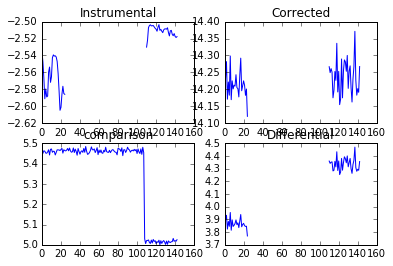

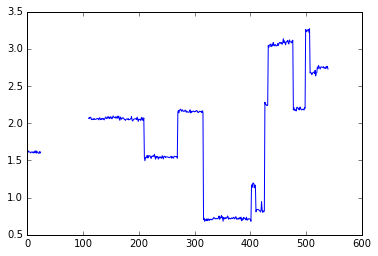

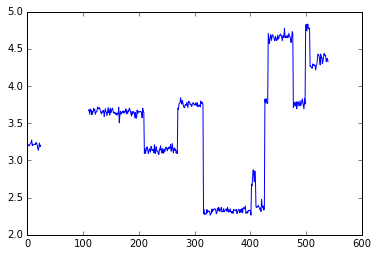

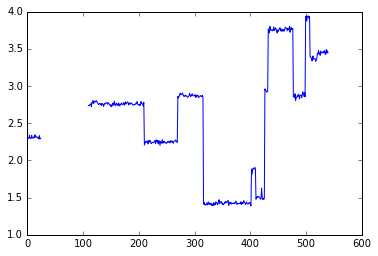

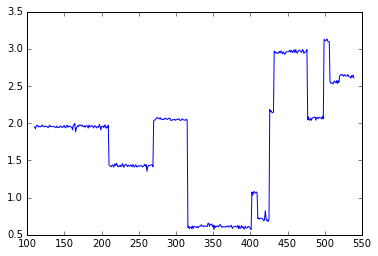

...

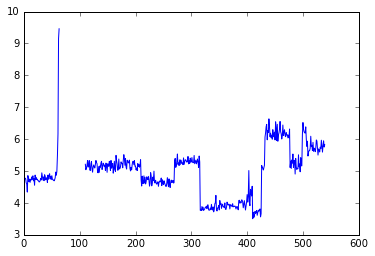

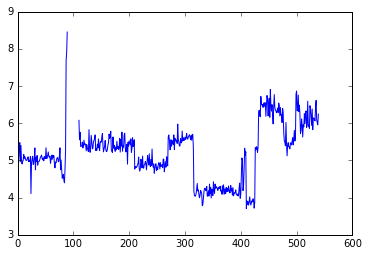

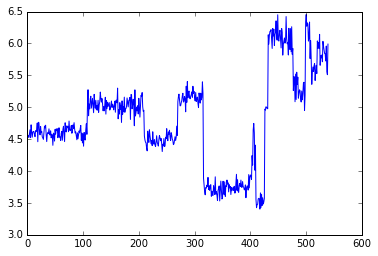

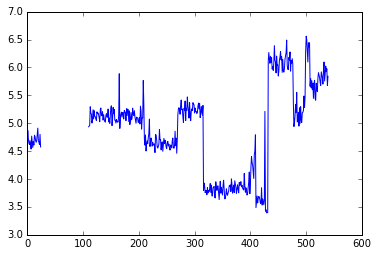

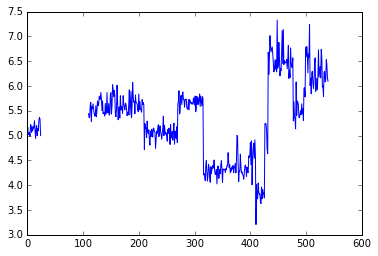

In [16]:
%matplotlib inline
plt.subplot(2,2,1)
#Plot the instrumental magnitudes
plt.plot(aij_mags[10][0:143])
plt.title('Instrumental')

plt.subplot(2,2,2)
#plot the apass corrected curves
plt.plot(corrected_curves[10][0:143])
plt.title('Corrected')

plt.subplot(2,2,3)
#plot the comparison stars curve
plt.plot(-2.5*np.log10(comp_counts[0:143]))
plt.title('comparison')

plt.subplot(2,2,4)
#plot the difference between the apass star and the comparison star.
plt.plot(diff_corrected[10][0:143])
plt.title('Differential')
plt.show()
for count in range(30):
    plt.plot(diff_corrected[count])
    plt.show()

In [17]:
#print the first point in the first star of the corrected curves as a check for an external check that was done
print(corrected_curves[0][0])

11.9524041542


/Users/erinaadland/anaconda/envs/ast366/lib/python2.7/site-packages/matplotlib/axes/_base.py:3045: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=inf, top=inf
  'bottom=%s, top=%s') % (bottom, top))
/Users/erinaadland/anaconda/envs/ast366/lib/python2.7/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


', errors = corrected_curves_er[index][night_mask]'

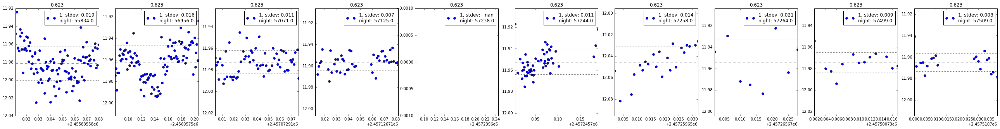

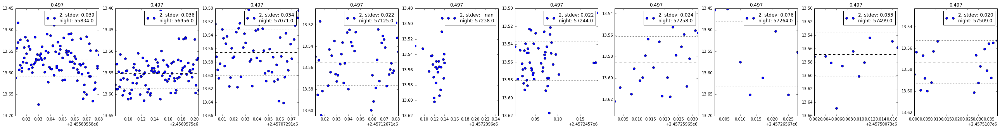

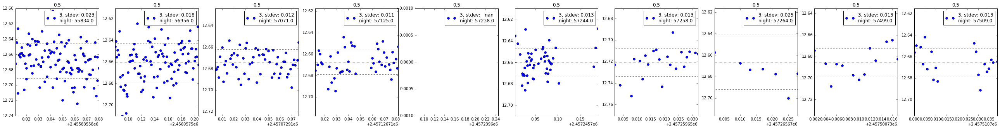

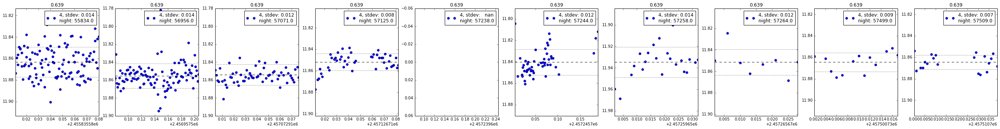

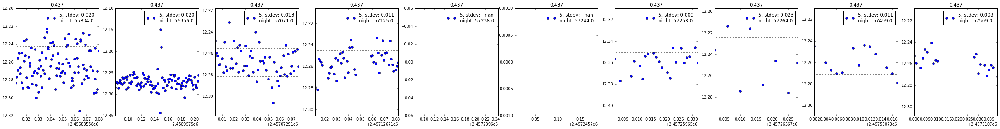

...

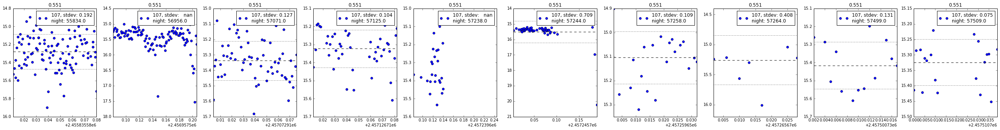

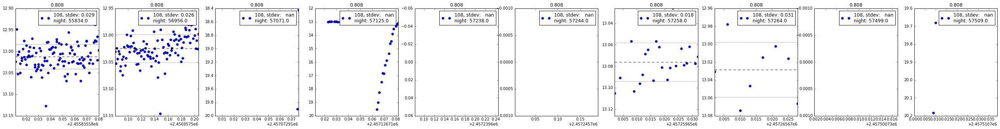

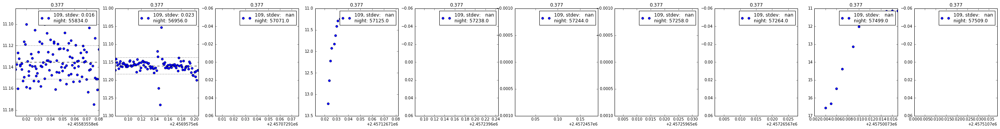

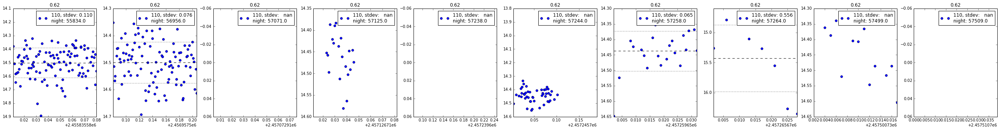

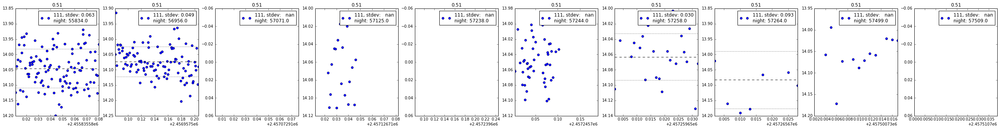

In [18]:
%matplotlib inline
#loop over all of the stars and their index
for index, star in enumerate(aij_stars):
    #start a figure...
    plt.figure(figsize=(5*number_of_nights, 5))
    
    #define a list for night means
    night_means = []
    #define a list for night standard deviations
    night_stds = []
    #define a list for night bins? I suppose
    night_bins = []
    #get the color of the star
    BminusV = all_apass_color[apass_index_for_color[index]]
    #loop over all of the nights and their index in unique nights
    for i, this_night in enumerate(unique_nights):
        plt.subplot(1, number_of_nights + 1, i + 1)
        #create a night mask that is a boolean in the shape of night
        night_mask = (night == this_night)
        #get the night mean and std from the plot magnitudes function and plot the magnitudes
        night_mean, night_std = plot_magnitudes_viewer(mags=corrected_curves[index][night_mask], 
                                                times=aij_raw['BJD_TDB'][night_mask], source = index+1,
                                               night = this_night, color = BminusV)
""", errors = corrected_curves_er[index][night_mask]"""

In [19]:
from astropy.table import Table, Column
t = Table(rows = corrected_curves)
cols = [Column(curve, name=str(idx+1)) for idx, curve in enumerate(corrected_curves)]
t_with_date = Table(cols)
date = aij_raw['BJD_TDB']
t_with_date.add_column(date)
t_with_date.write('updated_measurements_2.csv', format = 'csv')
print(t_with_date)
#print(comp_stars[0])

      1             2             3       ...      111        BJD_TDB  
------------- ------------- ------------- ... ------------- -----------
11.9524041542 13.5286394269 12.6572700902 ...           inf 2457239.682
11.9437281336 13.5321851152 12.6348338886 ...           inf 2457239.697
11.9773289633 13.5617151267 12.6501661266 ...           inf 2457239.709
11.9600143569  13.541682518 12.6440897848 ...           inf 2457239.714
11.9518021926  13.541311114 12.6777198813 ...           inf 2457239.715
11.9493734926  13.553063881 12.6323320218 ...           inf 2457239.717
11.9439062564 13.5695684912 12.6401010042 ...           inf 2457239.718
11.9625680622 13.5964491773  12.648795165 ...           inf 2457239.719
 11.942576273 13.6014146482 12.6635674975 ...           inf  2457239.72
11.9704167131 13.5563375722 12.6658268038 ...           inf 2457239.722
          ...           ...           ... ...           ...         ...
11.9785926066 13.5314532234 12.6858263233 ... 14.1344914358 2455

In [68]:
%matplotlib inline
#loop over all of the stars and their index
for index, star in enumerate(aij_stars):
    #start a figure...
    plt.figure(figsize=(5*number_of_nights, 5))
    
    #define a list for night means
    night_means = []
    #define a list for night standard deviations
    night_stds = []
    #define a list for night bins? I suppose
    night_bins = []
    #get the color of the star
    BminusV = all_apass_color[apass_index_for_color[index]]
    #loop over all of the nights and their index in unique nights
    for i, this_night in enumerate(unique_nights):
        plt.subplot(1, number_of_nights + 1, i + 1)
        #create a night mask that is a boolean in the shape of night
        night_mask = (night == this_night)
        #get the night mean and std from the plot magnitudes function and plot the magnitudes
        night_mean, night_std = plot_magnitudes(mags=diff_corrected[index][night_mask], 
                                                times=aij_raw['BJD_TDB'][night_mask], source = index+1,
                                               night = this_night, color = BminusV)
""", errors = corrected_curves_er[index][night_mask]"""

KeyboardInterrupt: 

KeyboardInterrupt: 

In [ ]:
apass_r_mags = apass_in_bright['r_mag']
apass_R_mags = filter_transform(apass_in_bright, 'R', r='r_mag', i='i_mag')
apass_bv = apass_in_bright['B-V']
aij_R = 
apassr_i = apass_in_bright['r_mag'] - apass_in_bright['i_mag']
apassR_r = apass_R_mags - apass_r_mags 

plt.plot(apass_bv, apassR_r, 'o')
#plt.plot(apassr_i, apassR_r, '-')

In [ ]:
A = -0.0107
B = 0.0050
C = -0.2689
D = -0.1540
c = np.arange(-0.30,-0.16,50)
R_mag = (A * (c**3)) + (B * (c**2)) + (C * c) + D + apass_r_mags
plt.plot()

In [ ]:
from scipy import optimize
#Huber Loss Function test from 'Statistics, Data Mining, and Machine Learning in Astronomy' (Ivezic et al. 2014)
y = np.array(testRminusr)
x = np.array(testBminusV)
dy = np.zeros(14)+0.01
print(len(x), len(y), len(dy))

# Define the standard squared-loss function
def squared_loss(m, b, x, y, dy):
    y_fit = m * x + b
    return np.sum(((y - y_fit) / dy) ** 2, -1)


# Define the log-likelihood via the Huber loss function
def huber_loss(m, b, x, y, dy, c=2):
    y_fit = m * x + b
    t = abs((y - y_fit) / dy)
    flag = t > c
    return np.sum((~flag) * (0.5 * t ** 2) - (flag) * c * (0.5 * c - t), -1)

f_squared = lambda beta: squared_loss(beta[0], beta[1], x=x, y=y, dy=dy)
f_huber = lambda beta: huber_loss(beta[0], beta[1], x=x, y=y, dy=dy, c=1)

#------------------------------------------------------------
# compute the maximum likelihood using the huber loss
beta0 = (2, 30)
beta_squared = optimize.fmin(f_squared, beta0)
beta_huber = optimize.fmin(f_huber, beta0)

print(beta_squared)
print(beta_huber)
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111)

x_fit = np.linspace(0, 20, 10)
ax.plot(x_fit, beta_squared[0] * x_fit + beta_squared[1], '--k',
        label="squared loss:\n $y=%.2fx + %.1f$" % tuple(beta_squared))
ax.plot(x_fit, beta_huber[0] * x_fit + beta_huber[1], '-k',
        label="Huber loss:\n $y=%.2fx + %.1f$" % tuple(beta_huber))
ax.legend(loc=4)

ax.errorbar(x, y, dy, fmt='.k', lw=1, ecolor='gray')

#ax.set_xlim(0, 350)
#ax.set_ylim(100, 700)
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')

plt.show()